# Imports

In [1]:
import json
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime
from collections import Iterable
import sklearn
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import mean_absolute_error
from keras.callbacks import EarlyStopping
from keras.layers import Bidirectional
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import itertools
from itertools import product
import xgboost # can compare different models in lit
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
import warnings
warnings.filterwarnings('ignore')
import statsmodels
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LassoCV
import tensorflow
from xgboost import XGBClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
import statsmodels
from statsmodels.tsa.stattools import adfuller
from sklearn import metrics

<ipython-input-1-341851091311>:9: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Iterable


In [2]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error

In [3]:
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import TimeDistributed

In [4]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

In [5]:
from sklearn.utils.validation import check_consistent_length, check_array


# Authors: Alexandre Gramfort <alexandre.gramfort@inria.fr>
#          Mathieu Blondel <mathieu@mblondel.org>
#          Olivier Grisel <olivier.grisel@ensta.org>
#          Arnaud Joly <a.joly@ulg.ac.be>
#          Jochen Wersdorfer <jochen@wersdoerfer.de>
#          Lars Buitinck
#          Joel Nothman <joel.nothman@gmail.com>
#          Karan Desai <karandesai281196@gmail.com>
#          Noel Dawe <noel@dawe.me>
#          Manoj Kumar <manojkumarsivaraj334@gmail.com>
#          Michael Eickenberg <michael.eickenberg@gmail.com>
#          Konstantin Shmelkov <konstantin.shmelkov@polytechnique.edu>
#          Christian Lorentzen <lorentzen.ch@googlemail.com>
#          Ashutosh Hathidara <ashutoshhathidara98@gmail.com>
# License: BSD 3 clause
# date: 09/08/2021
# Availabiloty: https://causalml.readthedocs.io/en/latest/_modules/sklearn/metrics/_regression.html

def mean_absolute_percentage_error(y_true, y_pred,
                                   sample_weight=None,
                                   multioutput='uniform_average'):
    """Mean absolute percentage error regression loss.
    Note here that we do not represent the output as a percentage in range
    [0, 100]. Instead, we represent it in range [0, 1/eps]. Read more in the
    :ref:`User Guide <mean_absolute_percentage_error>`.
    .. versionadded:: 0.24
    Parameters
    ----------
    y_true : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Ground truth (correct) target values.
    y_pred : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Estimated target values.
    sample_weight : array-like of shape (n_samples,), default=None
        Sample weights.
    multioutput : {'raw_values', 'uniform_average'} or array-like
        Defines aggregating of multiple output values.
        Array-like value defines weights used to average errors.
        If input is list then the shape must be (n_outputs,).
        'raw_values' :
            Returns a full set of errors in case of multioutput input.
        'uniform_average' :
            Errors of all outputs are averaged with uniform weight.
    Returns
    -------
    loss : float or ndarray of floats in the range [0, 1/eps]
        If multioutput is 'raw_values', then mean absolute percentage error
        is returned for each output separately.
        If multioutput is 'uniform_average' or an ndarray of weights, then the
        weighted average of all output errors is returned.
        MAPE output is non-negative floating point. The best value is 0.0.
        But note the fact that bad predictions can lead to arbitarily large
        MAPE values, especially if some y_true values are very close to zero.
        Note that we return a large value instead of `inf` when y_true is zero.
    Examples
    --------
    >>> from sklearn.metrics import mean_absolute_percentage_error
    >>> y_true = [3, -0.5, 2, 7]
    >>> y_pred = [2.5, 0.0, 2, 8]
    >>> mean_absolute_percentage_error(y_true, y_pred)
    0.3273...
    >>> y_true = [[0.5, 1], [-1, 1], [7, -6]]
    >>> y_pred = [[0, 2], [-1, 2], [8, -5]]
    >>> mean_absolute_percentage_error(y_true, y_pred)
    0.5515...
    >>> mean_absolute_percentage_error(y_true, y_pred, multioutput=[0.3, 0.7])
    0.6198...
    """
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
        y_true, y_pred, multioutput)
    check_consistent_length(y_true, y_pred, sample_weight)
    epsilon = np.finfo(np.float64).eps
    mape = np.abs(y_pred - y_true) / np.maximum(np.abs(y_true), epsilon)
    output_errors = np.average(mape,
                               weights=sample_weight, axis=0)
    if isinstance(multioutput, str):
        if multioutput == 'raw_values':
            return output_errors
        elif multioutput == 'uniform_average':
            # pass None as weights to np.average: uniform mean
            multioutput = None

    return np.average(output_errors, weights=multioutput)


In [6]:
def _check_reg_targets(y_true, y_pred, multioutput, dtype="numeric"):
    
# Authors: Alexandre Gramfort <alexandre.gramfort@inria.fr>
#          Mathieu Blondel <mathieu@mblondel.org>
#          Olivier Grisel <olivier.grisel@ensta.org>
#          Arnaud Joly <a.joly@ulg.ac.be>
#          Jochen Wersdorfer <jochen@wersdoerfer.de>
#          Lars Buitinck
#          Joel Nothman <joel.nothman@gmail.com>
#          Karan Desai <karandesai281196@gmail.com>
#          Noel Dawe <noel@dawe.me>
#          Manoj Kumar <manojkumarsivaraj334@gmail.com>
#          Michael Eickenberg <michael.eickenberg@gmail.com>
#          Konstantin Shmelkov <konstantin.shmelkov@polytechnique.edu>
#          Christian Lorentzen <lorentzen.ch@googlemail.com>
#          Ashutosh Hathidara <ashutoshhathidara98@gmail.com>
# License: BSD 3 clause
# date: 09/08/2021
# Availabiloty: https://causalml.readthedocs.io/en/latest/_modules/sklearn/metrics/_regression.html
    
    
    """Check that y_true and y_pred belong to the same regression task.
    Parameters
    ----------
    y_true : array-like
    y_pred : array-like
    multioutput : array-like or string in ['raw_values', uniform_average',
        'variance_weighted'] or None
        None is accepted due to backward compatibility of r2_score().
    Returns
    -------
    type_true : one of {'continuous', continuous-multioutput'}
        The type of the true target data, as output by
        'utils.multiclass.type_of_target'.
    y_true : array-like of shape (n_samples, n_outputs)
        Ground truth (correct) target values.
    y_pred : array-like of shape (n_samples, n_outputs)
        Estimated target values.
    multioutput : array-like of shape (n_outputs) or string in ['raw_values',
        uniform_average', 'variance_weighted'] or None
        Custom output weights if ``multioutput`` is array-like or
        just the corresponding argument if ``multioutput`` is a
        correct keyword.
    dtype : str or list, default="numeric"
        the dtype argument passed to check_array.
    """
    check_consistent_length(y_true, y_pred)
    y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
    y_pred = check_array(y_pred, ensure_2d=False, dtype=dtype)

    if y_true.ndim == 1:
        y_true = y_true.reshape((-1, 1))

    if y_pred.ndim == 1:
        y_pred = y_pred.reshape((-1, 1))

    if y_true.shape[1] != y_pred.shape[1]:
        raise ValueError("y_true and y_pred have different number of output "
                         "({0}!={1})".format(y_true.shape[1], y_pred.shape[1]))

    n_outputs = y_true.shape[1]
    allowed_multioutput_str = ('raw_values', 'uniform_average',
                               'variance_weighted')
    if isinstance(multioutput, str):
        if multioutput not in allowed_multioutput_str:
            raise ValueError("Allowed 'multioutput' string values are {}. "
                             "You provided multioutput={!r}".format(
                                 allowed_multioutput_str,
                                 multioutput))
    elif multioutput is not None:
        multioutput = check_array(multioutput, ensure_2d=False)
        if n_outputs == 1:
            raise ValueError("Custom weights are useful only in "
                             "multi-output cases.")
        elif n_outputs != len(multioutput):
            raise ValueError(("There must be equally many custom weights "
                              "(%d) as outputs (%d).") %
                             (len(multioutput), n_outputs))
    y_type = 'continuous' if n_outputs == 1 else 'continuous-multioutput'

    return y_type, y_true, y_pred, multioutput

In [9]:
# insert your API key here
API_KEY = ''

In [10]:
res = requests.get('https://api.glassnode.com/v2/metrics/endpoints',
                  params={'api_key': API_KEY})
df = pd.read_json(res.text)
a1 = df

In [11]:
fake = {'t': 1} # used in for loop below, in case some API calls for a parameter return an empty df

## Bitcoin

In [13]:
result20 = pd.DataFrame()                    #iterates through API,returns all possible features with sufficent and up to date data
for i,l in zip(a1.path, a1.path[1:]):
    res3 = requests.get(f'https://api.glassnode.com{i}',
    params={'a': 'BTC','api_key': API_KEY})
    res4 = requests.get(f'https://api.glassnode.com{l}',
    params={'a': 'BTC','api_key': API_KEY})
    try:
        df15 = pd.read_json(res3.text, convert_dates=['t'])
        df15.columns=['date', i]
        df15.set_index('date',inplace=True)
        t1 = datetime.strptime(str(df15.index[-1]), '%Y-%m-%d %H:%M:%S')
    except ValueError:
        df15 = pd.DataFrame(fake, columns = ['t'], index=['0'])
        df15.columns=['date']
        df15.set_index('date',inplace=True)
        t1 = datetime.strptime('2019-06-05 00:00:00', '%Y-%m-%d %H:%M:%S') # arbitrary date for fake columns
    try:
        df16 = pd.read_json(res4.text, convert_dates=['t'])
        df16.columns=['date', l]
        df16.set_index('date',inplace=True)
        t2 = datetime.strptime(str(df16.index[-1]), '%Y-%m-%d %H:%M:%S')
    except ValueError:
        df16 = pd.DataFrame(fake, columns = ['t'], index=['0'])
        df16.columns=['date']
        df16.set_index('date',inplace=True)
        t2 = datetime.strptime('2019-06-05 00:00:00', '%Y-%m-%d %H:%M:%S')
    a6 = datetime.strptime('2021-07-20 00:00:00', '%Y-%m-%d %H:%M:%S')       # only return columns with data beyond this date
    if (len(df15) >= 2000) & (len(df16) >= 2000) & (t1 >= a6) & (t2 >= a6):  # only return columns with sufficient data
        if len(result20) == 0:
            result20 = pd.merge(df15, df16, left_index=True, right_index=True)
        else:
            result20 = result20.merge(df16, left_index=True, right_index=True)

In [1]:
# NOTE: request sometimes fails, if so simply run again

In [16]:
# make API request
res5 = requests.get('https://api.glassnode.com/v1/metrics/market/price_usd_close',
    params={'a': 'BTC','api_key': API_KEY})

# convert to pandas dataframe
df5 = pd.read_json(res5.text, convert_dates=['t'])

df5.columns= ['date', 'PriceUSD']

df5.set_index('date', inplace=True) # merge sometimes fails, if so, try again

In [17]:
all_btc_data = pd.merge(result20, df5, left_index=True, right_index=True)

NOTE: if stock-to-flow indicator is not present, run the 3 chunks below

In [ ]:
# # make API request
# res6 = requests.get('https://api.glassnode.com/v1/metrics/indicators/stock_to_flow_deflection',
#     params={'a': 'BTC','api_key': API_KEY})

# # convert to pandas dataframe
# df6 = pd.read_json(res5.text, convert_dates=['t'])

# df6.columns= ['date', '/v1/metrics/indicators/stock_to_flow_deflection']

# df6.set_index('date', inplace=True)

In [98]:
# all_btc_data2 = pd.merge(all_btc_data, df6, left_index=True, right_index=True)

In [102]:
# all_btc_data = all_btc_data2

In [18]:
n_steps = 1
for n in range(1, n_steps + 1):
    all_btc_data['new_close'] = all_btc_data['PriceUSD'].shift(n)
all_btc_data = all_btc_data.dropna()           # creates new_close column which is the closing price of the following day

In [22]:
all_btc_data = all_btc_data.select_dtypes(exclude=['object'])  

In [23]:
len(all_btc_data.columns)

123

In [24]:
fresh_data_btc = all_btc_data.iloc[1:]    

In [25]:
y = fresh_data_btc[['new_close']]   # target variable

In [26]:
fresh_data_btc.drop('new_close', axis=1, inplace=True) # features

In [27]:
x_train,x_test,y_train,y_test=sklearn.model_selection.train_test_split(fresh_data_btc,y.values.ravel(),test_size=0.3)

In [28]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=3))
sel.fit(x_train, y_train) # feature selection algorithm

SelectFromModel(estimator=RandomForestRegressor(random_state=3))

In [29]:
selected_feat_btc= x_train.columns[(sel.get_support())]
len(selected_feat_btc)

7

In [30]:
print(selected_feat_btc) # often returns different results

Index(['/v1/metrics/addresses/count', '/v1/metrics/indicators/cvdd',
       '/v1/metrics/supply/active_more_10y', '/v1/metrics/market/deltacap_usd',
       '/v1/metrics/market/marketcap_usd',
       '/v1/metrics/market/marketcap_realized_usd', 'PriceUSD'],
      dtype='object')


In [23]:
fresh_train_btc = fresh_data_btc[0:-200]
y_train_btc = y[0:-200]
fresh_test_btc = fresh_data_btc[-200:-100]
y_test_btc = y[-200:-100]                # splitting all data into training, and testing, with 100 days left out for final ensemble model test

In [24]:
final_reg_train = fresh_data_btc[0:-100]
final_reg_y_train = y[0:-100]             # final data to train on for ensemble

In [25]:
final_reg_test = fresh_data_btc.tail(100)  # final data to test on for ensemble
final_reg_y = y.tail(100)

In [26]:
fresh_train_btc2 = fresh_train_btc[selected_feat_btc]
y_train_btc2 = y_train_btc.copy()
fresh_test_btc2 = fresh_test_btc[selected_feat_btc]
y_test_btc2 = y_test_btc.copy()

## XGBoost regressor - multivariate

In [28]:
gamma = [0, 1, 5, 20, 100]
max_depth = [3, 6, 12]
subsample = [0.5, 1]
eval_metric = ['rmse', 'mae']

In [29]:
cluster_combo = [gamma, max_depth, subsample, eval_metric]

In [30]:
cluster_combo_list = list(itertools.product(*cluster_combo))
cluster_combo_list # grid searching all relevant parameters

[(0, 3, 0.5, 'rmse'),
 (0, 3, 0.5, 'mae'),
 (0, 3, 1, 'rmse'),
 (0, 3, 1, 'mae'),
 (0, 6, 0.5, 'rmse'),
 (0, 6, 0.5, 'mae'),
 (0, 6, 1, 'rmse'),
 (0, 6, 1, 'mae'),
 (0, 12, 0.5, 'rmse'),
 (0, 12, 0.5, 'mae'),
 (0, 12, 1, 'rmse'),
 (0, 12, 1, 'mae'),
 (1, 3, 0.5, 'rmse'),
 (1, 3, 0.5, 'mae'),
 (1, 3, 1, 'rmse'),
 (1, 3, 1, 'mae'),
 (1, 6, 0.5, 'rmse'),
 (1, 6, 0.5, 'mae'),
 (1, 6, 1, 'rmse'),
 (1, 6, 1, 'mae'),
 (1, 12, 0.5, 'rmse'),
 (1, 12, 0.5, 'mae'),
 (1, 12, 1, 'rmse'),
 (1, 12, 1, 'mae'),
 (5, 3, 0.5, 'rmse'),
 (5, 3, 0.5, 'mae'),
 (5, 3, 1, 'rmse'),
 (5, 3, 1, 'mae'),
 (5, 6, 0.5, 'rmse'),
 (5, 6, 0.5, 'mae'),
 (5, 6, 1, 'rmse'),
 (5, 6, 1, 'mae'),
 (5, 12, 0.5, 'rmse'),
 (5, 12, 0.5, 'mae'),
 (5, 12, 1, 'rmse'),
 (5, 12, 1, 'mae'),
 (20, 3, 0.5, 'rmse'),
 (20, 3, 0.5, 'mae'),
 (20, 3, 1, 'rmse'),
 (20, 3, 1, 'mae'),
 (20, 6, 0.5, 'rmse'),
 (20, 6, 0.5, 'mae'),
 (20, 6, 1, 'rmse'),
 (20, 6, 1, 'mae'),
 (20, 12, 0.5, 'rmse'),
 (20, 12, 0.5, 'mae'),
 (20, 12, 1, 'rmse'),
 (20, 12,

(0, 3, 0.5, 'rmse')
rmse:  6311.446194102618
mape:  0.10436289733523717


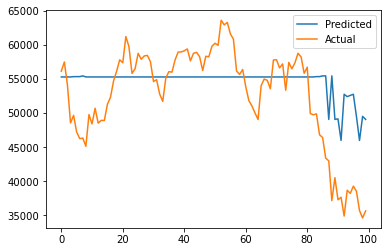

(0, 3, 0.5, 'mae')
rmse:  6311.446194102618
mape:  0.10436289733523717


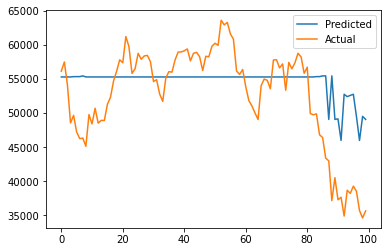

(0, 3, 1, 'rmse')
rmse:  6194.589918602348
mape:  0.10207290744192962


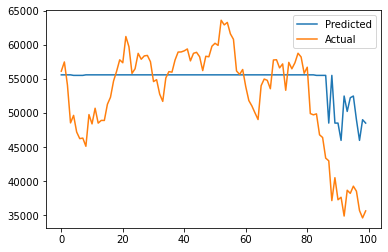

(0, 3, 1, 'mae')
rmse:  6194.589918602348
mape:  0.10207290744192962


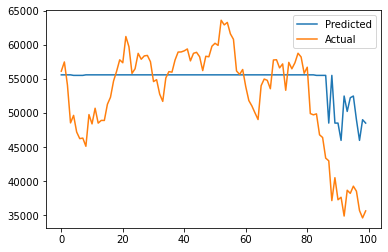

(0, 6, 0.5, 'rmse')
rmse:  6798.196795416868
mape:  0.11071272469309927


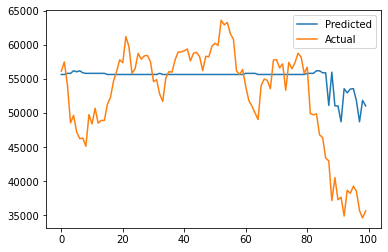

(0, 6, 0.5, 'mae')
rmse:  6798.196795416868
mape:  0.11071272469309927


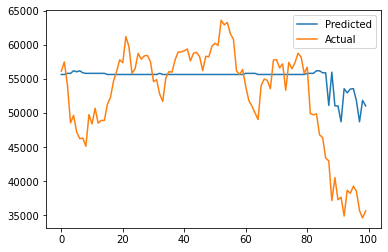

(0, 6, 1, 'rmse')
rmse:  7196.6165353686065
mape:  0.11519541519710957


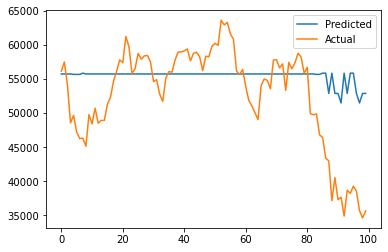

(0, 6, 1, 'mae')
rmse:  7196.6165353686065
mape:  0.11519541519710957


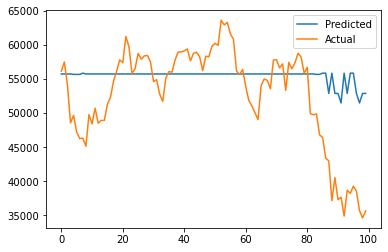

(0, 12, 0.5, 'rmse')
rmse:  6898.13851943881
mape:  0.11171269429592391


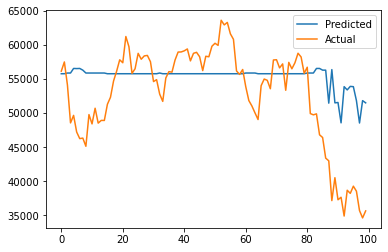

(0, 12, 0.5, 'mae')
rmse:  6898.13851943881
mape:  0.11171269429592391


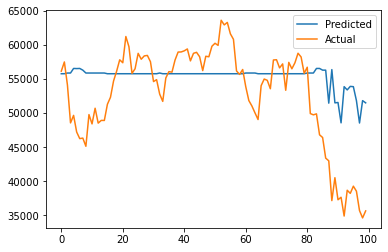

(0, 12, 1, 'rmse')
rmse:  7177.94667267679
mape:  0.1148896911306026


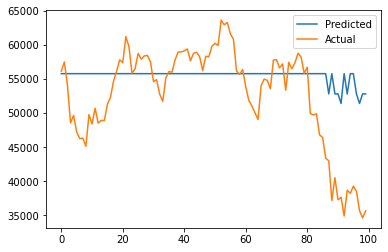

(0, 12, 1, 'mae')
rmse:  7177.94667267679
mape:  0.1148896911306026


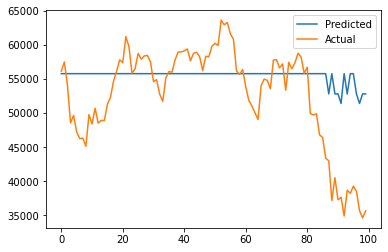

(1, 3, 0.5, 'rmse')
rmse:  6311.446194102618
mape:  0.10436289733523717


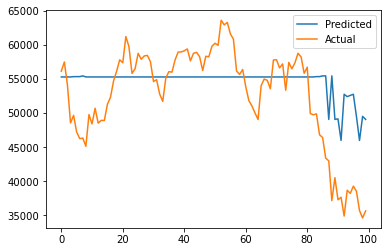

(1, 3, 0.5, 'mae')
rmse:  6311.446194102618
mape:  0.10436289733523717


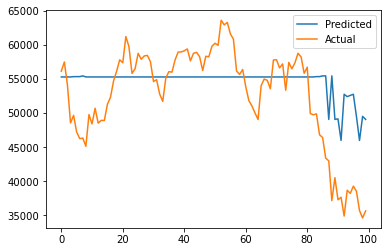

(1, 3, 1, 'rmse')
rmse:  6194.589918602348
mape:  0.10207290744192962


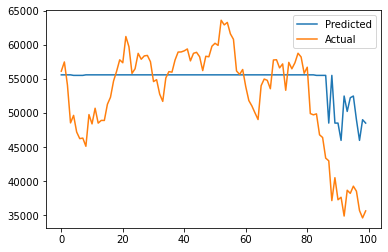

(1, 3, 1, 'mae')
rmse:  6194.589918602348
mape:  0.10207290744192962


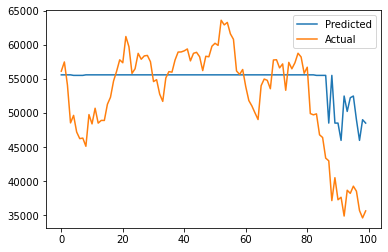

(1, 6, 0.5, 'rmse')
rmse:  6798.196795416868
mape:  0.11071272469309927


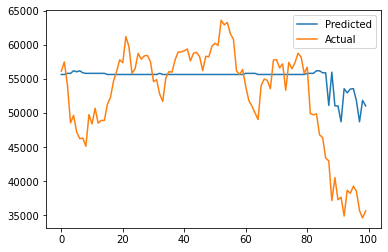

(1, 6, 0.5, 'mae')
rmse:  6798.196795416868
mape:  0.11071272469309927


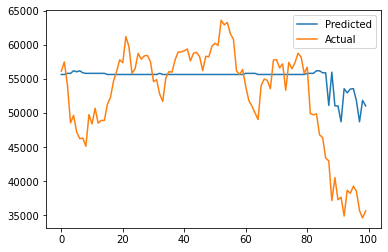

(1, 6, 1, 'rmse')
rmse:  7196.6165353686065
mape:  0.11519541519710957


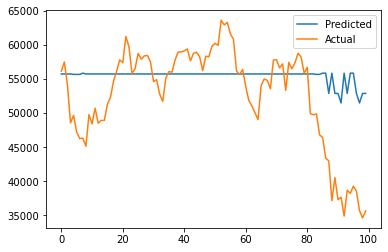

(1, 6, 1, 'mae')
rmse:  7196.6165353686065
mape:  0.11519541519710957


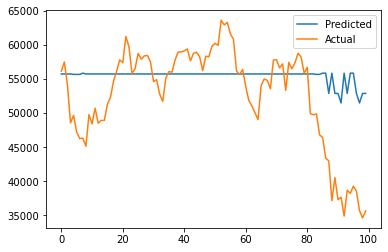

(1, 12, 0.5, 'rmse')
rmse:  6885.416136436597
mape:  0.11158552707778772


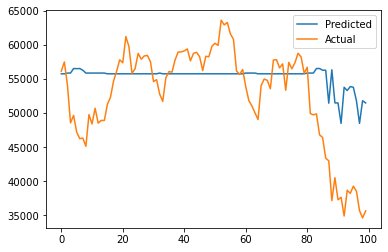

(1, 12, 0.5, 'mae')
rmse:  6885.416136436597
mape:  0.11158552707778772


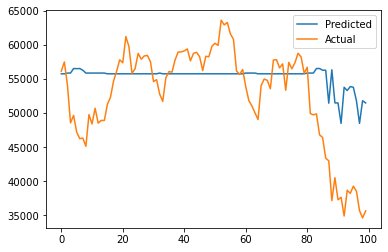

(1, 12, 1, 'rmse')
rmse:  7179.355694141004
mape:  0.11490991138987053


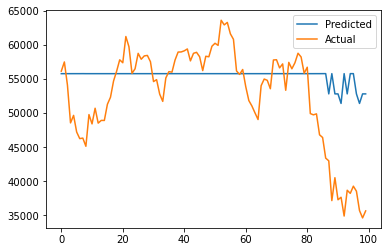

(1, 12, 1, 'mae')
rmse:  7179.355694141004
mape:  0.11490991138987053


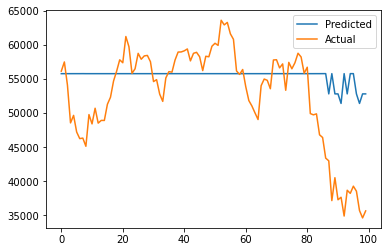

(5, 3, 0.5, 'rmse')
rmse:  6311.446194102618
mape:  0.10436289733523717


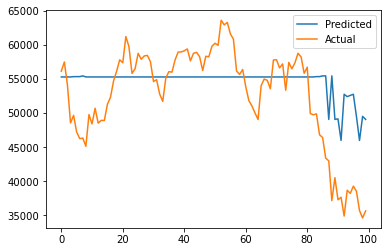

(5, 3, 0.5, 'mae')
rmse:  6311.446194102618
mape:  0.10436289733523717


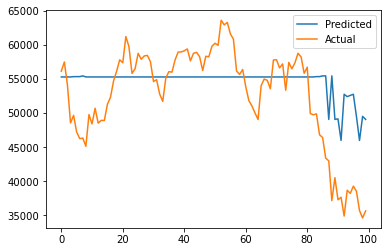

(5, 3, 1, 'rmse')
rmse:  6194.589918602348
mape:  0.10207290744192962


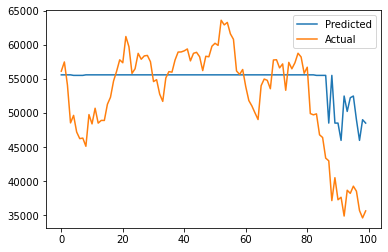

(5, 3, 1, 'mae')
rmse:  6194.589918602348
mape:  0.10207290744192962


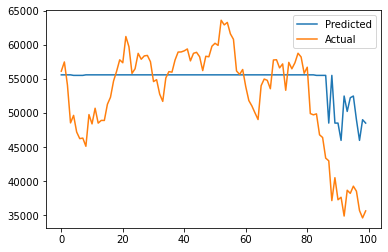

(5, 6, 0.5, 'rmse')
rmse:  6798.196795416868
mape:  0.11071272469309927


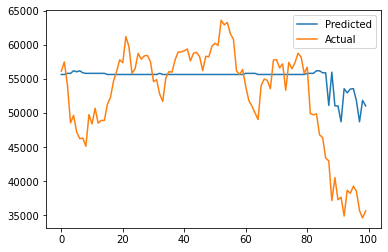

(5, 6, 0.5, 'mae')
rmse:  6798.196795416868
mape:  0.11071272469309927


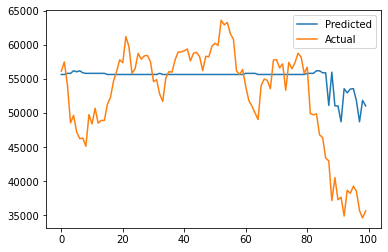

(5, 6, 1, 'rmse')
rmse:  7196.6165353686065
mape:  0.11519541519710957


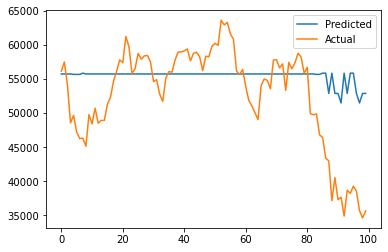

(5, 6, 1, 'mae')
rmse:  7196.6165353686065
mape:  0.11519541519710957


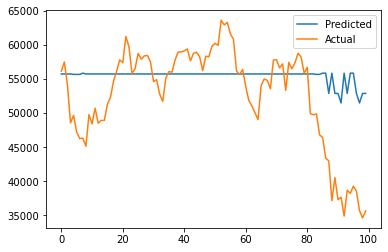

(5, 12, 0.5, 'rmse')
rmse:  6899.718097382037
mape:  0.1118091974573856


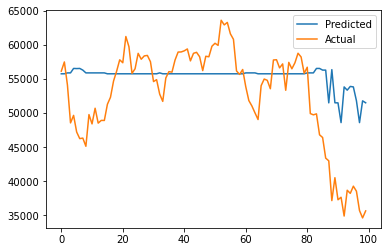

(5, 12, 0.5, 'mae')
rmse:  6899.718097382037
mape:  0.1118091974573856


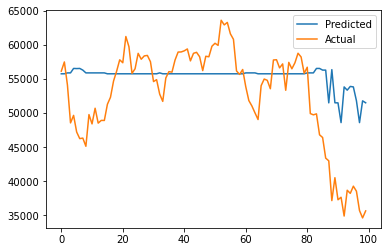

(5, 12, 1, 'rmse')
rmse:  7177.56670253896
mape:  0.11488712187445882


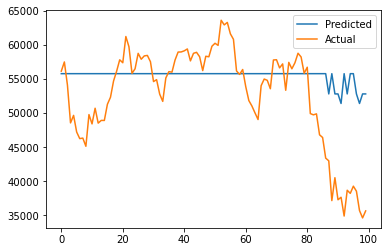

(5, 12, 1, 'mae')
rmse:  7177.56670253896
mape:  0.11488712187445882


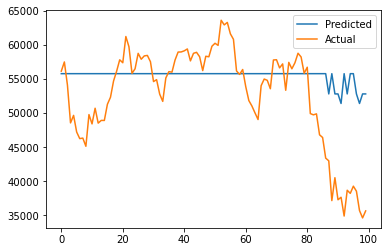

(20, 3, 0.5, 'rmse')
rmse:  6311.446194102618
mape:  0.10436289733523717


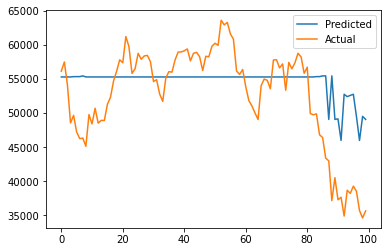

(20, 3, 0.5, 'mae')
rmse:  6311.446194102618
mape:  0.10436289733523717


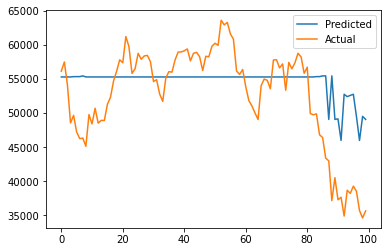

(20, 3, 1, 'rmse')
rmse:  6194.589918602348
mape:  0.10207290744192962


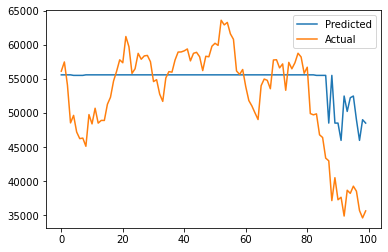

(20, 3, 1, 'mae')
rmse:  6194.589918602348
mape:  0.10207290744192962


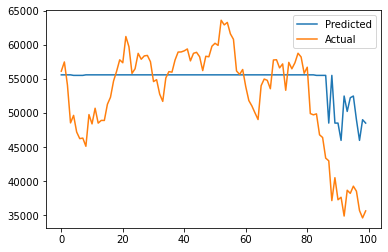

(20, 6, 0.5, 'rmse')
rmse:  6798.196795416868
mape:  0.11071272469309927


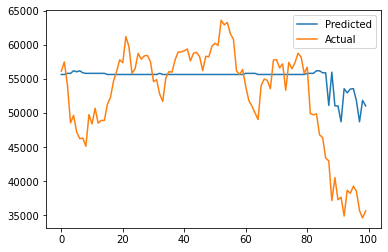

(20, 6, 0.5, 'mae')
rmse:  6798.196795416868
mape:  0.11071272469309927


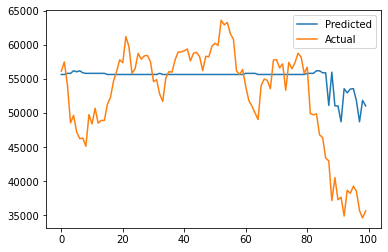

(20, 6, 1, 'rmse')
rmse:  7196.615076057601
mape:  0.11519540520000394


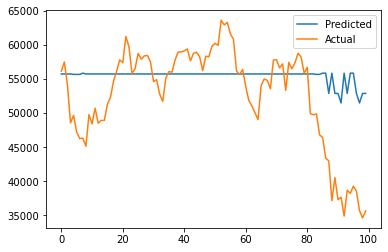

(20, 6, 1, 'mae')
rmse:  7196.615076057601
mape:  0.11519540520000394


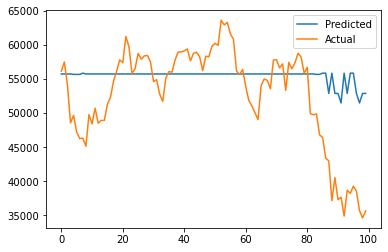

(20, 12, 0.5, 'rmse')
rmse:  6896.89509523973
mape:  0.11172682011051979


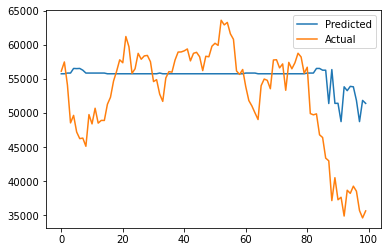

(20, 12, 0.5, 'mae')
rmse:  6896.89509523973
mape:  0.11172682011051979


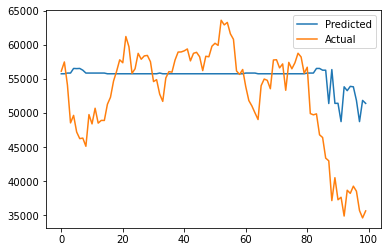

(20, 12, 1, 'rmse')
rmse:  7177.461751452208
mape:  0.11488641207995995


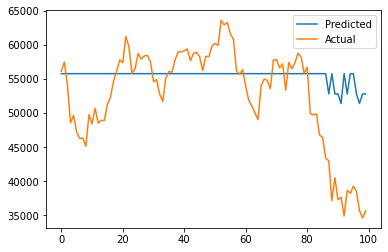

(20, 12, 1, 'mae')
rmse:  7177.461751452208
mape:  0.11488641207995995


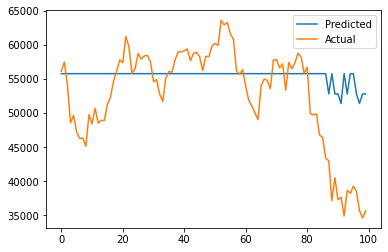

(100, 3, 0.5, 'rmse')
rmse:  6311.446194102618
mape:  0.10436289733523717


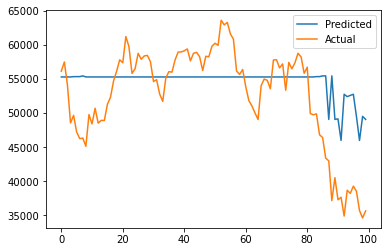

(100, 3, 0.5, 'mae')
rmse:  6311.446194102618
mape:  0.10436289733523717


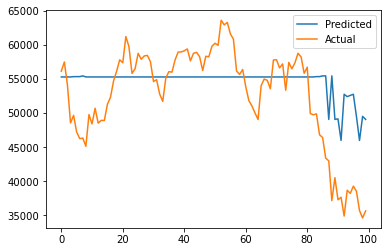

(100, 3, 1, 'rmse')
rmse:  6194.589918602348
mape:  0.10207290744192962


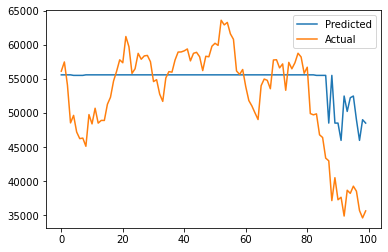

(100, 3, 1, 'mae')
rmse:  6194.589918602348
mape:  0.10207290744192962


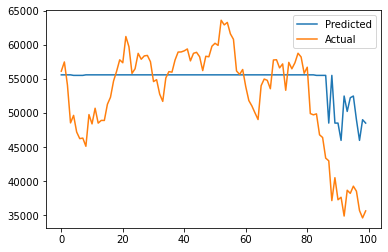

(100, 6, 0.5, 'rmse')
rmse:  6798.992189417068
mape:  0.11072622702340264


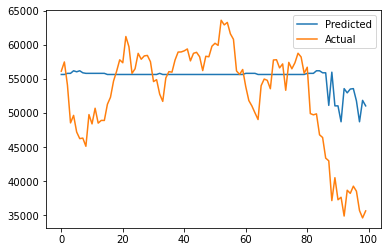

(100, 6, 0.5, 'mae')
rmse:  6798.992189417068
mape:  0.11072622702340264


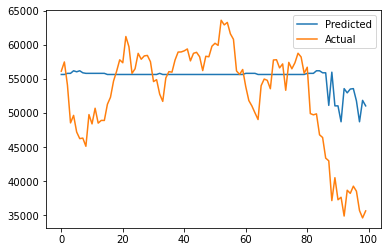

(100, 6, 1, 'rmse')
rmse:  7193.369757182885
mape:  0.11517315180062727


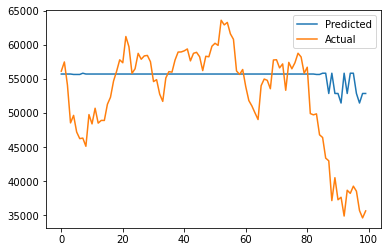

(100, 6, 1, 'mae')
rmse:  7193.369757182885
mape:  0.11517315180062727


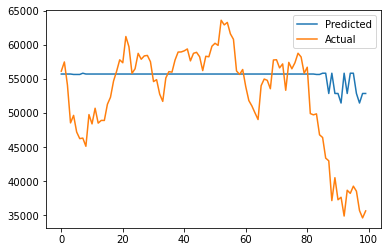

(100, 12, 0.5, 'rmse')
rmse:  6902.62584834762
mape:  0.11181922972885223


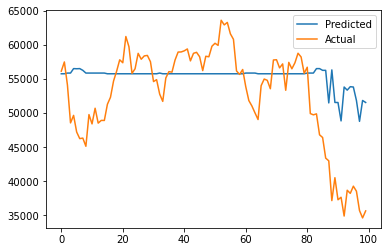

(100, 12, 0.5, 'mae')
rmse:  6902.62584834762
mape:  0.11181922972885223


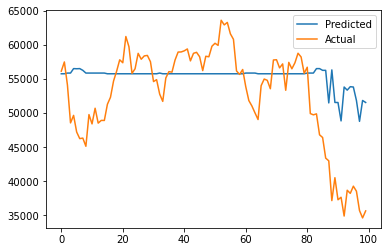

(100, 12, 1, 'rmse')
rmse:  7174.432800885422
mape:  0.114847001796906


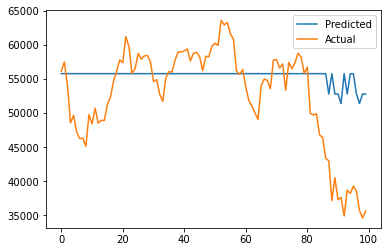

(100, 12, 1, 'mae')
rmse:  7174.432800885422
mape:  0.114847001796906


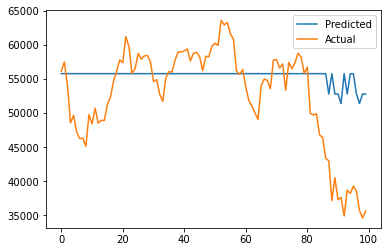

In [31]:
best_mape2 = ''
best_mape = 1
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc2, y_train_btc2)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc2)):
        test = fresh_test_btc2.iloc[i]
        actual = y_test_btc2.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

    print(x)
    mse = mean_squared_error(y_true, y_pred)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true, y_pred)
    
    if mape < best_mape:
        best_mape = mape
        best_mape2 = str(mape) + '_' + str(x)
    
    print('mape: ', mape)
    
    plt.plot(y_pred, label='Predicted')
    plt.plot(y_true, label='Actual')
    plt.legend()
    plt.show()

In [32]:
best_mape2 # return iteration of hyperparameters that produce the lowest mape on testing set of data

"0.10207290744192962_(0, 3, 1, 'rmse')"

## XGBoost regressor - multivariate, hand picked features

In [ ]:
selected_feat_btc2 = ['/v1/metrics/indicators/stock_to_flow_deflection']

In [454]:
final_reg_train2 = final_reg_train[selected_feat_btc2]
final_reg_train2['PriceUSD'] = final_reg_train['PriceUSD']
final_reg_y_train2 = final_reg_y_train.copy()

In [455]:
final_reg_test2 = final_reg_test[selected_feat_btc2]
final_reg_test2['PriceUSD'] = final_reg_test['PriceUSD']
final_reg_y2 = final_reg_y.copy()

In [ ]:
fresh_train_btc3 = fresh_train_btc[selected_feat_btc2]
fresh_train_btc3['PriceUSD'] = fresh_train_btc['PriceUSD']
y_train_btc3 = y_train_btc.copy()
fresh_test_btc3 = fresh_test_btc[selected_feat_btc2]
fresh_test_btc3['PriceUSD'] = fresh_test_btc['PriceUSD']
y_test_btc3 = y_test_btc.copy()

(0, 3, 0.5, 'rmse')
rmse:  8355.544479055041
mape:  0.12966947201522935


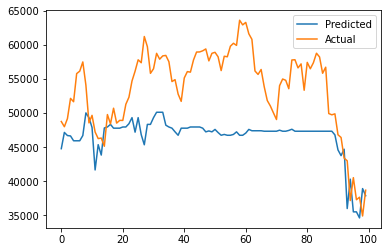

(0, 3, 0.5, 'mae')
rmse:  8355.544479055041
mape:  0.12966947201522935


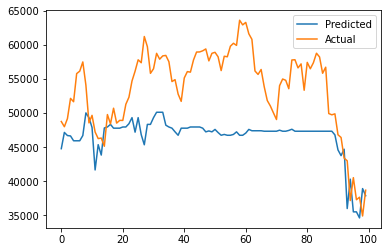

(0, 3, 1, 'rmse')
rmse:  6310.637134741865
mape:  0.09536081797563688


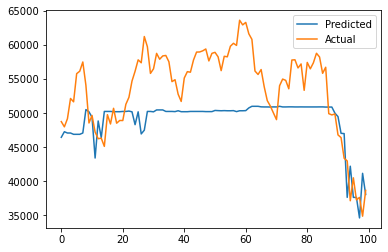

(0, 3, 1, 'mae')
rmse:  6310.637134741865
mape:  0.09536081797563688


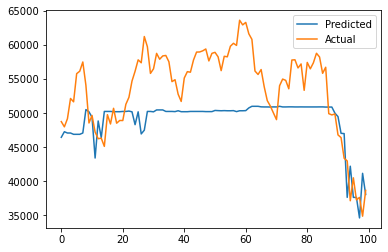

(0, 6, 0.5, 'rmse')
rmse:  8301.323471890817
mape:  0.12992446600974042


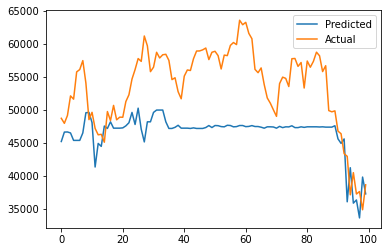

(0, 6, 0.5, 'mae')
rmse:  8301.323471890817
mape:  0.12992446600974042


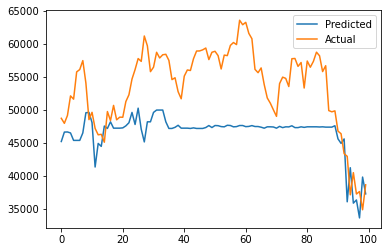

(0, 6, 1, 'rmse')
rmse:  9066.32858259825
mape:  0.14284577953239694


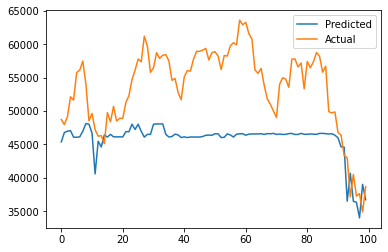

(0, 6, 1, 'mae')
rmse:  9066.32858259825
mape:  0.14284577953239694


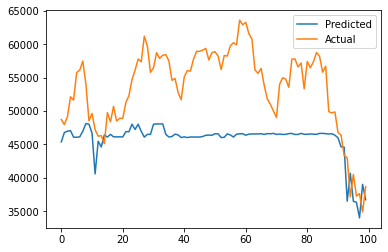

(0, 12, 0.5, 'rmse')
rmse:  8724.180967523838
mape:  0.13597502315476442


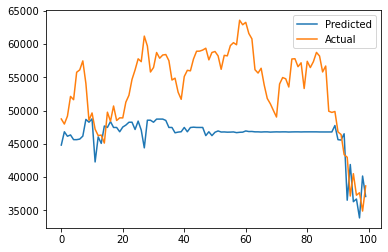

(0, 12, 0.5, 'mae')
rmse:  8724.180967523838
mape:  0.13597502315476442


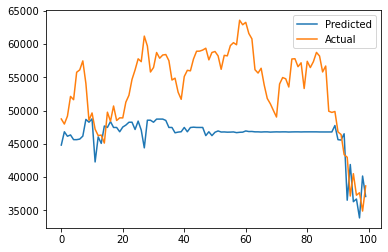

(0, 12, 1, 'rmse')
rmse:  8536.265392888465
mape:  0.13381042620343955


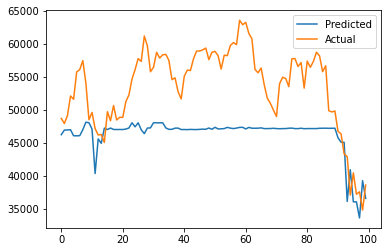

(0, 12, 1, 'mae')
rmse:  8536.265392888465
mape:  0.13381042620343955


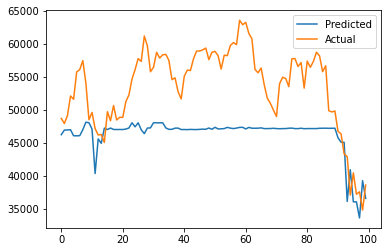

(1, 3, 0.5, 'rmse')
rmse:  8355.544479055041
mape:  0.12966947201522935


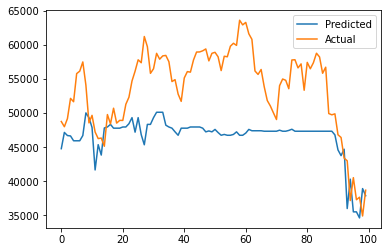

(1, 3, 0.5, 'mae')
rmse:  8355.544479055041
mape:  0.12966947201522935


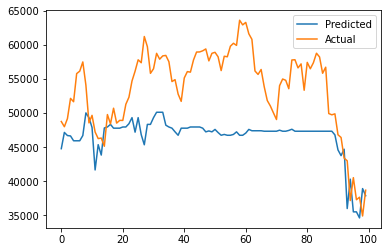

(1, 3, 1, 'rmse')
rmse:  6310.637134741865
mape:  0.09536081797563688


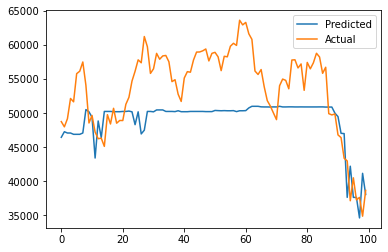

(1, 3, 1, 'mae')
rmse:  6310.637134741865
mape:  0.09536081797563688


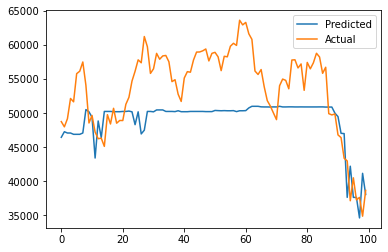

(1, 6, 0.5, 'rmse')
rmse:  8301.323471890817
mape:  0.12992446600974042


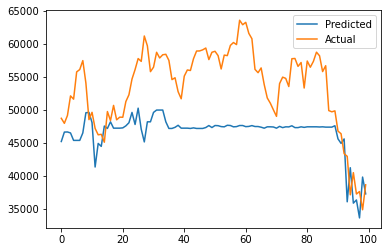

(1, 6, 0.5, 'mae')
rmse:  8301.323471890817
mape:  0.12992446600974042


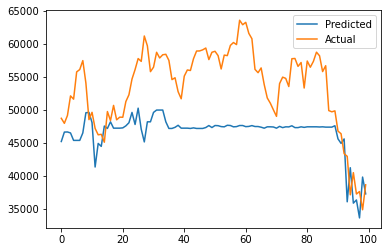

(1, 6, 1, 'rmse')
rmse:  9066.32858259825
mape:  0.14284577953239694


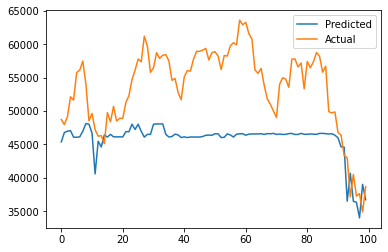

(1, 6, 1, 'mae')
rmse:  9066.32858259825
mape:  0.14284577953239694


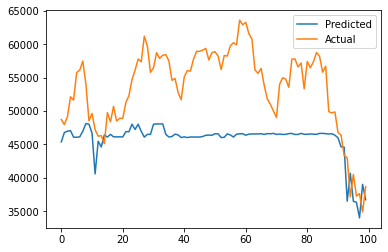

(1, 12, 0.5, 'rmse')
rmse:  8788.624223931549
mape:  0.13717914646732154


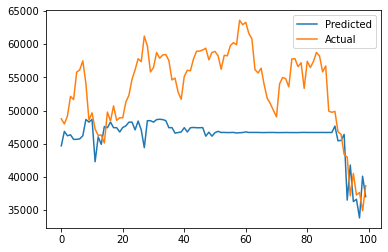

(1, 12, 0.5, 'mae')
rmse:  8788.624223931549
mape:  0.13717914646732154


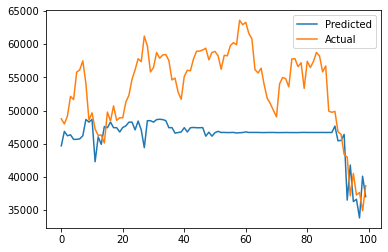

(1, 12, 1, 'rmse')
rmse:  8532.703389396465
mape:  0.13368678129626294


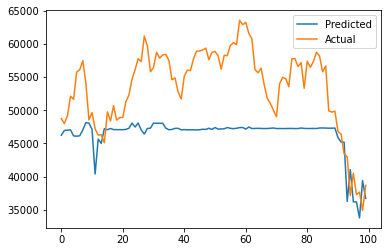

(1, 12, 1, 'mae')
rmse:  8532.703389396465
mape:  0.13368678129626294


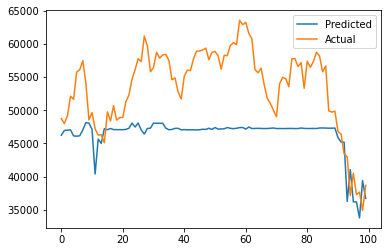

(5, 3, 0.5, 'rmse')
rmse:  8355.544479055041
mape:  0.12966947201522935


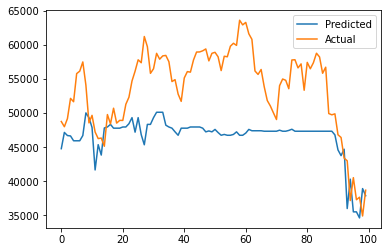

(5, 3, 0.5, 'mae')
rmse:  8355.544479055041
mape:  0.12966947201522935


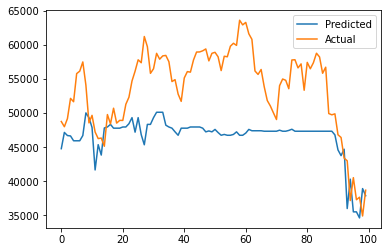

(5, 3, 1, 'rmse')
rmse:  6310.637134741865
mape:  0.09536081797563688


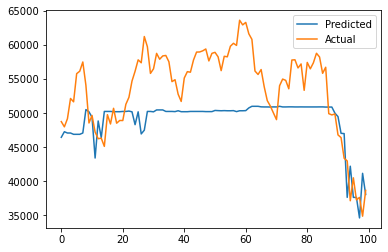

(5, 3, 1, 'mae')
rmse:  6310.637134741865
mape:  0.09536081797563688


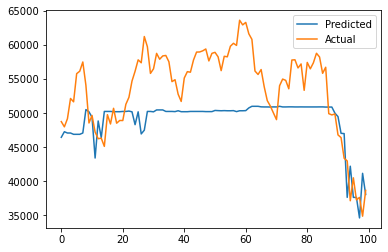

(5, 6, 0.5, 'rmse')
rmse:  8301.323471890817
mape:  0.12992446600974042


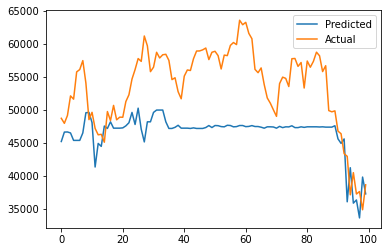

(5, 6, 0.5, 'mae')
rmse:  8301.323471890817
mape:  0.12992446600974042


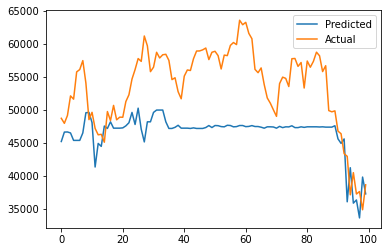

(5, 6, 1, 'rmse')
rmse:  9083.981142125043
mape:  0.14321528148971316


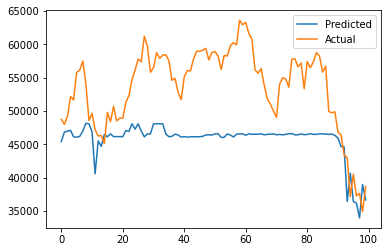

(5, 6, 1, 'mae')
rmse:  9083.981142125043
mape:  0.14321528148971316


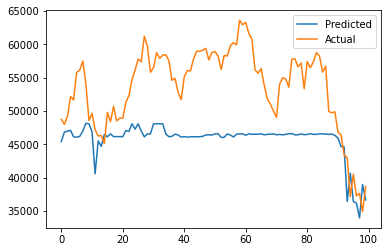

(5, 12, 0.5, 'rmse')
rmse:  8660.741215619122
mape:  0.13481346379754489


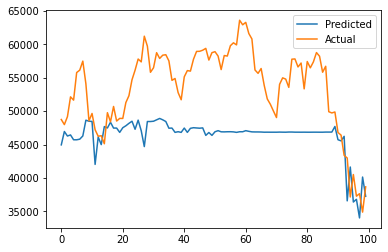

(5, 12, 0.5, 'mae')
rmse:  8660.741215619122
mape:  0.13481346379754489


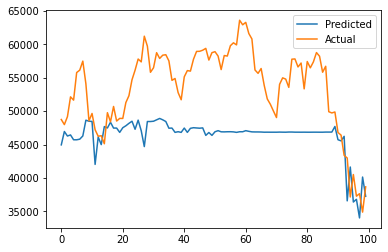

(5, 12, 1, 'rmse')
rmse:  8523.18110468288
mape:  0.13355422032928266


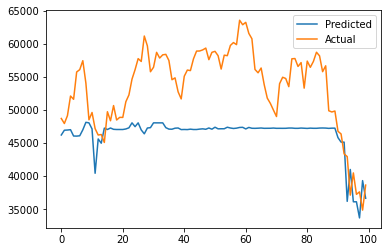

(5, 12, 1, 'mae')
rmse:  8523.18110468288
mape:  0.13355422032928266


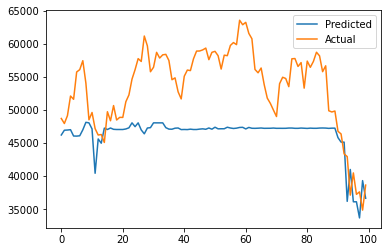

(20, 3, 0.5, 'rmse')
rmse:  8355.544479055041
mape:  0.12966947201522935


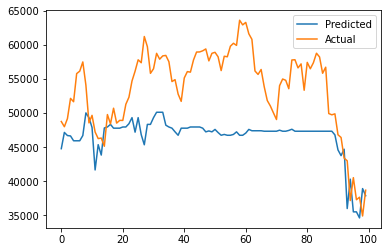

(20, 3, 0.5, 'mae')
rmse:  8355.544479055041
mape:  0.12966947201522935


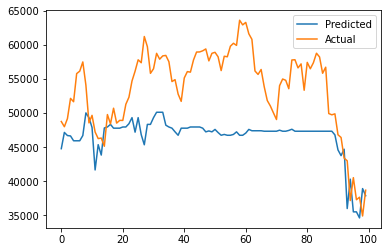

(20, 3, 1, 'rmse')
rmse:  6310.637134741865
mape:  0.09536081797563688


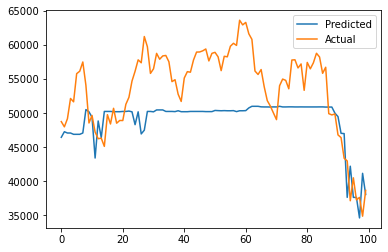

(20, 3, 1, 'mae')
rmse:  6310.637134741865
mape:  0.09536081797563688


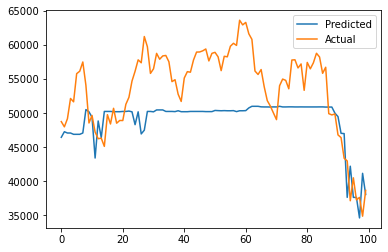

(20, 6, 0.5, 'rmse')
rmse:  8301.323471890817
mape:  0.12992446600974042


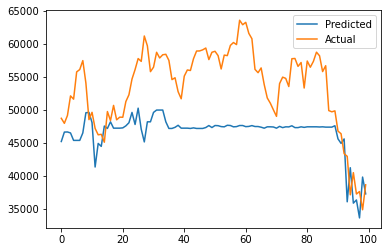

(20, 6, 0.5, 'mae')
rmse:  8301.323471890817
mape:  0.12992446600974042


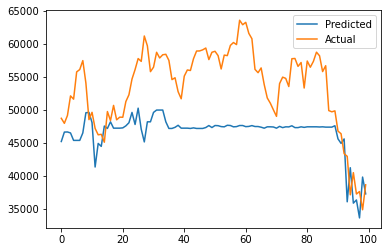

(20, 6, 1, 'rmse')
rmse:  9083.983354977538
mape:  0.14321534791041718


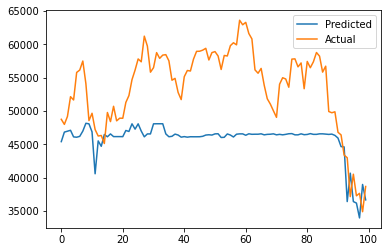

(20, 6, 1, 'mae')
rmse:  9083.983354977538
mape:  0.14321534791041718


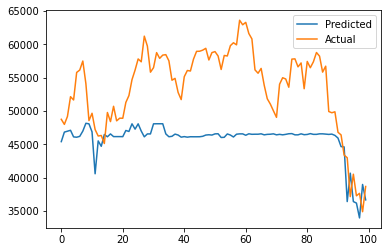

(20, 12, 0.5, 'rmse')
rmse:  8827.376705682274
mape:  0.13777810212128905


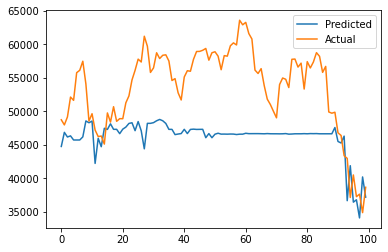

(20, 12, 0.5, 'mae')
rmse:  8827.376705682274
mape:  0.13777810212128905


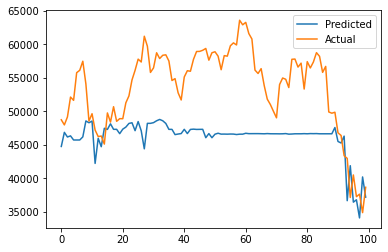

(20, 12, 1, 'rmse')
rmse:  8526.867011007973
mape:  0.13356816192859736


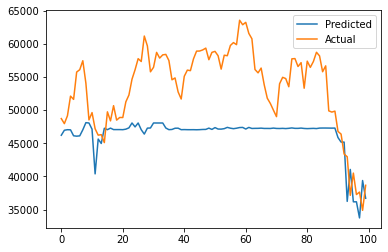

(20, 12, 1, 'mae')
rmse:  8526.867011007973
mape:  0.13356816192859736


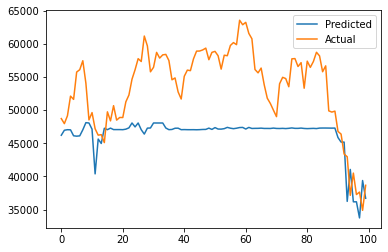

(100, 3, 0.5, 'rmse')
rmse:  8355.544479055041
mape:  0.12966947201522935


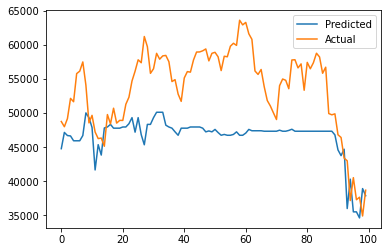

(100, 3, 0.5, 'mae')
rmse:  8355.544479055041
mape:  0.12966947201522935


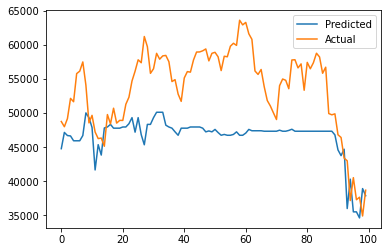

(100, 3, 1, 'rmse')
rmse:  6310.637134741865
mape:  0.09536081797563688


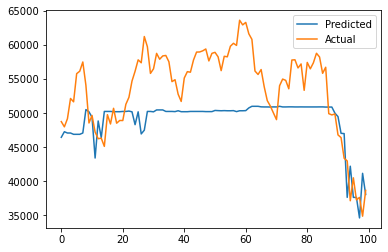

(100, 3, 1, 'mae')
rmse:  6310.637134741865
mape:  0.09536081797563688


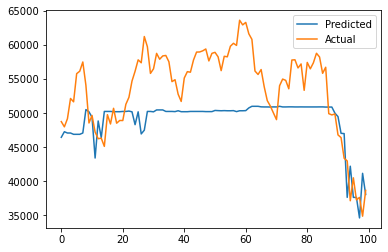

(100, 6, 0.5, 'rmse')
rmse:  8214.340106054986
mape:  0.12845172889188447


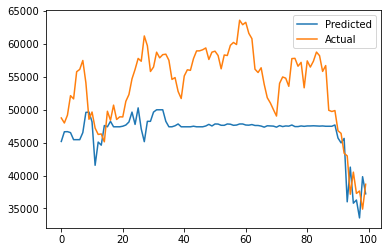

(100, 6, 0.5, 'mae')
rmse:  8214.340106054986
mape:  0.12845172889188447


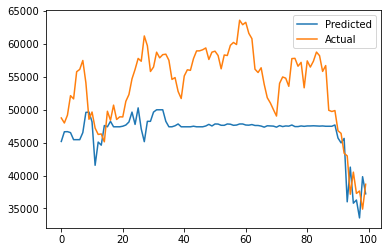

(100, 6, 1, 'rmse')
rmse:  9055.426268498573
mape:  0.14263900375350588


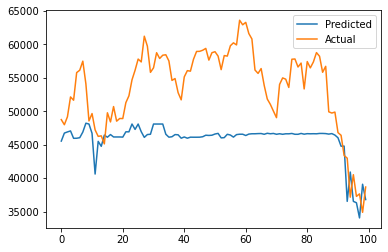

(100, 6, 1, 'mae')
rmse:  9055.426268498573
mape:  0.14263900375350588


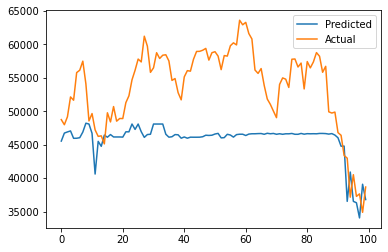

(100, 12, 0.5, 'rmse')
rmse:  8715.048231012799
mape:  0.13560743256301738


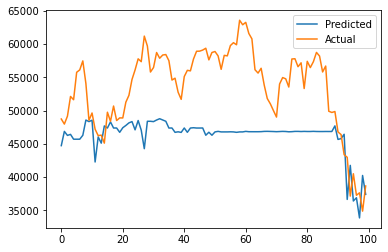

(100, 12, 0.5, 'mae')
rmse:  8715.048231012799
mape:  0.13560743256301738


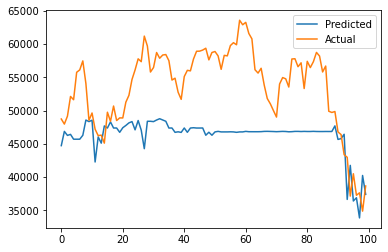

(100, 12, 1, 'rmse')
rmse:  8526.259664119394
mape:  0.13355785683648944


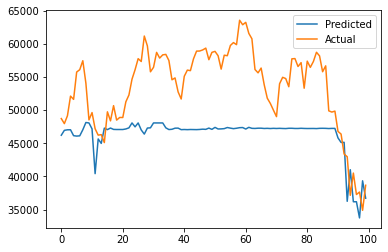

(100, 12, 1, 'mae')
rmse:  8526.259664119394
mape:  0.13355785683648944


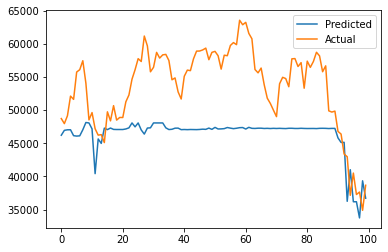

In [210]:
best_mape2 = ''
best_mape = 1
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc3, y_train_btc3)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc3)):
        test = fresh_test_btc3.iloc[i]
        actual = y_test_btc3.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

    print(x)
    mse = mean_squared_error(y_true, y_pred)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true, y_pred)
    
    if mape < best_mape:
        best_mape = mape
        best_mape2 = str(mape) + '_' + str(x)
    
    print('mape: ', mape)
    
    plt.plot(y_pred, label='Predicted')
    plt.plot(y_true, label='Actual')
    plt.legend()
    plt.show()

In [212]:
best_mape2

"0.09536081797563688_(0, 3, 1, 'rmse')"

## XGBclassifier - multivariate, hand picked features

In [459]:
btc_classifier_xgb = all_btc_data.iloc[1:]

In [460]:
list1 = []
for i in range(len(btc_classifier_xgb)):
    if btc_classifier_xgb['new_close'].iloc[i] > btc_classifier_xgb['PriceUSD'].iloc[i]:
        list1.append(1)
    else:
        list1.append(0)   # create binary price up/down target column for classification

In [461]:
btc_classifier_xgb['new_close2'] = list1

In [462]:
y_btc_xgb = btc_classifier_xgb[['new_close2']]

In [463]:
btc_classifier_xgb.drop(['new_close', 'new_close2'], axis=1, inplace=True)

In [464]:
fresh_train_classifier = btc_classifier_xgb[0:-200]
y_train_classifier = y_btc_xgb[0:-200]
fresh_test_classifier = btc_classifier_xgb[-200:-100]
y_test_classifier = y_btc_xgb[-200:-100]

In [465]:
final_x_train_classifier = btc_classifier_xgb[0:-100]  # training data for final ensemble
final_y_train_classifier = y_btc_xgb[0:-100]

In [466]:
final_x_test_classifier = btc_classifier_xgb.tail(100)   # testing data for final ensemble
final_y_test_classifier = y_btc_xgb.tail(100)

In [467]:
final_x_train_classifier2 = final_x_train_classifier[selected_feat_btc2]
final_x_train_classifier2['PriceUSD'] = final_x_train_classifier['PriceUSD']
y_train_classifier2 = y_train_classifier.copy()

In [468]:
final_x_test_classifier2 = final_x_test_classifier[selected_feat_btc2]
final_x_test_classifier2['PriceUSD'] = final_x_test_classifier['PriceUSD']
y_test_classifier2 = y_test_classifier.copy()

In [469]:
fresh_train_classifier2 = fresh_train_classifier[selected_feat_btc2]
fresh_train_classifier2['PriceUSD'] = fresh_train_classifier['PriceUSD']
y_train_classifier2 = y_train_classifier.copy()
fresh_test_classifier2 = fresh_test_classifier[selected_feat_btc2]
fresh_test_classifier2['PriceUSD'] = fresh_test_classifier['PriceUSD']
y_test_classifier2 = y_test_classifier.copy()

In [470]:
best_auc2 = ''
best_auc = 0
for x in cluster_combo_list:
    model = XGBClassifier(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_classifier2, y_train_classifier2)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_classifier2)):
        test = fresh_test_classifier2.iloc[i]
        actual = y_test_classifier2.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

   

    print(x)
    fpr, tpr, thresholds = metrics.roc_curve(np.array(y_true), np.array(y_pred), pos_label=1)
    print(metrics.auc(fpr, tpr))
    
    auc = metrics.auc(fpr, tpr)
    
    if auc > best_auc:
        best_auc = auc
        best_auc2 = str(auc) + '_' + str(x)

    print('confusion_matrix: \n', confusion_matrix(y_true, y_pred), '\n') 
    

(0, 3, 0.5, 'rmse')
0.5830332132853141
confusion_matrix: 
 [[36 13]
 [29 22]] 

(0, 3, 0.5, 'mae')
0.5830332132853141
confusion_matrix: 
 [[36 13]
 [29 22]] 

(0, 3, 1, 'rmse')
0.44057623049219685
confusion_matrix: 
 [[23 26]
 [30 21]] 

(0, 3, 1, 'mae')
0.44057623049219685
confusion_matrix: 
 [[23 26]
 [30 21]] 

(0, 6, 0.5, 'rmse')
0.5644257703081232
confusion_matrix: 
 [[14 35]
 [ 8 43]] 

(0, 6, 0.5, 'mae')
0.5644257703081232
confusion_matrix: 
 [[14 35]
 [ 8 43]] 

(0, 6, 1, 'rmse')
0.4659863945578231
confusion_matrix: 
 [[13 36]
 [17 34]] 

(0, 6, 1, 'mae')
0.4659863945578231
confusion_matrix: 
 [[13 36]
 [17 34]] 

(0, 12, 0.5, 'rmse')
0.5228091236494598
confusion_matrix: 
 [[ 8 41]
 [ 6 45]] 

(0, 12, 0.5, 'mae')
0.5228091236494598
confusion_matrix: 
 [[ 8 41]
 [ 6 45]] 

(0, 12, 1, 'rmse')
0.5330132052821128
confusion_matrix: 
 [[ 9 40]
 [ 6 45]] 

(0, 12, 1, 'mae')
0.5330132052821128
confusion_matrix: 
 [[ 9 40]
 [ 6 45]] 

(1, 3, 0.5, 'rmse')
0.522609043617447
confusion_matr

### Differencing data

In [63]:
difference_test = all_btc_data.iloc[1:].copy()

In [64]:
for i in difference_test.columns:
    difference_test[i + '_diff'] = difference_test[i] - difference_test[i].shift(1)
    difference_test.drop(i,axis=1,inplace=True)

In [65]:
difference_test.dropna(inplace=True)

In [66]:
y_diff = difference_test[['new_close_diff']]

In [67]:
difference_test.drop('new_close_diff',axis=1,inplace=True)

In [68]:
difference_test = difference_test.select_dtypes(exclude=['object'])

In [69]:
difference_test.head()

,/v1/metrics/addresses/count_diff,/v1/metrics/addresses/sending_count_diff,/v1/metrics/addresses/receiving_count_diff,/v1/metrics/addresses/active_count_diff,/v1/metrics/addresses/new_non_zero_count_diff,/v1/metrics/addresses/min_point_zero_1_count_diff,/v1/metrics/addresses/min_point_1_count_diff,/v1/metrics/addresses/min_1_count_diff,/v1/metrics/addresses/min_10_count_diff,/v1/metrics/addresses/min_100_count_diff,...,/v1/metrics/supply/active_24h_diff,/v1/metrics/supply/active_1d_1w_diff,/v1/metrics/supply/active_1w_1m_diff,/v1/metrics/supply/active_1m_3m_diff,/v1/metrics/supply/active_3m_6m_diff,/v1/metrics/supply/active_6m_12m_diff,/v1/metrics/supply/active_1y_2y_diff,/v1/metrics/supply/active_2y_3y_diff,/v1/metrics/supply/active_3y_5y_diff,PriceUSD_diff
date,,,,,,,,,,,,,,,,,,,,,
2012-12-16,19794.0,1538.0,905.0,1142.0,503.0,607.0,394.0,30.0,-6.0,36.0,...,-35379.002861,23656.390926,-27041.085056,18961.941212,16803.269733,3715.297033,722.937002,-2264.748989,3600.0,-0.115010
2012-12-17,23932.0,3821.0,4645.0,5259.0,4138.0,507.0,497.0,395.0,141.0,59.0,...,69699.822123,-89039.077756,17483.534818,-26864.815847,26863.548749,3096.354859,-5757.190002,3867.822555,4000.0,-0.162179
2012-12-18,29116.0,4314.0,5894.0,7075.0,5184.0,834.0,204.0,-44.0,-146.0,1.0,...,48758.620474,-11328.096456,-34723.154789,-7605.086052,3835.019015,-4547.361725,-24378.710467,30113.770000,3000.0,0.017016
2012-12-19,24501.0,-3360.0,-5196.0,-4361.0,-4615.0,280.0,-98.0,-169.0,-205.0,-17.0,...,-28725.004413,20475.944113,10032.567440,4767.115696,-5252.839530,-27488.947239,28457.523933,-1766.360000,3050.0,0.279947
2012-12-20,21263.0,-2670.0,-4108.0,-4224.0,-3238.0,827.0,35.0,285.0,120.0,16.0,...,-37427.027402,-63994.089000,93465.477705,9209.723963,7015.952663,-8085.100243,1882.911314,-2717.850000,3300.0,0.024922


In [72]:
target_variable = difference_test[['PriceUSD_diff']]

In [73]:
target_variable.dropna(inplace=True)

In [74]:
ad_fuller_result = adfuller(target_variable, autolag='AIC')

<AxesSubplot:xlabel='date'>

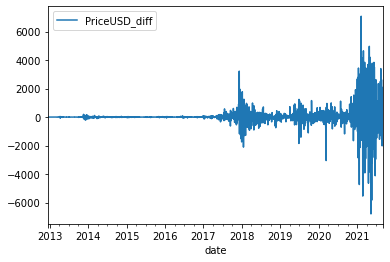

In [75]:
difference_test[['PriceUSD_diff']].plot()

In [76]:
print(f'ADF Statistic: {ad_fuller_result[0]}') # p-value is greater then 1, so we cannot reject the null hypothesis that the data is non-stationary

print(f'p-value: {ad_fuller_result[1]}')

for key, value in ad_fuller_result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -8.908479383805133
p-value: 1.1209441170812718e-14
Critial Values:
   1%, -3.4324256840496985
Critial Values:
   5%, -2.8624571096973295
Critial Values:
   10%, -2.5672581988257397


In [89]:
difference_train_btc = difference_test[0:-200]
y_diff_train_btc = y_diff[0:-200]
difference_test_btc = difference_test[-200:-100]
y_diff_test_btc = y_diff[-200:-100]

In [93]:
fresh_train_btc5 = difference_train_btc[['/v1/metrics/indicators/stock_to_flow_deflection_diff']]
fresh_train_btc5['PriceUSD_diff'] = difference_train_btc['PriceUSD_diff']
y_train_btc5 = y_diff_train_btc.copy()
fresh_test_btc5 = difference_test_btc[['/v1/metrics/indicators/stock_to_flow_deflection_diff']]
fresh_test_btc5['PriceUSD_diff'] = difference_test_btc['PriceUSD_diff']
y_test_btc5 = y_diff_test_btc.copy()

(0, 3, 0.5, 'rmse')
rmse:  2586.7675041017446
mape:  2.930816327459376


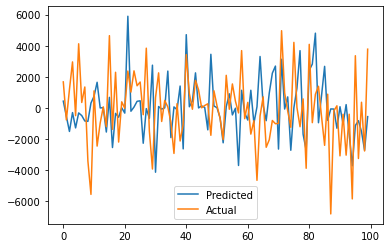

(0, 3, 0.5, 'mae')
rmse:  2586.7675041017446
mape:  2.930816327459376


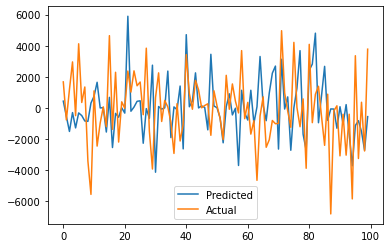

(0, 3, 1, 'rmse')
rmse:  2619.7186497352927
mape:  4.7142929991917395


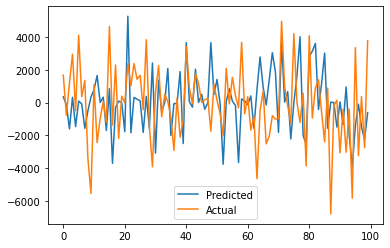

(0, 3, 1, 'mae')
rmse:  2619.7186497352927
mape:  4.7142929991917395


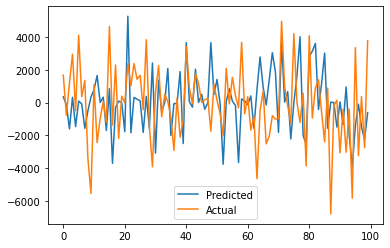

(0, 6, 0.5, 'rmse')
rmse:  2601.6450530129287
mape:  4.098005375588677


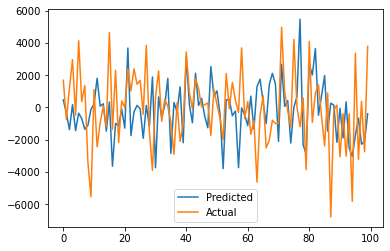

(0, 6, 0.5, 'mae')
rmse:  2601.6450530129287
mape:  4.098005375588677


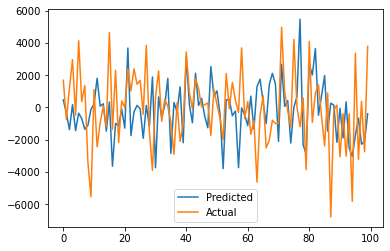

(0, 6, 1, 'rmse')
rmse:  2651.1866559233304
mape:  7.384707291128658


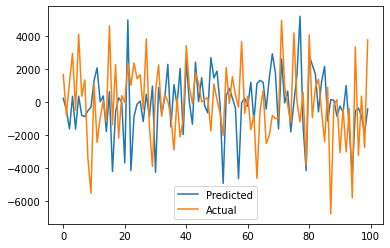

(0, 6, 1, 'mae')
rmse:  2651.1866559233304
mape:  7.384707291128658


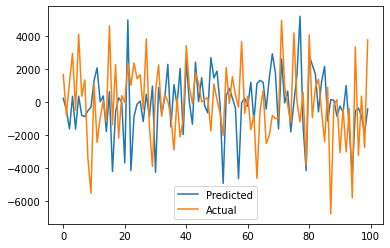

(0, 12, 0.5, 'rmse')
rmse:  2901.524665703374
mape:  3.590618470673093


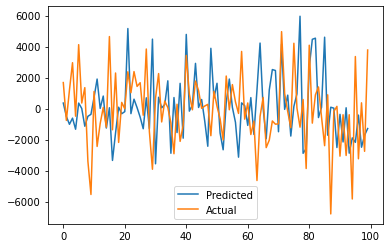

(0, 12, 0.5, 'mae')
rmse:  2901.524665703374
mape:  3.590618470673093


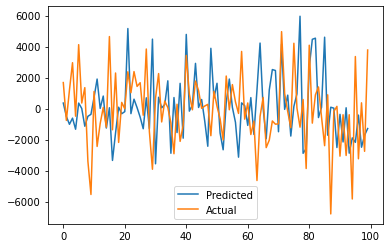

(0, 12, 1, 'rmse')
rmse:  2745.274906614542
mape:  7.301325974261427


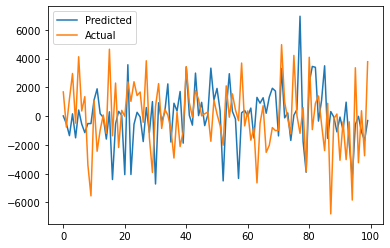

(0, 12, 1, 'mae')
rmse:  2745.274906614542
mape:  7.301325974261427


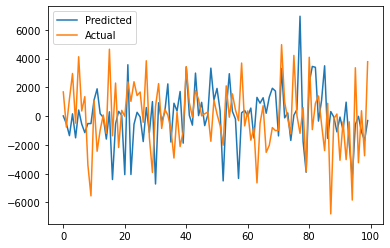

(1, 3, 0.5, 'rmse')
rmse:  2586.7675041017446
mape:  2.930816327459376


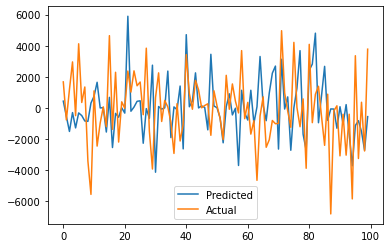

(1, 3, 0.5, 'mae')
rmse:  2586.7675041017446
mape:  2.930816327459376


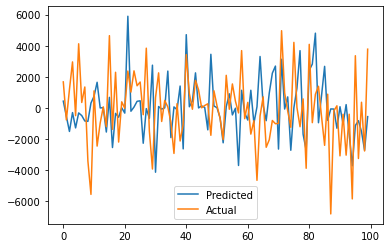

(1, 3, 1, 'rmse')
rmse:  2619.7186497352927
mape:  4.7142929991917395


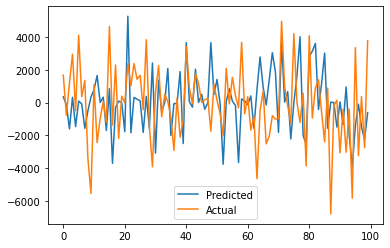

(1, 3, 1, 'mae')
rmse:  2619.7186497352927
mape:  4.7142929991917395


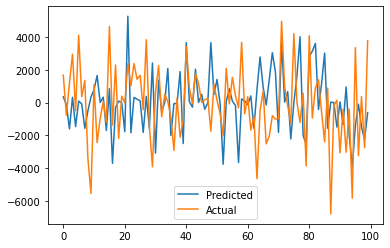

(1, 6, 0.5, 'rmse')
rmse:  2601.6450530129287
mape:  4.098005375588677


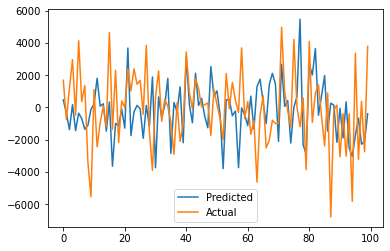

(1, 6, 0.5, 'mae')
rmse:  2601.6450530129287
mape:  4.098005375588677


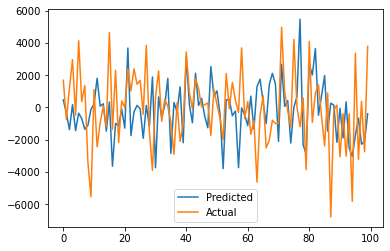

(1, 6, 1, 'rmse')
rmse:  2651.186729496188
mape:  7.384707338863863


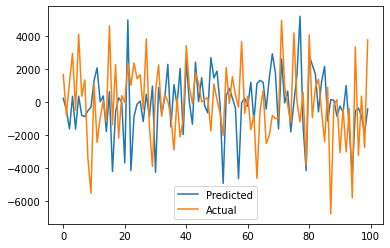

(1, 6, 1, 'mae')
rmse:  2651.186729496188
mape:  7.384707338863863


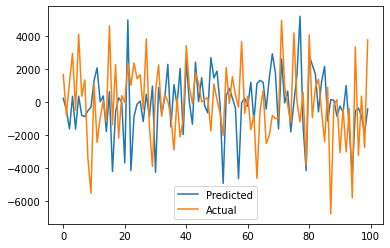

(1, 12, 0.5, 'rmse')
rmse:  2903.1715784062335
mape:  3.4753876006101962


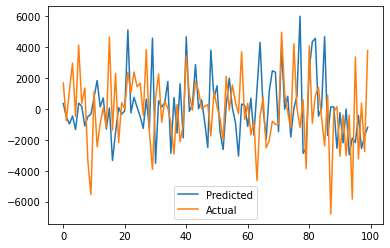

(1, 12, 0.5, 'mae')
rmse:  2903.1715784062335
mape:  3.4753876006101962


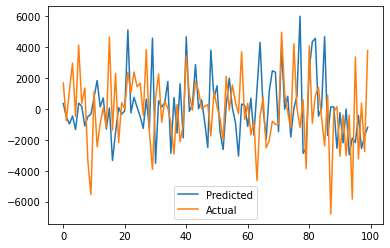

(1, 12, 1, 'rmse')
rmse:  2746.288902598572
mape:  7.2911215757842


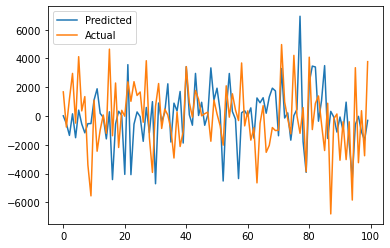

(1, 12, 1, 'mae')
rmse:  2746.288902598572
mape:  7.2911215757842


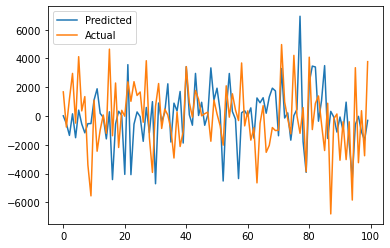

(5, 3, 0.5, 'rmse')
rmse:  2586.7675041017446
mape:  2.930816327459376


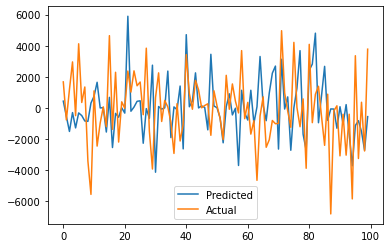

(5, 3, 0.5, 'mae')
rmse:  2586.7675041017446
mape:  2.930816327459376


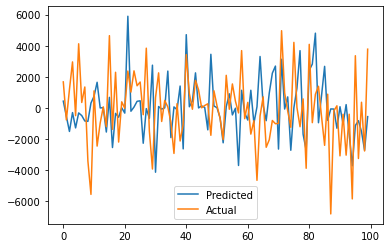

(5, 3, 1, 'rmse')
rmse:  2619.7186497352927
mape:  4.7142929991917395


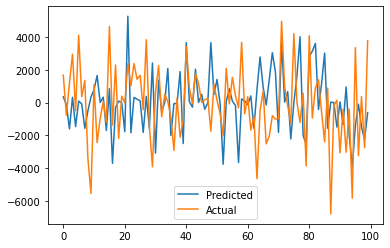

(5, 3, 1, 'mae')
rmse:  2619.7186497352927
mape:  4.7142929991917395


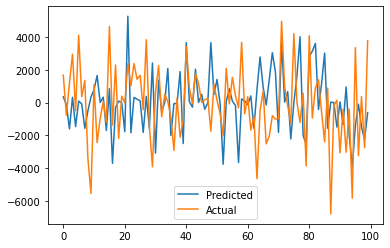

(5, 6, 0.5, 'rmse')
rmse:  2601.6465135461513
mape:  4.098004983155412


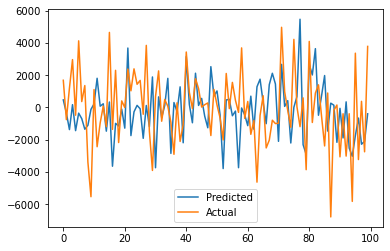

(5, 6, 0.5, 'mae')
rmse:  2601.6465135461513
mape:  4.098004983155412


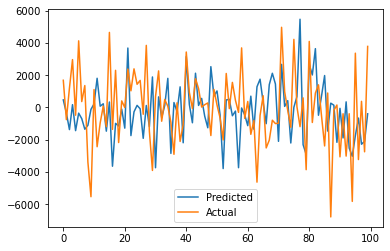

(5, 6, 1, 'rmse')
rmse:  2645.831544488701
mape:  7.341266586972824


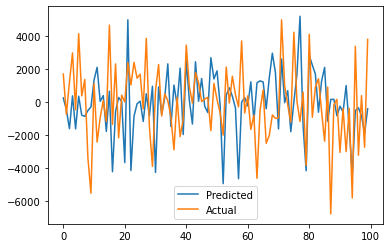

(5, 6, 1, 'mae')
rmse:  2645.831544488701
mape:  7.341266586972824


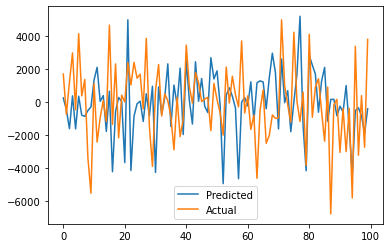

(5, 12, 0.5, 'rmse')
rmse:  2899.3436354329738
mape:  3.3892903244560855


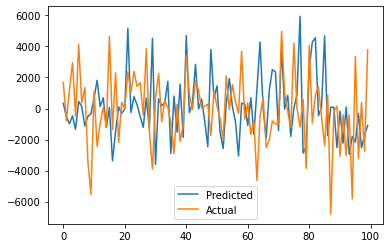

(5, 12, 0.5, 'mae')
rmse:  2899.3436354329738
mape:  3.3892903244560855


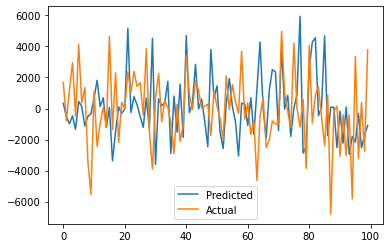

(5, 12, 1, 'rmse')
rmse:  2727.3096055946694
mape:  7.36467584893338


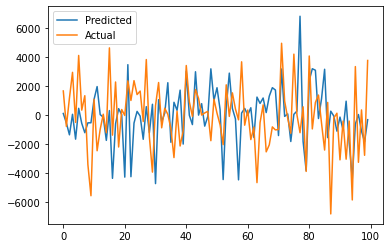

(5, 12, 1, 'mae')
rmse:  2727.3096055946694
mape:  7.36467584893338


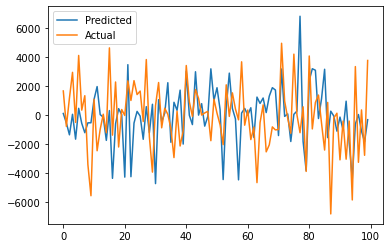

(20, 3, 0.5, 'rmse')
rmse:  2586.7675041017446
mape:  2.930816327459376


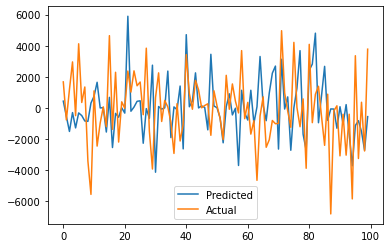

(20, 3, 0.5, 'mae')
rmse:  2586.7675041017446
mape:  2.930816327459376


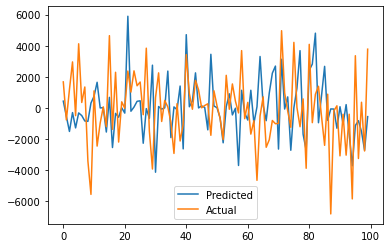

(20, 3, 1, 'rmse')
rmse:  2619.7186497352927
mape:  4.7142929991917395


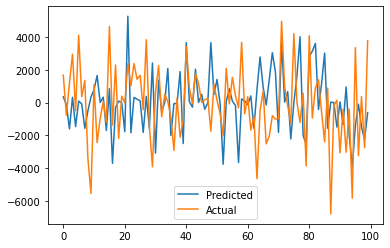

(20, 3, 1, 'mae')
rmse:  2619.7186497352927
mape:  4.7142929991917395


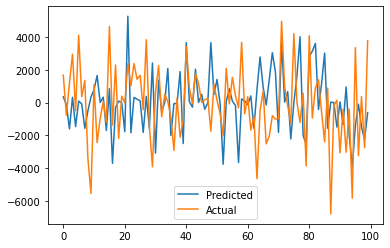

(20, 6, 0.5, 'rmse')
rmse:  2601.6465135461513
mape:  4.098004983155412


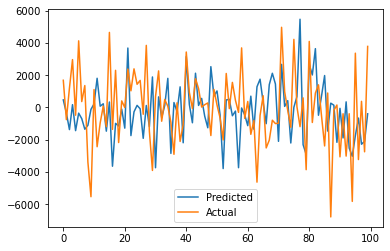

(20, 6, 0.5, 'mae')
rmse:  2601.6465135461513
mape:  4.098004983155412


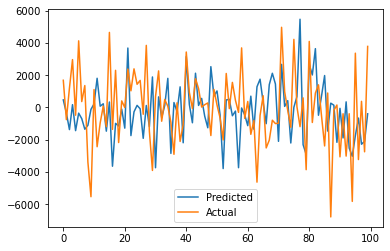

(20, 6, 1, 'rmse')
rmse:  2645.831565677565
mape:  7.341265910629289


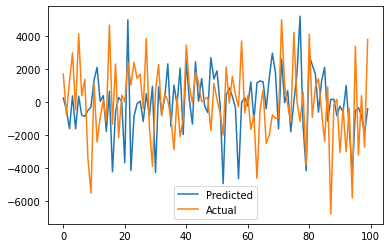

(20, 6, 1, 'mae')
rmse:  2645.831565677565
mape:  7.341265910629289


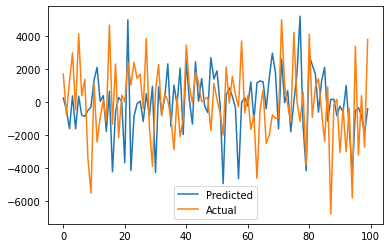

(20, 12, 0.5, 'rmse')
rmse:  2852.752847058109
mape:  3.642667072463502


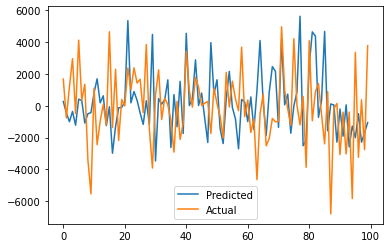

(20, 12, 0.5, 'mae')
rmse:  2852.752847058109
mape:  3.642667072463502


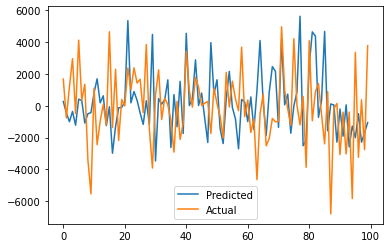

(20, 12, 1, 'rmse')
rmse:  2724.4400095634783
mape:  7.206838333805722


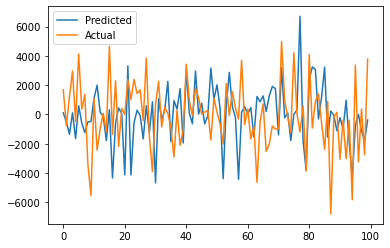

(20, 12, 1, 'mae')
rmse:  2724.4400095634783
mape:  7.206838333805722


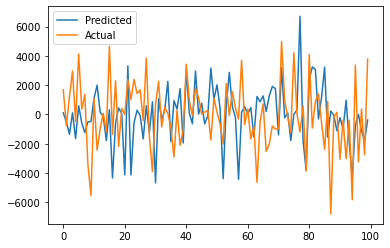

(100, 3, 0.5, 'rmse')
rmse:  2586.7675041017446
mape:  2.930816327459376


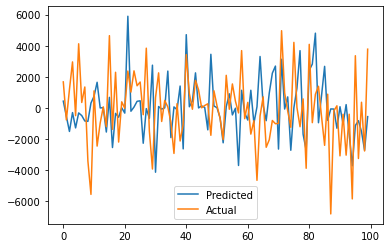

(100, 3, 0.5, 'mae')
rmse:  2586.7675041017446
mape:  2.930816327459376


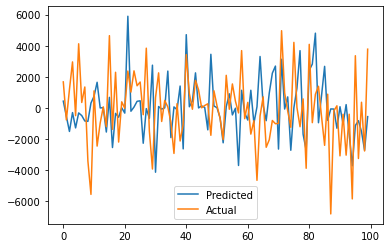

(100, 3, 1, 'rmse')
rmse:  2619.7186497352927
mape:  4.7142929991917395


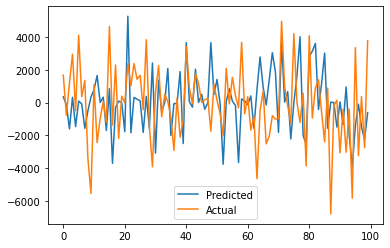

(100, 3, 1, 'mae')
rmse:  2619.7186497352927
mape:  4.7142929991917395


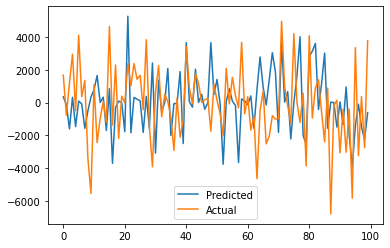

(100, 6, 0.5, 'rmse')
rmse:  2601.4370344246763
mape:  4.094414513088623


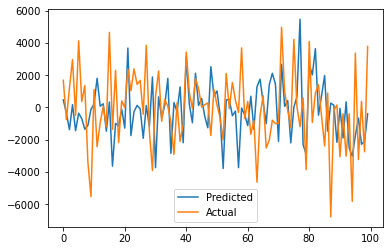

(100, 6, 0.5, 'mae')
rmse:  2601.4370344246763
mape:  4.094414513088623


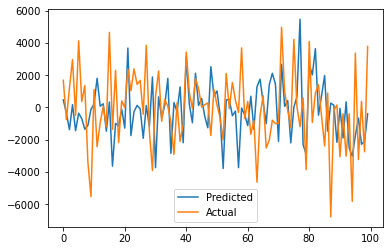

(100, 6, 1, 'rmse')
rmse:  2648.1553444653673
mape:  7.365266923830587


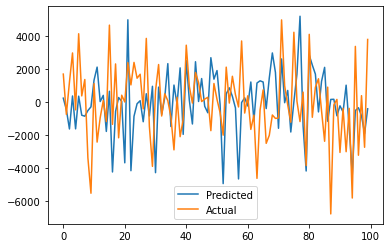

(100, 6, 1, 'mae')
rmse:  2648.1553444653673
mape:  7.365266923830587


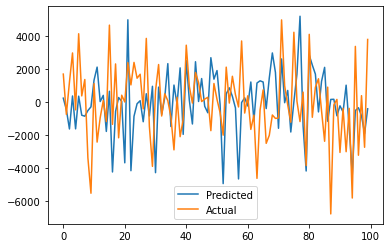

(100, 12, 0.5, 'rmse')
rmse:  2868.5532111483044
mape:  3.4267481124800785


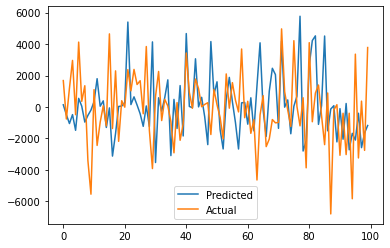

(100, 12, 0.5, 'mae')
rmse:  2868.5532111483044
mape:  3.4267481124800785


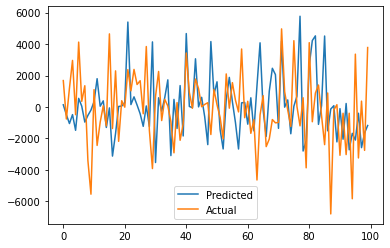

(100, 12, 1, 'rmse')
rmse:  2732.435651152341
mape:  7.203686719514277


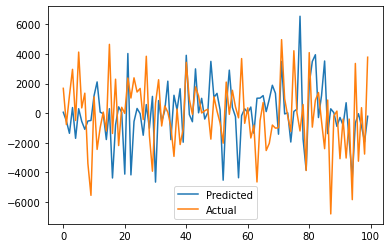

(100, 12, 1, 'mae')
rmse:  2732.435651152341
mape:  7.203686719514277


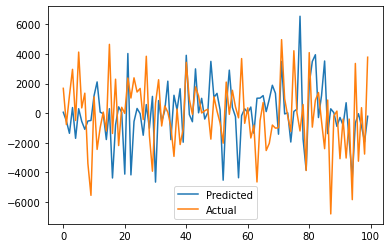

In [102]:
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc5, y_train_btc5)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc5)):
        test = fresh_test_btc5.iloc[i]
        actual = y_test_btc5.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

    print(x)
    mse = mean_squared_error(y_true, y_pred)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true, y_pred)
    print('mape: ', mape)
    
    plt.plot(y_pred, label='Predicted')
    plt.plot(y_true, label='Actual')
    plt.legend()
    plt.show()

## XGBoost regressor - logarithms

In [238]:
log_fresh_data = np.log(fresh_data_btc)
log_y = np.log(y)

In [239]:
target_variable2 = log_fresh_data[['PriceUSD']]

In [240]:
target_variable2.dropna(inplace=True)

In [241]:
ad_fuller_result2 = adfuller(target_variable2, autolag='AIC')

In [242]:
print(f'ADF Statistic: {ad_fuller_result2[0]}') # p-value is greater then 1, so we cannot reject the null hypothesis that the data is non-stationary

print(f'p-value: {ad_fuller_result2[1]}')

for key, value in ad_fuller_result2[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -1.9431422056211887
p-value: 0.3120455815488229
Critial Values:
   1%, -3.432421082272174
Critial Values:
   5%, -2.8624550771782253
Critial Values:
   10%, -2.567257116748117


In [243]:
log_y.tail()

,new_close
date,
2021-08-29,10.797191
2021-08-30,10.798499
2021-08-31,10.759898
2021-09-01,10.762959
2021-09-02,10.794745


In [244]:
log_fresh_train_btc = log_fresh_data[0:-200]
log_y_train_btc = log_y[0:-200]
log_fresh_test_btc = log_fresh_data[-200:-100]
log_y_test_btc = log_y[-200:-100]

In [245]:
fresh_train_btc4 = log_fresh_train_btc[selected_feat_btc2]
fresh_train_btc4['PriceUSD'] = log_fresh_train_btc['PriceUSD']
y_train_btc4 = log_y_train_btc.copy()
fresh_test_btc4 = log_fresh_test_btc[selected_feat_btc2]
fresh_test_btc4['PriceUSD'] = log_fresh_test_btc['PriceUSD']
y_test_btc4 = log_y_test_btc.copy()

(0, 3, 0.5, 'rmse')
rmse:  9390.891801691847
mape:  0.14750257529697453


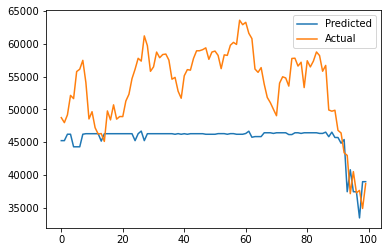

(0, 3, 0.5, 'mae')
rmse:  9390.891801691847
mape:  0.14750257529697453


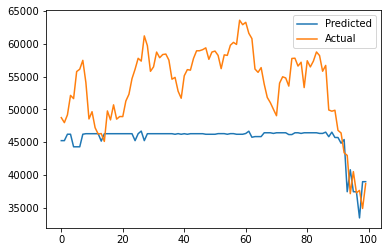

(0, 3, 1, 'rmse')
rmse:  8944.604405212045
mape:  0.13929535627858292


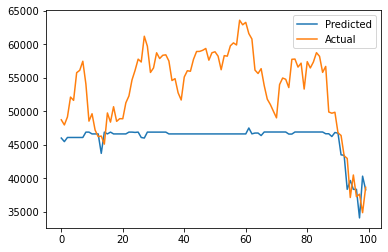

(0, 3, 1, 'mae')
rmse:  8944.604405212045
mape:  0.13929535627858292


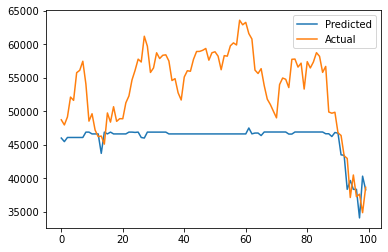

(0, 6, 0.5, 'rmse')
rmse:  9530.547619193256
mape:  0.15302070283936506


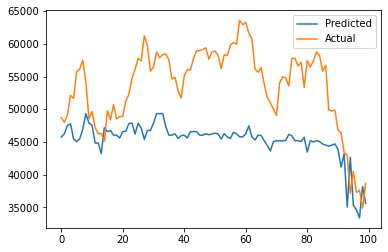

(0, 6, 0.5, 'mae')
rmse:  9530.547619193256
mape:  0.15302070283936506


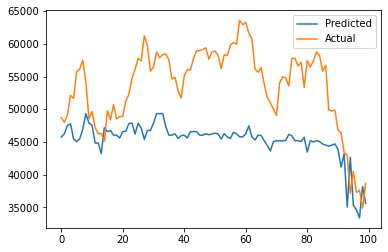

(0, 6, 1, 'rmse')
rmse:  9351.879885852795
mape:  0.14900039948208188


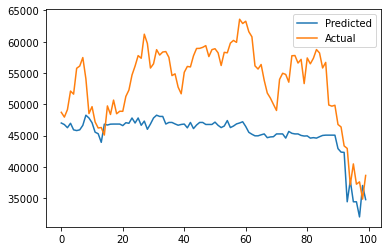

(0, 6, 1, 'mae')
rmse:  9351.879885852795
mape:  0.14900039948208188


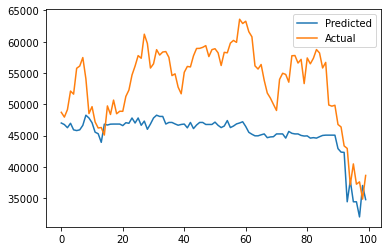

(0, 12, 0.5, 'rmse')
rmse:  8529.510560427623
mape:  0.13151376097640385


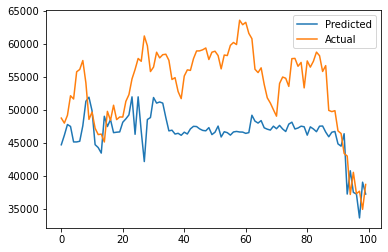

(0, 12, 0.5, 'mae')
rmse:  8529.510560427623
mape:  0.13151376097640385


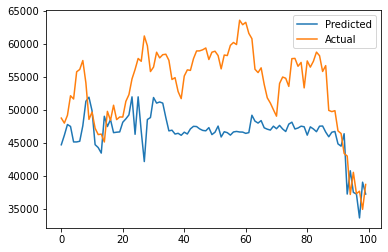

(0, 12, 1, 'rmse')
rmse:  8475.484794381311
mape:  0.1329210493883056


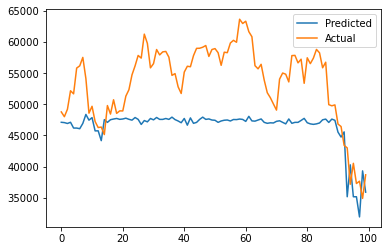

(0, 12, 1, 'mae')
rmse:  8475.484794381311
mape:  0.1329210493883056


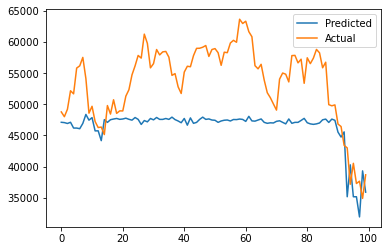

(1, 3, 0.5, 'rmse')
rmse:  22371.7130764932
mape:  0.39320049571064153


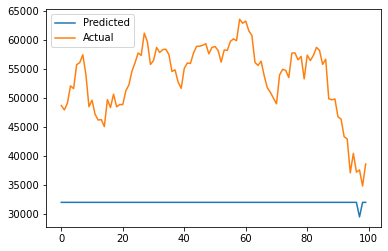

(1, 3, 0.5, 'mae')
rmse:  22371.7130764932
mape:  0.39320049571064153


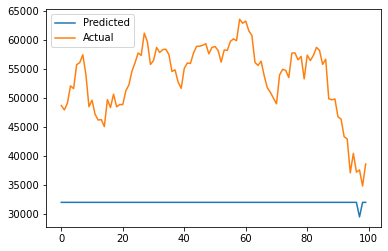

(1, 3, 1, 'rmse')
rmse:  21361.335479509828
mape:  0.3732301690560184


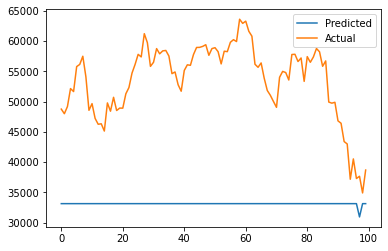

(1, 3, 1, 'mae')
rmse:  21361.335479509828
mape:  0.3732301690560184


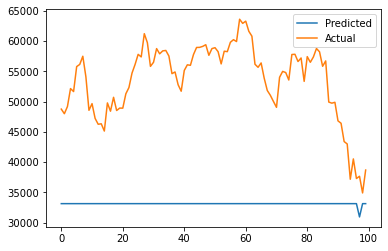

(1, 6, 0.5, 'rmse')
rmse:  22384.658943402414
mape:  0.39345914788130654


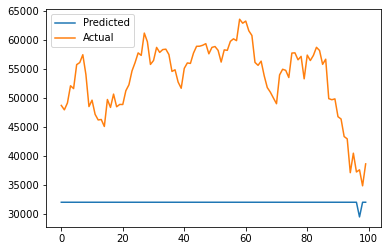

(1, 6, 0.5, 'mae')
rmse:  22384.658943402414
mape:  0.39345914788130654


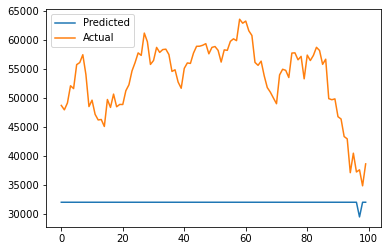

(1, 6, 1, 'rmse')
rmse:  21757.1779430621
mape:  0.38101848932138843


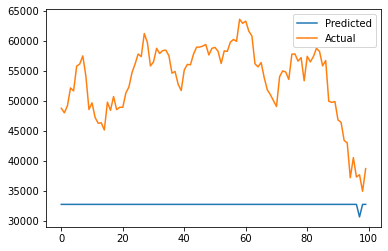

(1, 6, 1, 'mae')
rmse:  21757.1779430621
mape:  0.38101848932138843


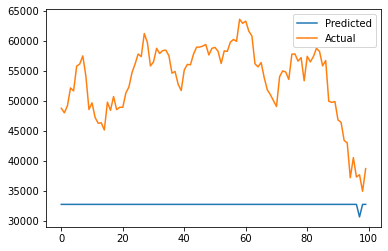

(1, 12, 0.5, 'rmse')
rmse:  22384.658943402414
mape:  0.39345914788130654


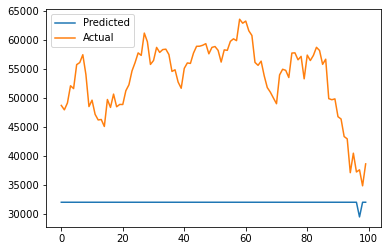

(1, 12, 0.5, 'mae')
rmse:  22384.658943402414
mape:  0.39345914788130654


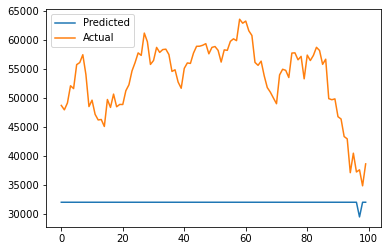

(1, 12, 1, 'rmse')
rmse:  21757.1779430621
mape:  0.38101848932138843


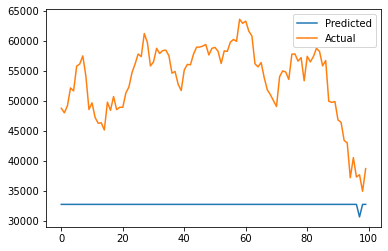

(1, 12, 1, 'mae')
rmse:  21757.1779430621
mape:  0.38101848932138843


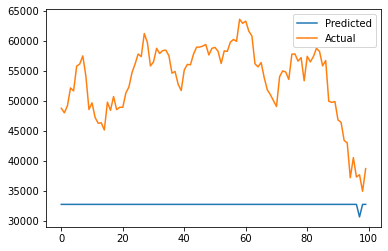

(5, 3, 0.5, 'rmse')
rmse:  29281.302544207538
mape:  0.5274238710265785


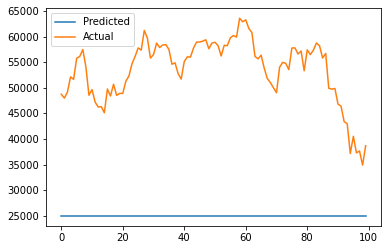

(5, 3, 0.5, 'mae')
rmse:  29281.302544207538
mape:  0.5274238710265785


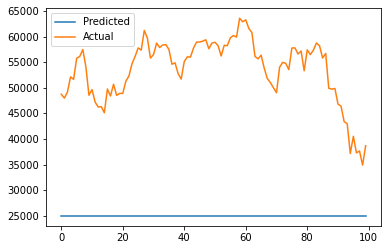

(5, 3, 1, 'rmse')
rmse:  27469.637580794402
mape:  0.4922909901226362


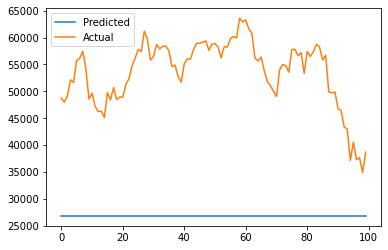

(5, 3, 1, 'mae')
rmse:  27469.637580794402
mape:  0.4922909901226362


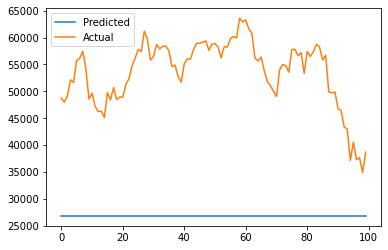

(5, 6, 0.5, 'rmse')
rmse:  29281.302544207538
mape:  0.5274238710265785


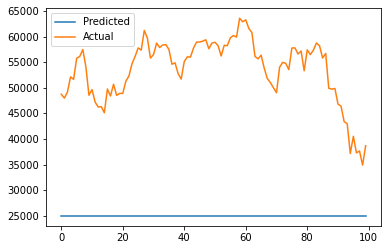

(5, 6, 0.5, 'mae')
rmse:  29281.302544207538
mape:  0.5274238710265785


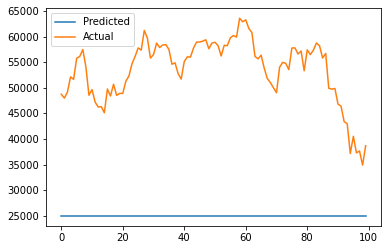

(5, 6, 1, 'rmse')
rmse:  26955.688868097783
mape:  0.48230347835447845


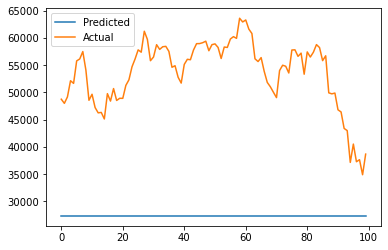

(5, 6, 1, 'mae')
rmse:  26955.688868097783
mape:  0.48230347835447845


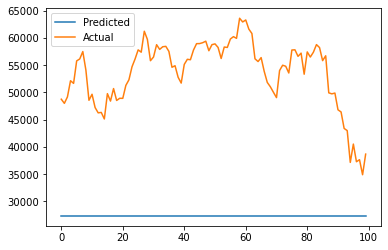

(5, 12, 0.5, 'rmse')
rmse:  29281.302544207538
mape:  0.5274238710265785


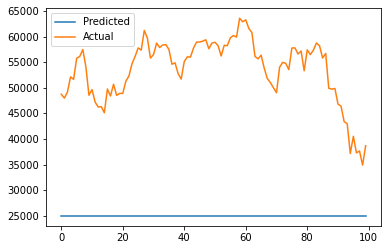

(5, 12, 0.5, 'mae')
rmse:  29281.302544207538
mape:  0.5274238710265785


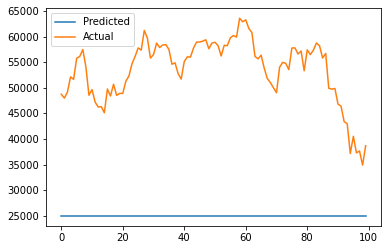

(5, 12, 1, 'rmse')
rmse:  26955.688868097783
mape:  0.48230347835447845


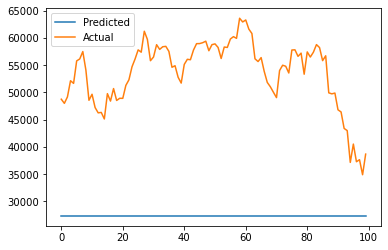

(5, 12, 1, 'mae')
rmse:  26955.688868097783
mape:  0.48230347835447845


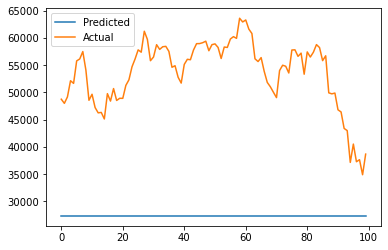

(20, 3, 0.5, 'rmse')
rmse:  34999.55347333375
mape:  0.6377472690318278


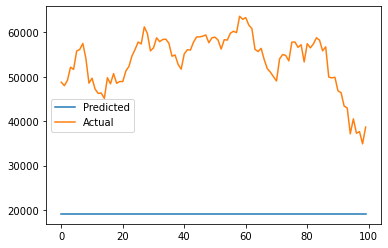

(20, 3, 0.5, 'mae')
rmse:  34999.55347333375
mape:  0.6377472690318278


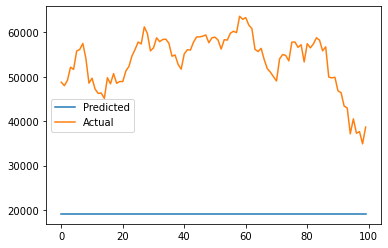

(20, 3, 1, 'rmse')
rmse:  34731.476581660005
mape:  0.6325903165764971


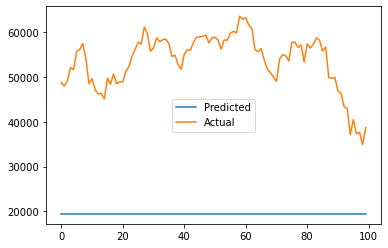

(20, 3, 1, 'mae')
rmse:  34731.476581660005
mape:  0.6325903165764971


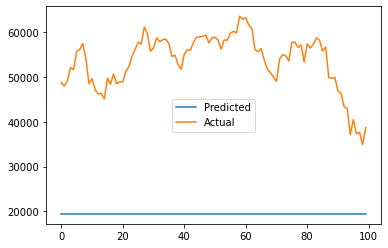

(20, 6, 0.5, 'rmse')
rmse:  34999.55347333375
mape:  0.6377472690318278


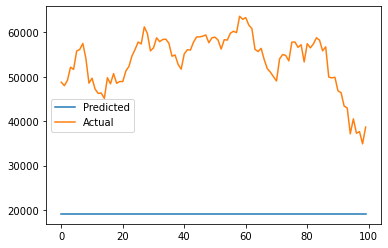

(20, 6, 0.5, 'mae')
rmse:  34999.55347333375
mape:  0.6377472690318278


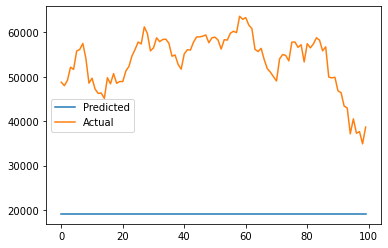

(20, 6, 1, 'rmse')
rmse:  34731.476581660005
mape:  0.6325903165764971


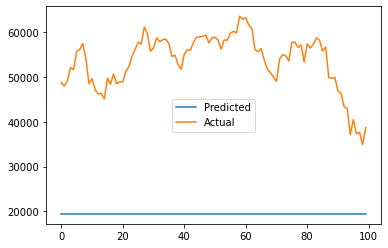

(20, 6, 1, 'mae')
rmse:  34731.476581660005
mape:  0.6325903165764971


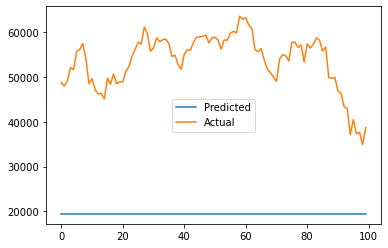

(20, 12, 0.5, 'rmse')
rmse:  34999.55347333375
mape:  0.6377472690318278


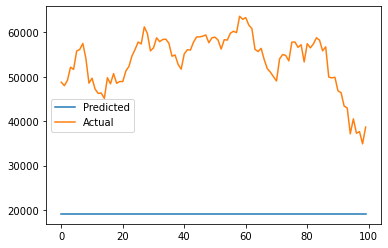

(20, 12, 0.5, 'mae')
rmse:  34999.55347333375
mape:  0.6377472690318278


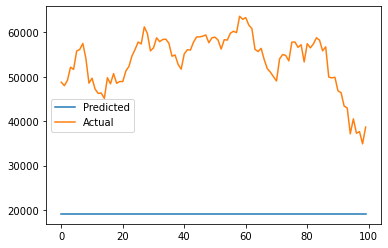

(20, 12, 1, 'rmse')
rmse:  34731.476581660005
mape:  0.6325903165764971


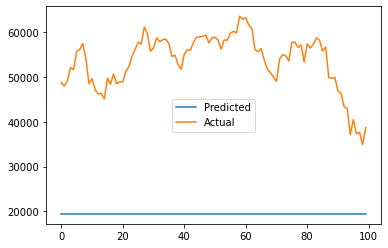

(20, 12, 1, 'mae')
rmse:  34731.476581660005
mape:  0.6325903165764971


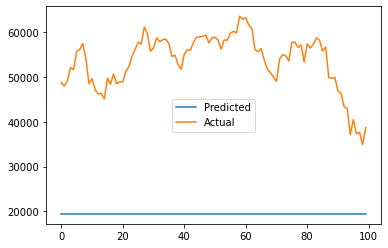

(100, 3, 0.5, 'rmse')
rmse:  45782.32149504953
mape:  0.8443958615693511


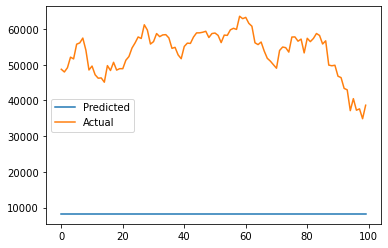

(100, 3, 0.5, 'mae')
rmse:  45782.32149504953
mape:  0.8443958615693511


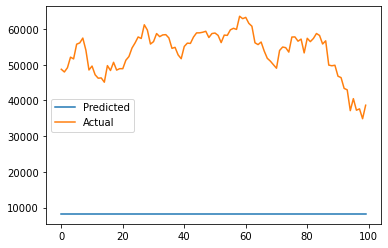

(100, 3, 1, 'rmse')
rmse:  43310.81813911209
mape:  0.7971371535419912


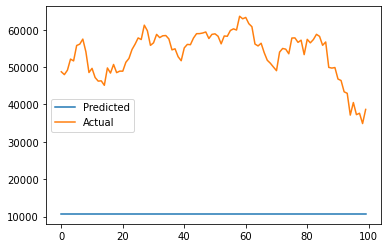

(100, 3, 1, 'mae')
rmse:  43310.81813911209
mape:  0.7971371535419912


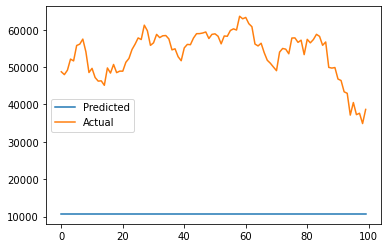

(100, 6, 0.5, 'rmse')
rmse:  45782.32149504953
mape:  0.8443958615693511


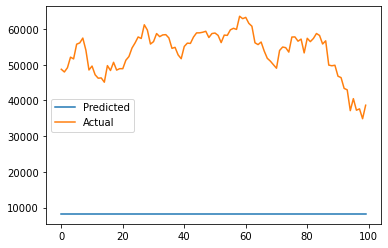

(100, 6, 0.5, 'mae')
rmse:  45782.32149504953
mape:  0.8443958615693511


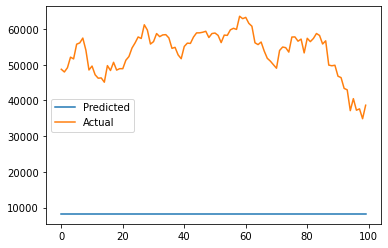

(100, 6, 1, 'rmse')
rmse:  43310.81813911209
mape:  0.7971371535419912


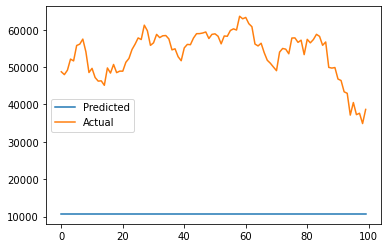

(100, 6, 1, 'mae')
rmse:  43310.81813911209
mape:  0.7971371535419912


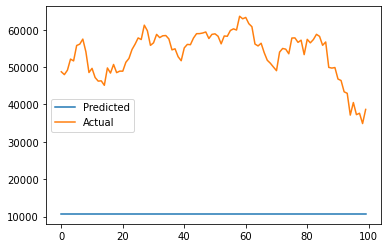

(100, 12, 0.5, 'rmse')
rmse:  45782.32149504953
mape:  0.8443958615693511


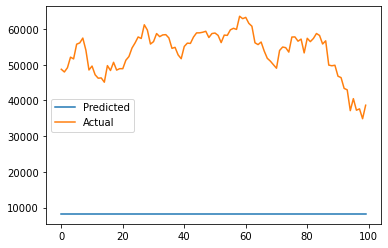

(100, 12, 0.5, 'mae')
rmse:  45782.32149504953
mape:  0.8443958615693511


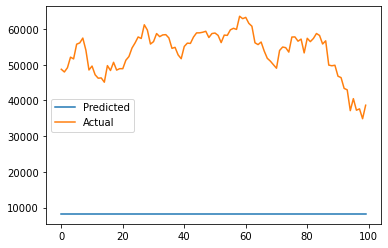

(100, 12, 1, 'rmse')
rmse:  43310.81813911209
mape:  0.7971371535419912


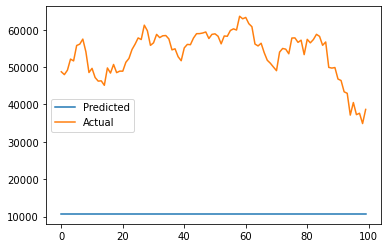

(100, 12, 1, 'mae')
rmse:  43310.81813911209
mape:  0.7971371535419912


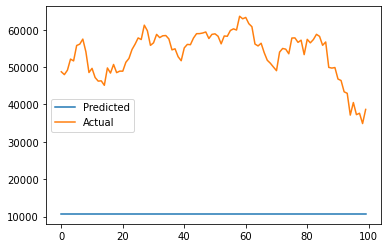

In [246]:
best_mape2 = ''
best_mape = 1
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc4, y_train_btc4)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc4)):
        test = fresh_test_btc4.iloc[i]
        actual = y_test_btc4.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)
        
    y_pred2 = [i for i in np.exp(y_pred)]     # to show predicitons in terms of actual price rather than logs
    y_true2 = [i for i in np.exp(y_true)]

    print(x)
    mse = mean_squared_error(y_true2, y_pred2)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true2, y_pred2)
    print('mape: ', mape)
    
    if mape < best_mape:
        best_mape = mape
        best_mape2 = str(mape) + '_' + str(x)
    
    plt.plot(y_pred2, label='Predicted')
    plt.plot(y_true2, label='Actual')
    plt.legend()
    plt.show()

In [247]:
best_mape2

"0.13151376097640385_(0, 12, 0.5, 'rmse')"

## XGBoost regressor - univariate

(0, 3, 0.5, 'rmse')
rmse:  8747.873570328802
mape:  0.1381936957813207


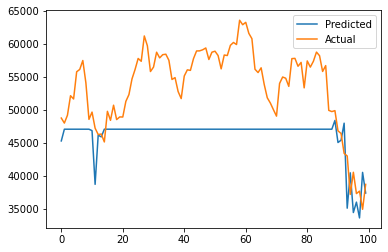

(0, 3, 0.5, 'mae')
rmse:  8747.873570328802
mape:  0.1381936957813207


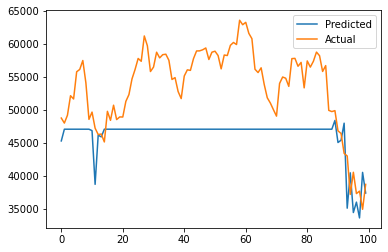

(0, 3, 1, 'rmse')
rmse:  8841.994037893759
mape:  0.13934817506740438


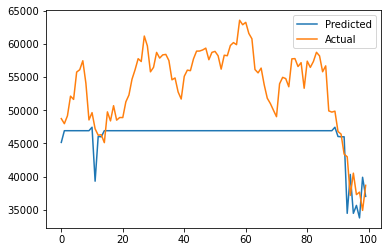

(0, 3, 1, 'mae')
rmse:  8841.994037893759
mape:  0.13934817506740438


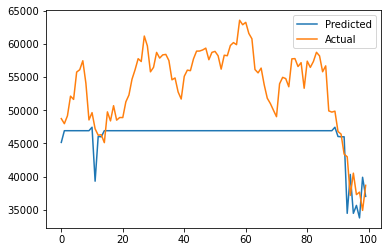

(0, 6, 0.5, 'rmse')
rmse:  8723.640794012468
mape:  0.13811394490766235


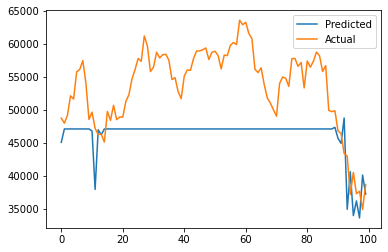

(0, 6, 0.5, 'mae')
rmse:  8723.640794012468
mape:  0.13811394490766235


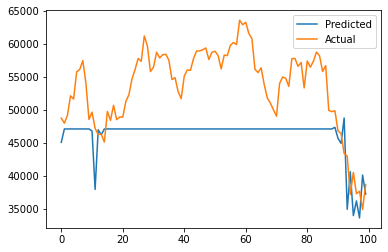

(0, 6, 1, 'rmse')
rmse:  8789.346599010887
mape:  0.1386997318817123


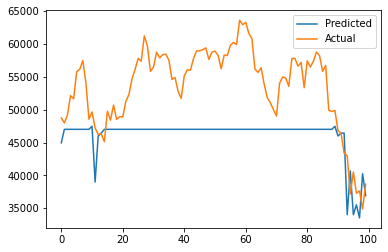

(0, 6, 1, 'mae')
rmse:  8789.346599010887
mape:  0.1386997318817123


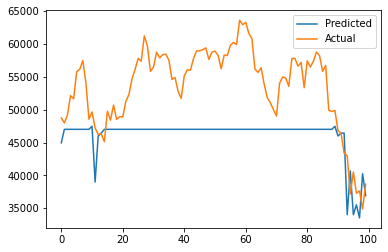

(0, 12, 0.5, 'rmse')
rmse:  8750.42489220983
mape:  0.1387944210502388


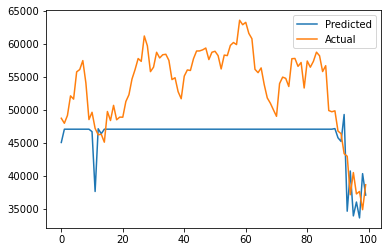

(0, 12, 0.5, 'mae')
rmse:  8750.42489220983
mape:  0.1387944210502388


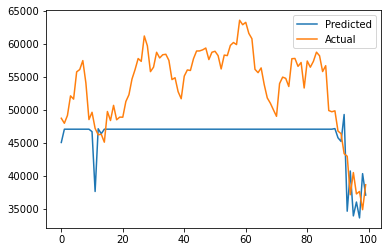

(0, 12, 1, 'rmse')
rmse:  8758.541811074729
mape:  0.13822272822607162


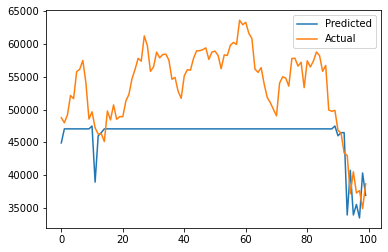

(0, 12, 1, 'mae')
rmse:  8758.541811074729
mape:  0.13822272822607162


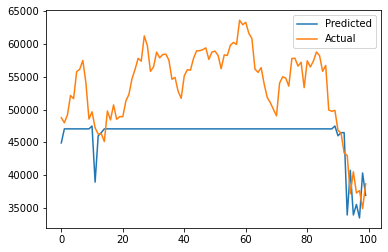

(1, 3, 0.5, 'rmse')
rmse:  8747.873570328802
mape:  0.1381936957813207


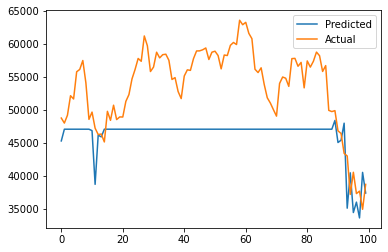

(1, 3, 0.5, 'mae')
rmse:  8747.873570328802
mape:  0.1381936957813207


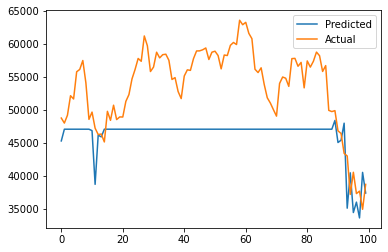

(1, 3, 1, 'rmse')
rmse:  8841.994037893759
mape:  0.13934817506740438


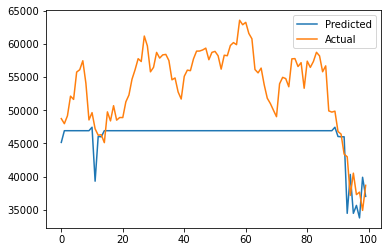

(1, 3, 1, 'mae')
rmse:  8841.994037893759
mape:  0.13934817506740438


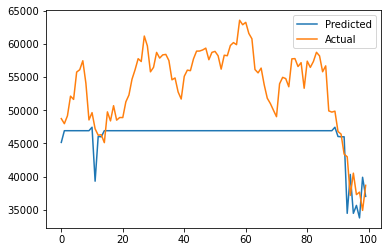

(1, 6, 0.5, 'rmse')
rmse:  8723.640794012468
mape:  0.13811394490766235


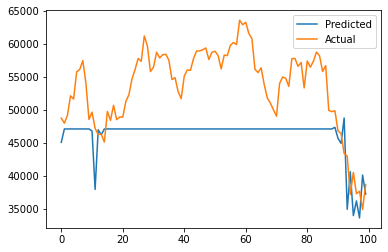

(1, 6, 0.5, 'mae')
rmse:  8723.640794012468
mape:  0.13811394490766235


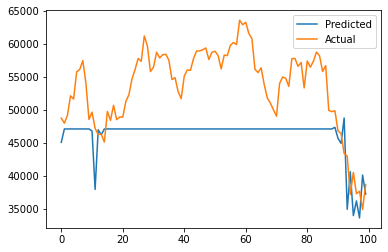

(1, 6, 1, 'rmse')
rmse:  8789.346599010887
mape:  0.1386997318817123


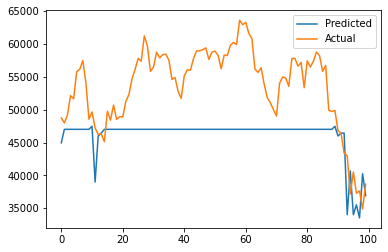

(1, 6, 1, 'mae')
rmse:  8789.346599010887
mape:  0.1386997318817123


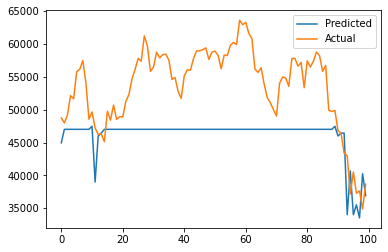

(1, 12, 0.5, 'rmse')
rmse:  8750.037765021592
mape:  0.1387592223429982


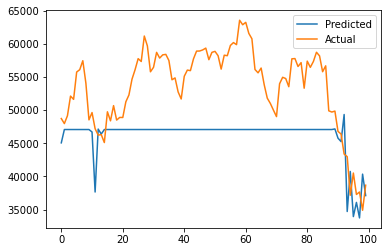

(1, 12, 0.5, 'mae')
rmse:  8750.037765021592
mape:  0.1387592223429982


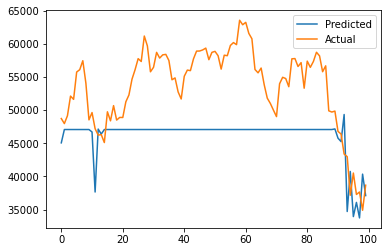

(1, 12, 1, 'rmse')
rmse:  8758.554214214893
mape:  0.1382230572557567


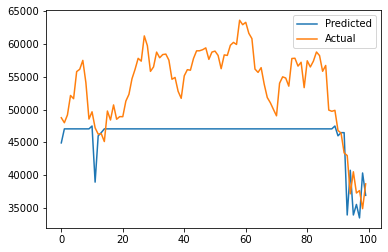

(1, 12, 1, 'mae')
rmse:  8758.554214214893
mape:  0.1382230572557567


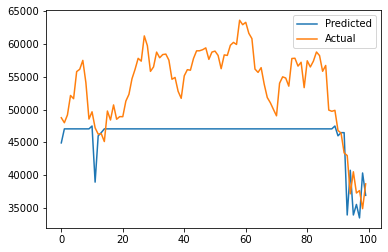

(5, 3, 0.5, 'rmse')
rmse:  8747.873570328802
mape:  0.1381936957813207


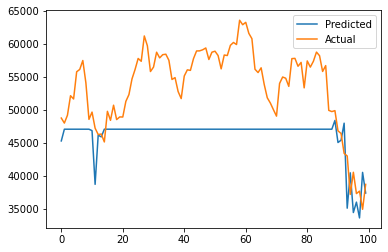

(5, 3, 0.5, 'mae')
rmse:  8747.873570328802
mape:  0.1381936957813207


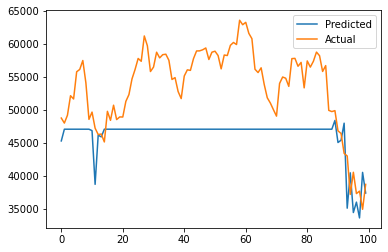

(5, 3, 1, 'rmse')
rmse:  8841.994037893759
mape:  0.13934817506740438


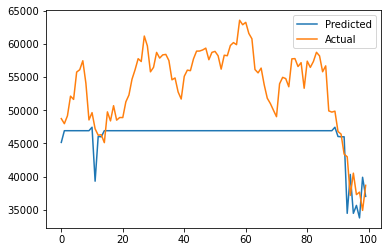

(5, 3, 1, 'mae')
rmse:  8841.994037893759
mape:  0.13934817506740438


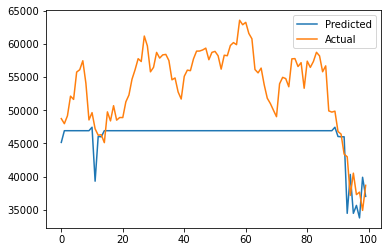

(5, 6, 0.5, 'rmse')
rmse:  8723.640794012468
mape:  0.13811394490766235


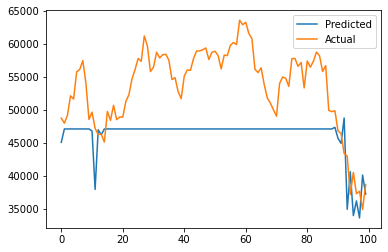

(5, 6, 0.5, 'mae')
rmse:  8723.640794012468
mape:  0.13811394490766235


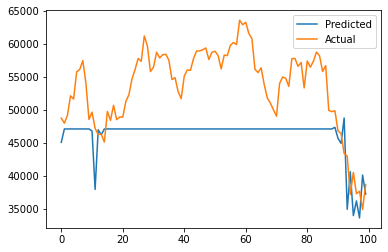

(5, 6, 1, 'rmse')
rmse:  8789.346599010887
mape:  0.1386997318817123


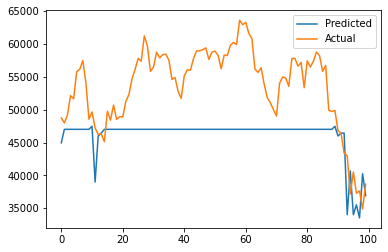

(5, 6, 1, 'mae')
rmse:  8789.346599010887
mape:  0.1386997318817123


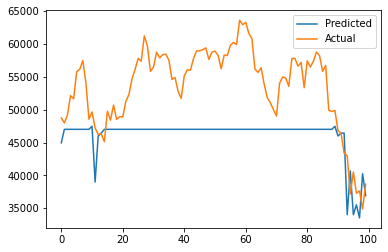

(5, 12, 0.5, 'rmse')
rmse:  8750.450581812642
mape:  0.1387938604870509


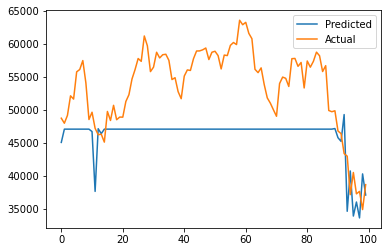

(5, 12, 0.5, 'mae')
rmse:  8750.450581812642
mape:  0.1387938604870509


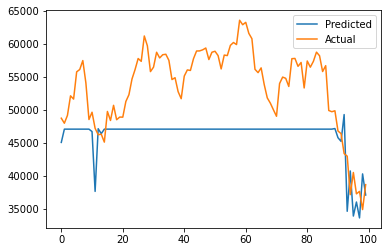

(5, 12, 1, 'rmse')
rmse:  8755.93137427367
mape:  0.13819345323491578


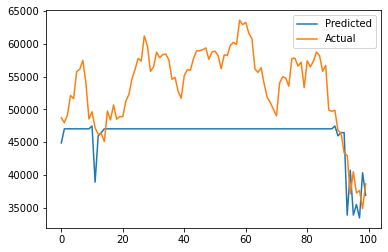

(5, 12, 1, 'mae')
rmse:  8755.93137427367
mape:  0.13819345323491578


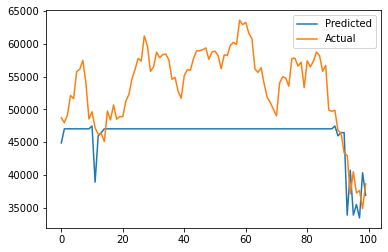

(20, 3, 0.5, 'rmse')
rmse:  8747.873570328802
mape:  0.1381936957813207


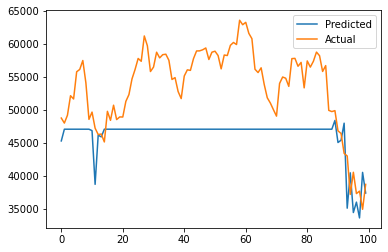

(20, 3, 0.5, 'mae')
rmse:  8747.873570328802
mape:  0.1381936957813207


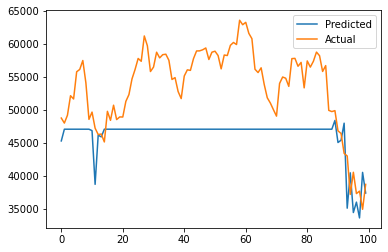

(20, 3, 1, 'rmse')
rmse:  8841.994037893759
mape:  0.13934817506740438


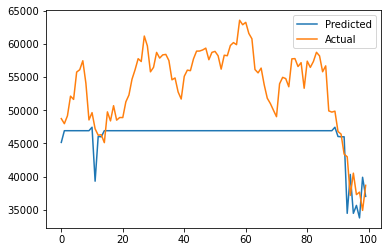

(20, 3, 1, 'mae')
rmse:  8841.994037893759
mape:  0.13934817506740438


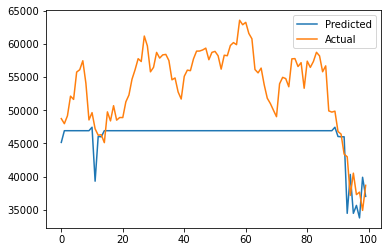

(20, 6, 0.5, 'rmse')
rmse:  8723.640794012468
mape:  0.13811394490766235


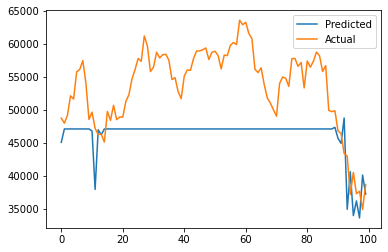

(20, 6, 0.5, 'mae')
rmse:  8723.640794012468
mape:  0.13811394490766235


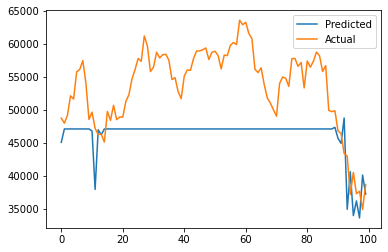

(20, 6, 1, 'rmse')
rmse:  8789.346599010887
mape:  0.1386997318817123


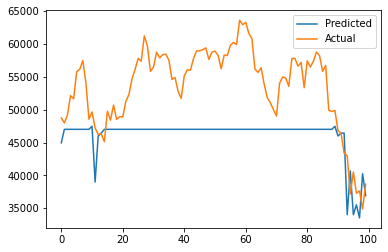

(20, 6, 1, 'mae')
rmse:  8789.346599010887
mape:  0.1386997318817123


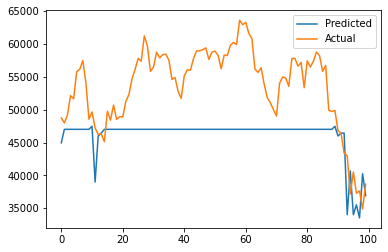

(20, 12, 0.5, 'rmse')
rmse:  8750.32280294553
mape:  0.13878283597415592


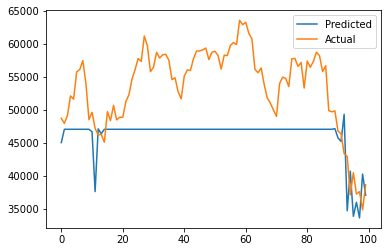

(20, 12, 0.5, 'mae')
rmse:  8750.32280294553
mape:  0.13878283597415592


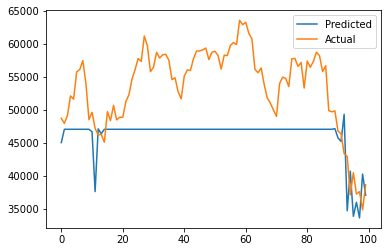

(20, 12, 1, 'rmse')
rmse:  8757.040034903011
mape:  0.1382071544444896


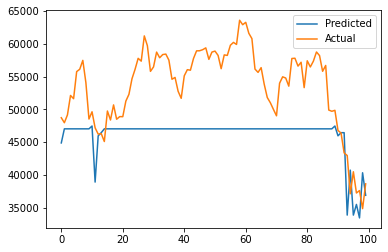

(20, 12, 1, 'mae')
rmse:  8757.040034903011
mape:  0.1382071544444896


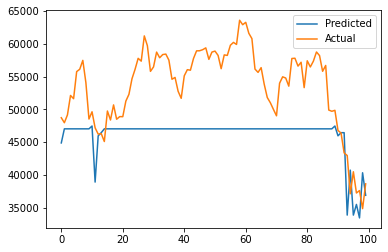

(100, 3, 0.5, 'rmse')
rmse:  8747.873570328802
mape:  0.1381936957813207


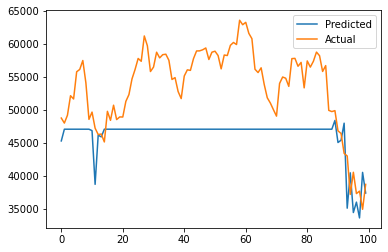

(100, 3, 0.5, 'mae')
rmse:  8747.873570328802
mape:  0.1381936957813207


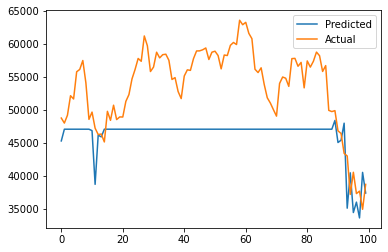

(100, 3, 1, 'rmse')
rmse:  8841.994037893759
mape:  0.13934817506740438


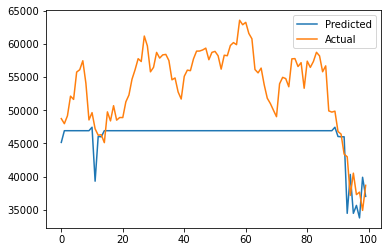

(100, 3, 1, 'mae')
rmse:  8841.994037893759
mape:  0.13934817506740438


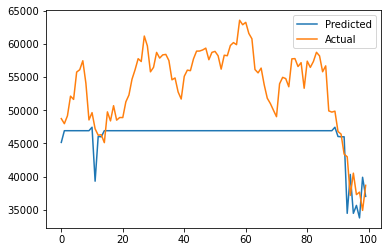

(100, 6, 0.5, 'rmse')
rmse:  8722.907026853985
mape:  0.13810079445820292


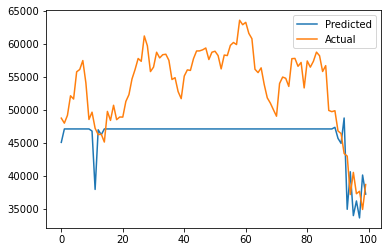

(100, 6, 0.5, 'mae')
rmse:  8722.907026853985
mape:  0.13810079445820292


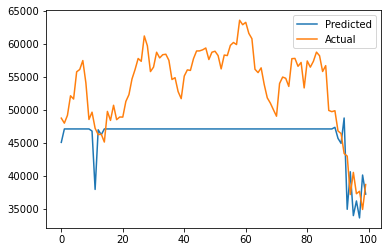

(100, 6, 1, 'rmse')
rmse:  8785.953812598787
mape:  0.13860090801193753


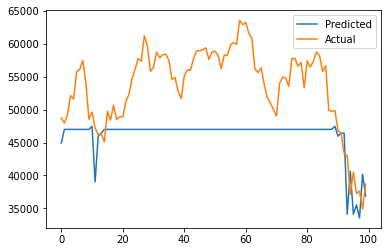

(100, 6, 1, 'mae')
rmse:  8785.953812598787
mape:  0.13860090801193753


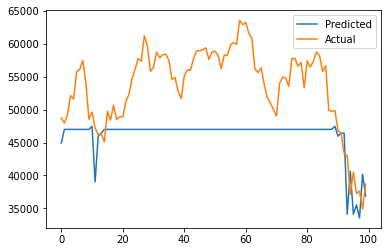

(100, 12, 0.5, 'rmse')
rmse:  8753.263096126871
mape:  0.13883660201898246


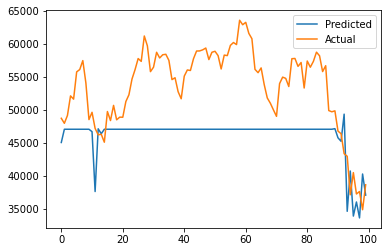

(100, 12, 0.5, 'mae')
rmse:  8753.263096126871
mape:  0.13883660201898246


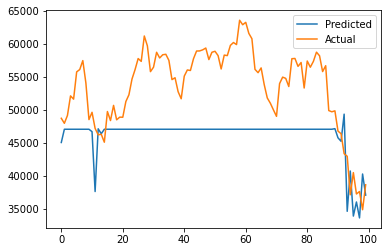

(100, 12, 1, 'rmse')
rmse:  8755.670097535904
mape:  0.1381876002055684


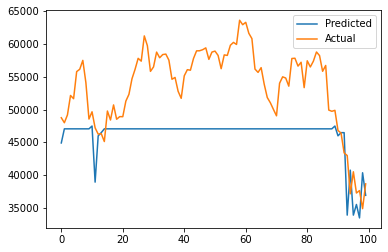

(100, 12, 1, 'mae')
rmse:  8755.670097535904
mape:  0.1381876002055684


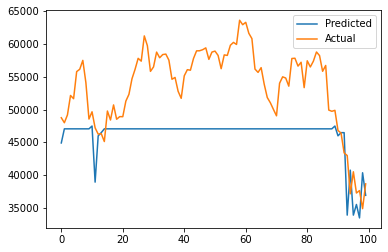

In [202]:
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc2[['PriceUSD']], y_train_btc2)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc2[['PriceUSD']])):
        test = fresh_test_btc2[['PriceUSD']].iloc[i]
        actual = y_test_btc2.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

    print(x)
    mse = mean_squared_error(y_true, y_pred)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true, y_pred)
    print('mape: ', mape)
    
    plt.plot(y_pred, label='Predicted')
    plt.plot(y_true, label='Actual')
    plt.legend()
    plt.show()

## XGBoost regressor - 5 day price lookback

In [194]:
price_only_train = fresh_train_btc2[['PriceUSD']]
price_only_test = fresh_test_btc2[['PriceUSD']]

In [195]:
a = list(price_only_train.columns)
for l in a:
    for i in range(5):
        for n in range(1, i + 1):
            price_only_train[l + str(i)] = price_only_train[l].shift(n)

In [196]:
a = list(price_only_test.columns)
for l in a:
    for i in range(5):
        for n in range(1, i + 1):
            price_only_test[l + str(i)] = price_only_test[l].shift(n)

In [197]:
price_only_train.dropna(inplace=True)

In [198]:
price_only_test.dropna(inplace=True)

In [199]:
price_only_y_train = y_train_btc2[4:]   # remove rows with nan values present after price look backs

In [200]:
price_only_y_test = y_test_btc2[4:]

(0, 3, 0.5, 'rmse')
rmse:  8354.759418111471
mape:  0.12438656688696274


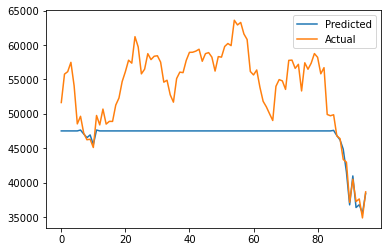

(0, 3, 0.5, 'mae')
rmse:  8354.759418111471
mape:  0.12438656688696274


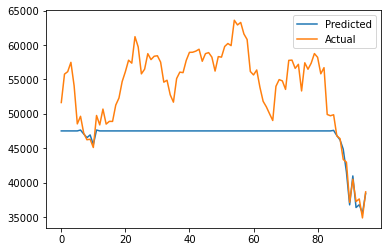

(0, 3, 1, 'rmse')
rmse:  8196.839362039867
mape:  0.1213030887266482


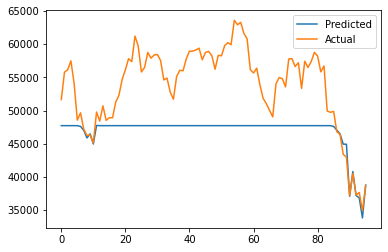

(0, 3, 1, 'mae')
rmse:  8196.839362039867
mape:  0.1213030887266482


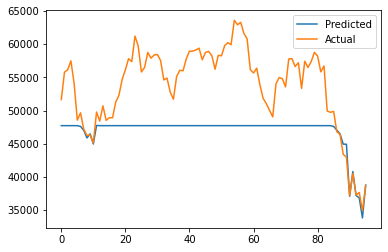

(0, 6, 0.5, 'rmse')
rmse:  8852.457469247647
mape:  0.13349551273362836


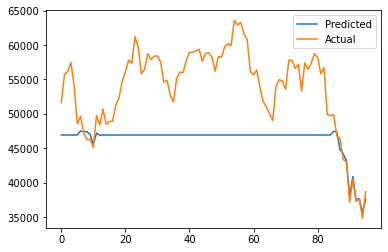

(0, 6, 0.5, 'mae')
rmse:  8852.457469247647
mape:  0.13349551273362836


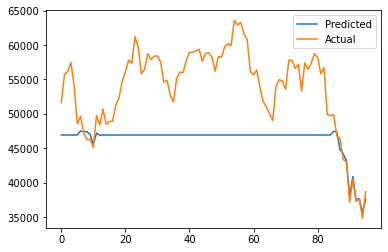

(0, 6, 1, 'rmse')
rmse:  8139.276489009112
mape:  0.12039937476350399


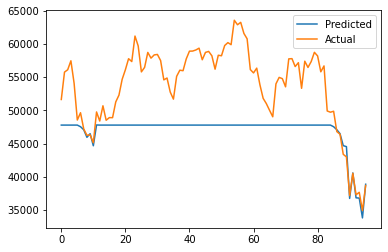

(0, 6, 1, 'mae')
rmse:  8139.276489009112
mape:  0.12039937476350399


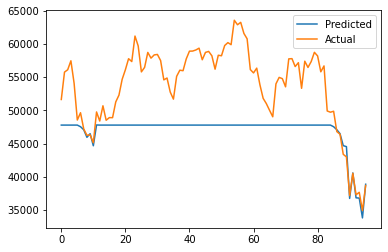

(0, 12, 0.5, 'rmse')
rmse:  8542.52900777486
mape:  0.1277983215337807


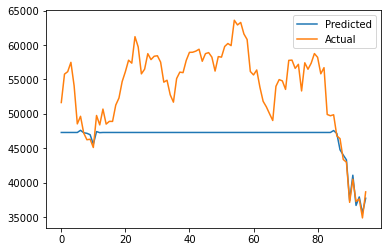

(0, 12, 0.5, 'mae')
rmse:  8542.52900777486
mape:  0.1277983215337807


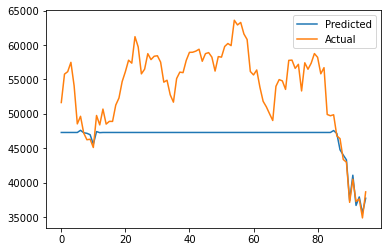

(0, 12, 1, 'rmse')
rmse:  8118.208800588375
mape:  0.12008460720037151


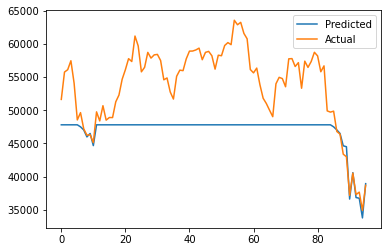

(0, 12, 1, 'mae')
rmse:  8118.208800588375
mape:  0.12008460720037151


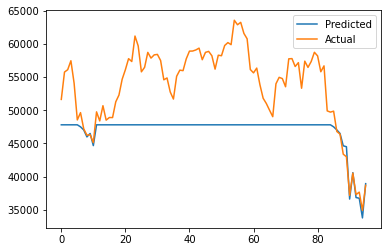

(1, 3, 0.5, 'rmse')
rmse:  8354.759418111471
mape:  0.12438656688696274


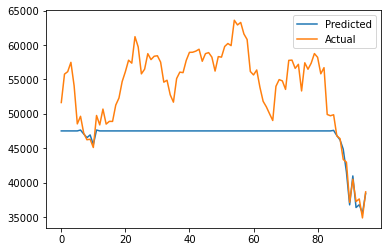

(1, 3, 0.5, 'mae')
rmse:  8354.759418111471
mape:  0.12438656688696274


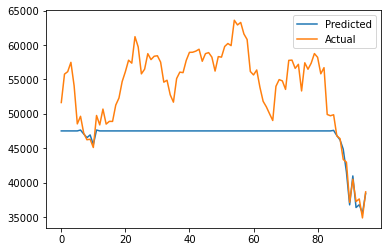

(1, 3, 1, 'rmse')
rmse:  8196.839362039867
mape:  0.1213030887266482


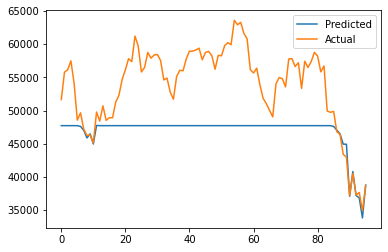

(1, 3, 1, 'mae')
rmse:  8196.839362039867
mape:  0.1213030887266482


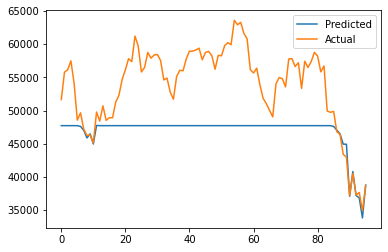

(1, 6, 0.5, 'rmse')
rmse:  8853.661102342214
mape:  0.13351869251853019


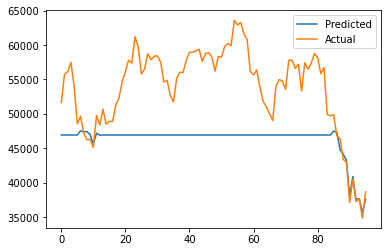

(1, 6, 0.5, 'mae')
rmse:  8853.661102342214
mape:  0.13351869251853019


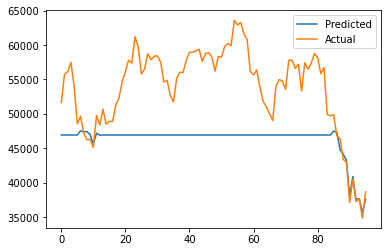

(1, 6, 1, 'rmse')
rmse:  8138.417537871196
mape:  0.1203838130531375


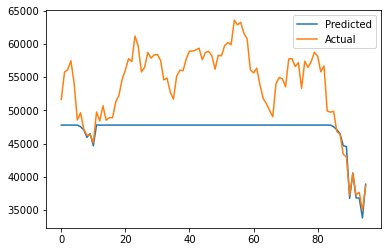

(1, 6, 1, 'mae')
rmse:  8138.417537871196
mape:  0.1203838130531375


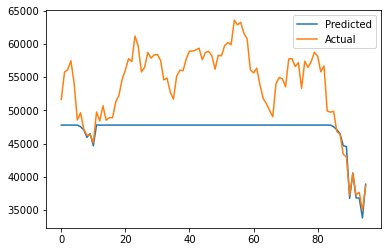

(1, 12, 0.5, 'rmse')
rmse:  8536.375516380413
mape:  0.12770330229962545


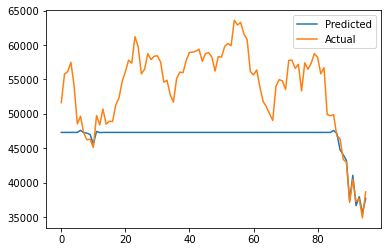

(1, 12, 0.5, 'mae')
rmse:  8536.375516380413
mape:  0.12770330229962545


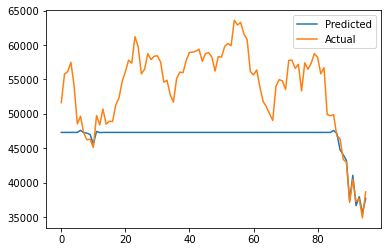

(1, 12, 1, 'rmse')
rmse:  8118.104319694861
mape:  0.12008513175175524


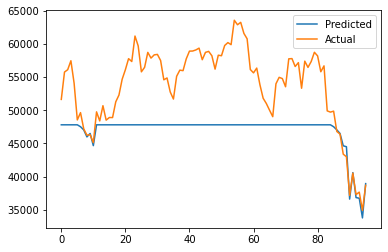

(1, 12, 1, 'mae')
rmse:  8118.104319694861
mape:  0.12008513175175524


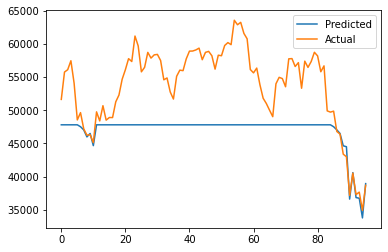

(5, 3, 0.5, 'rmse')
rmse:  8354.759418111471
mape:  0.12438656688696274


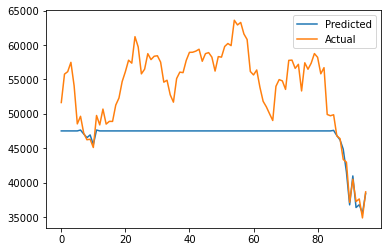

(5, 3, 0.5, 'mae')
rmse:  8354.759418111471
mape:  0.12438656688696274


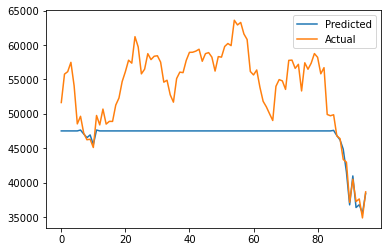

(5, 3, 1, 'rmse')
rmse:  8196.839362039867
mape:  0.1213030887266482


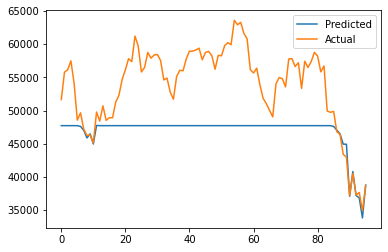

(5, 3, 1, 'mae')
rmse:  8196.839362039867
mape:  0.1213030887266482


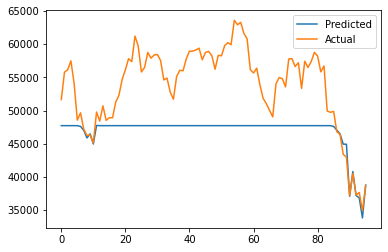

(5, 6, 0.5, 'rmse')
rmse:  8861.431685565736
mape:  0.1336230341454306


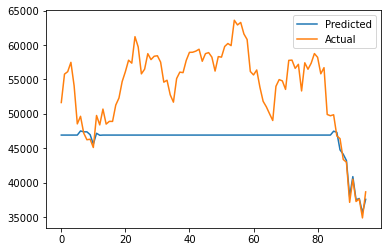

(5, 6, 0.5, 'mae')
rmse:  8861.431685565736
mape:  0.1336230341454306


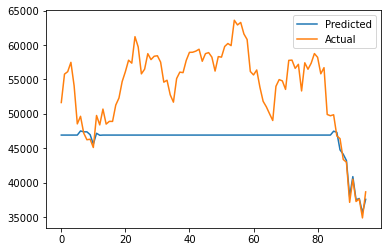

(5, 6, 1, 'rmse')
rmse:  8140.754512308249
mape:  0.12042315071106162


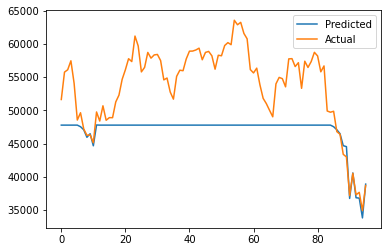

(5, 6, 1, 'mae')
rmse:  8140.754512308249
mape:  0.12042315071106162


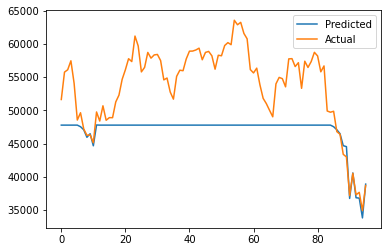

(5, 12, 0.5, 'rmse')
rmse:  8552.520130009263
mape:  0.12802964555939542


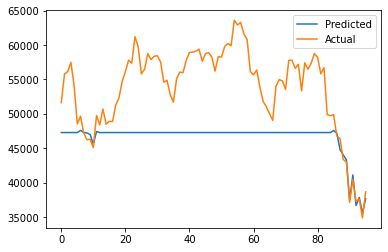

(5, 12, 0.5, 'mae')
rmse:  8552.520130009263
mape:  0.12802964555939542


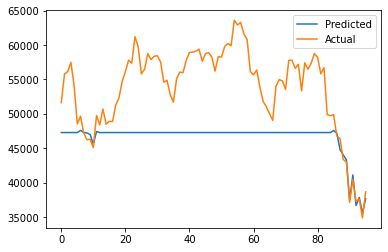

(5, 12, 1, 'rmse')
rmse:  8118.496914206552
mape:  0.12008723011727684


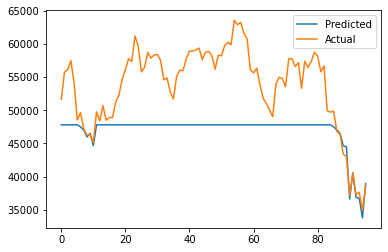

(5, 12, 1, 'mae')
rmse:  8118.496914206552
mape:  0.12008723011727684


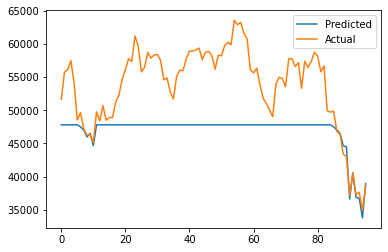

(20, 3, 0.5, 'rmse')
rmse:  8354.759418111471
mape:  0.12438656688696274


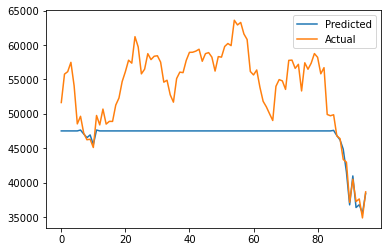

(20, 3, 0.5, 'mae')
rmse:  8354.759418111471
mape:  0.12438656688696274


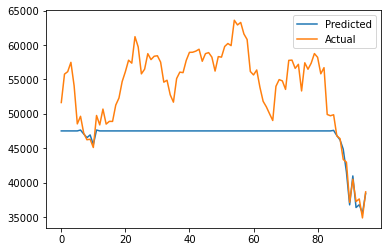

(20, 3, 1, 'rmse')
rmse:  8196.839362039867
mape:  0.1213030887266482


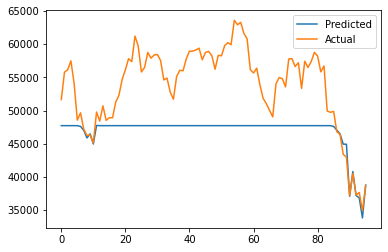

(20, 3, 1, 'mae')
rmse:  8196.839362039867
mape:  0.1213030887266482


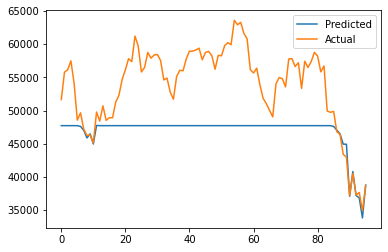

(20, 6, 0.5, 'rmse')
rmse:  8858.43714143875
mape:  0.1336113979458291


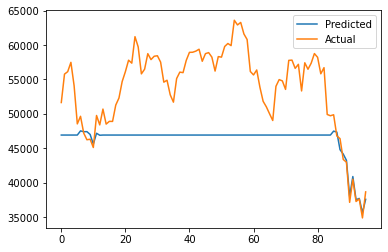

(20, 6, 0.5, 'mae')
rmse:  8858.43714143875
mape:  0.1336113979458291


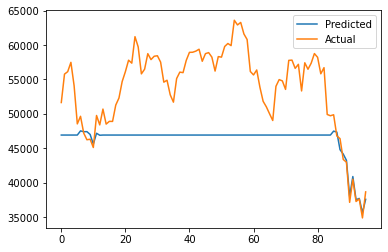

(20, 6, 1, 'rmse')
rmse:  8142.217314319032
mape:  0.12044677116604689


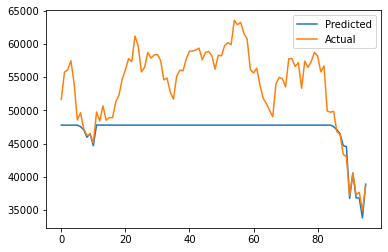

(20, 6, 1, 'mae')
rmse:  8142.217314319032
mape:  0.12044677116604689


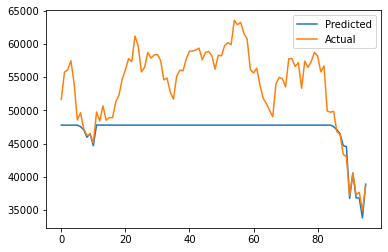

(20, 12, 0.5, 'rmse')
rmse:  8536.605439304372
mape:  0.12769134507090826


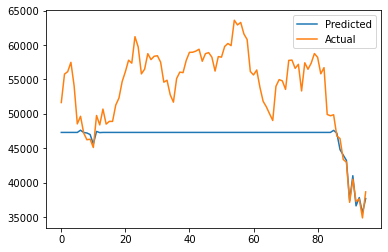

(20, 12, 0.5, 'mae')
rmse:  8536.605439304372
mape:  0.12769134507090826


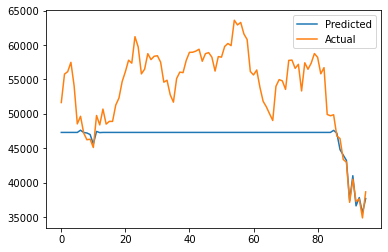

(20, 12, 1, 'rmse')
rmse:  8119.533577931385
mape:  0.12010713060347707


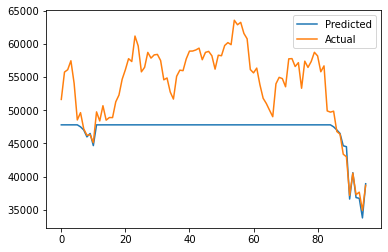

(20, 12, 1, 'mae')
rmse:  8119.533577931385
mape:  0.12010713060347707


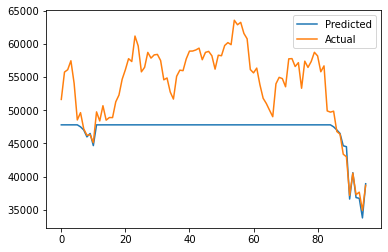

(100, 3, 0.5, 'rmse')
rmse:  8354.759418111471
mape:  0.12438656688696274


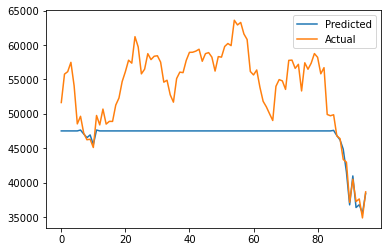

(100, 3, 0.5, 'mae')
rmse:  8354.759418111471
mape:  0.12438656688696274


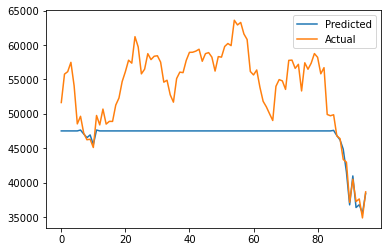

(100, 3, 1, 'rmse')
rmse:  8196.842620390928
mape:  0.12130314938277952


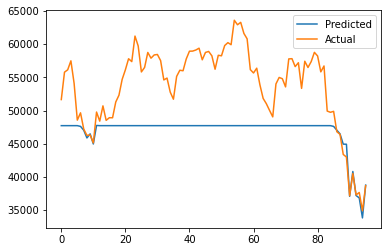

(100, 3, 1, 'mae')
rmse:  8196.842620390928
mape:  0.12130314938277952


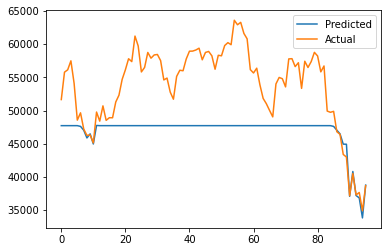

(100, 6, 0.5, 'rmse')
rmse:  8863.958601969078
mape:  0.13371910178124147


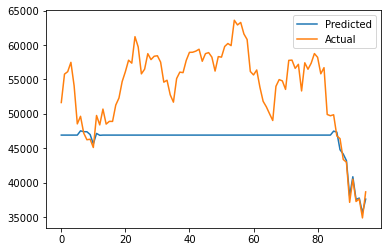

(100, 6, 0.5, 'mae')
rmse:  8863.958601969078
mape:  0.13371910178124147


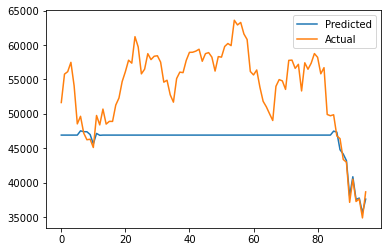

(100, 6, 1, 'rmse')
rmse:  8169.0080945042
mape:  0.12082798262726009


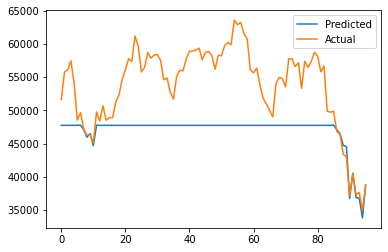

(100, 6, 1, 'mae')
rmse:  8169.0080945042
mape:  0.12082798262726009


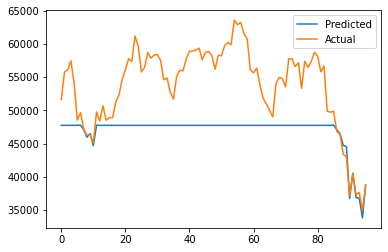

(100, 12, 0.5, 'rmse')
rmse:  8560.52897532484
mape:  0.12817386457051275


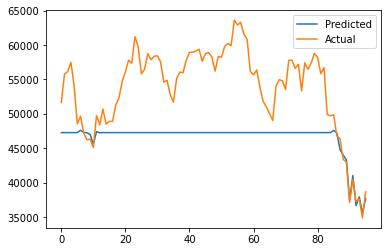

(100, 12, 0.5, 'mae')
rmse:  8560.52897532484
mape:  0.12817386457051275


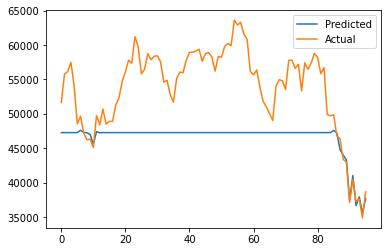

(100, 12, 1, 'rmse')
rmse:  8122.043348425105
mape:  0.1201455891101938


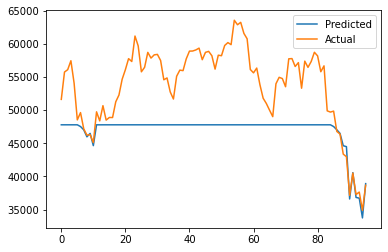

(100, 12, 1, 'mae')
rmse:  8122.043348425105
mape:  0.1201455891101938


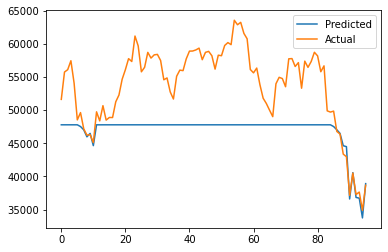

In [201]:
for x in cluster_combo_list:
    model = XGBRegressor(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(price_only_train, price_only_y_train)
    
    y_pred = []
    y_true = []
    for i in range(len(price_only_test)):
        test = price_only_test.iloc[i]
        actual = price_only_y_test.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

    print(x)
    mse = mean_squared_error(y_true, y_pred)
    rmse = math. sqrt(mse)
    print('rmse: ', rmse)
    
    mape = mean_absolute_percentage_error(y_true, y_pred)
    print('mape: ', mape)
    
    
    plt.plot(y_pred, label='Predicted')
    plt.plot(y_true, label='Actual')
    plt.legend()
    plt.show()

## XGBoost classifier- 5 day price lookback

In [471]:
btc_classifier_xgb = all_btc_data.iloc[1:]

In [472]:
list1 = []
for i in range(len(btc_classifier_xgb)):
    if btc_classifier_xgb['new_close'].iloc[i] > btc_classifier_xgb['PriceUSD'].iloc[i]:
        list1.append(1)
    else:
        list1.append(0)

In [473]:
btc_classifier_xgb['new_close2'] = list1

In [474]:
y_btc_xgb = btc_classifier_xgb[['new_close2']]

In [475]:
btc_classifier_xgb.drop(['new_close', 'new_close2'], axis=1, inplace=True)

In [476]:
a = list(btc_classifier_xgb.columns)
for l in a:
    for i in range(5):
        for n in range(1, i + 1):
            btc_classifier_xgb[l + str(i)] = btc_classifier_xgb[l].shift(n)

In [477]:
btc_classifier_xgb.dropna(inplace=True)

In [478]:
len(btc_classifier_xgb)

3180

In [481]:
len(y_btc_xgb)

3180

In [480]:
y_btc_xgb = y_btc_xgb[4:]

In [482]:
fresh_train_btc_xgb = btc_classifier_xgb[0:-200]
y_train_btc_xgb = y_btc_xgb[0:-200]
fresh_test_btc_xgb = btc_classifier_xgb[-200:-100]
y_test_btc_xgb = y_btc_xgb[-200:-100]

In [483]:
final_train_btc_xgb_class = btc_classifier_xgb[0:-100]
y_train_btc_xgb_class = y_btc_xgb[0:-100]

In [275]:
final_test_btc_xgb = btc_classifier_xgb.tail(100)
y_final_test_xgb = y_btc_xgb.tail(100)

In [192]:
import sklearn.metrics as metrics
from sklearn.metrics import confusion_matrix

In [193]:
for x in cluster_combo_list:
    model = XGBClassifier(gamma=x[0], max_depth=x[1], subsample=x[2], eval_metric=x[3])
    model.fit(fresh_train_btc_xgb, y_train_btc_xgb)
    
    y_pred = []
    y_true = []
    for i in range(len(fresh_test_btc_xgb)):
        test = fresh_test_btc_xgb.iloc[i]
        actual = y_test_btc_xgb.iloc[i].values
        test = np.array(test).reshape((1,-1))
        pred_value = model.predict(test)
        y_pred.append(pred_value)
        y_true.append(actual)

   

    print(x)
    fpr, tpr, thresholds = metrics.roc_curve(np.array(y_true), np.array(y_pred), pos_label=1)
    print(metrics.auc(fpr, tpr))

    print('confusion_matrix: \n', confusion_matrix(y_true, y_pred), '\n') 
    
    # best parameters (5, 12, 1, 'rmse') AUC: 0.8909563825530213

(0, 3, 0.5, 'rmse')
0.7418967587034814
confusion_matrix: 
 [[41  8]
 [18 33]] 

(0, 3, 0.5, 'mae')
0.7418967587034814
confusion_matrix: 
 [[41  8]
 [18 33]] 

(0, 3, 1, 'rmse')
0.8403361344537815
confusion_matrix: 
 [[42  7]
 [ 9 42]] 

(0, 3, 1, 'mae')
0.8403361344537815
confusion_matrix: 
 [[42  7]
 [ 9 42]] 

(0, 6, 0.5, 'rmse')
0.7619047619047619
confusion_matrix: 
 [[42  7]
 [17 34]] 

(0, 6, 0.5, 'mae')
0.7619047619047619
confusion_matrix: 
 [[42  7]
 [17 34]] 

(0, 6, 1, 'rmse')
0.8293317326930773
confusion_matrix: 
 [[39 10]
 [ 7 44]] 

(0, 6, 1, 'mae')
0.8293317326930773
confusion_matrix: 
 [[39 10]
 [ 7 44]] 

(0, 12, 0.5, 'rmse')
0.7410964385754302
confusion_matrix: 
 [[39 10]
 [16 35]] 

(0, 12, 0.5, 'mae')
0.7410964385754302
confusion_matrix: 
 [[39 10]
 [16 35]] 

(0, 12, 1, 'rmse')
0.8897559023609444
confusion_matrix: 
 [[43  6]
 [ 5 46]] 

(0, 12, 1, 'mae')
0.8897559023609444
confusion_matrix: 
 [[43  6]
 [ 5 46]] 

(1, 3, 0.5, 'rmse')
0.7611044417767108
confusion_matri

## LSTM - univariate

In [1]:
batch_size = [12,14,16,32]
validation_split =[0.1,0.2,0.3]
cluster_combo2 = [batch_size, validation_split]

In [ ]:
cluster_combo_list2 = list(itertools.product(*cluster_combo2))

In [132]:
scaler5=MinMaxScaler(feature_range=(0,1))

In [133]:
all_btc_data2 = all_btc_data.drop('new_close',axis=1)

In [134]:
all_btc_data2 = all_btc_data2[['PriceUSD']]

In [135]:
cols = list(all_btc_data2.columns)

In [136]:
len(cols)

1

In [137]:
cols = [cols[-1]] + cols[:-1]
all_btc_data2 = all_btc_data2[cols]

In [138]:
df_for_training_btc = all_btc_data2[cols].astype(float)

In [139]:
df_for_training2_btc = df_for_training_btc[0:-50]

In [140]:
scaler5 = scaler5.fit(df_for_training2_btc)
df_for_training_scaled_btc = scaler5.transform(df_for_training2_btc)

(12, 0.1)
rmse:  2442.318862021324
mape:  0.04469704991356201


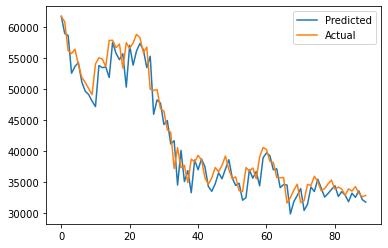

(12, 0.2)
rmse:  2578.5649510355056
mape:  0.04667610261741873


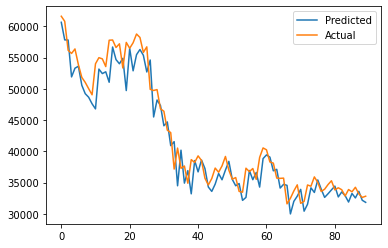

(12, 0.3)
rmse:  2805.2059348055664
mape:  0.053163142926717616


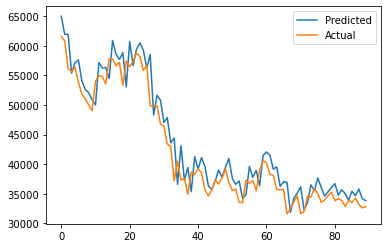

(14, 0.1)
rmse:  2260.024993988328
mape:  0.04092531410215846


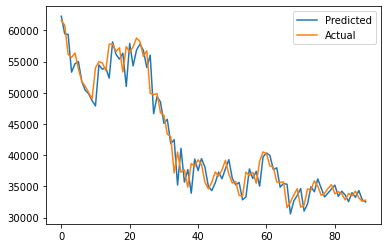

(14, 0.2)
rmse:  2722.987654385655
mape:  0.05017263564497153


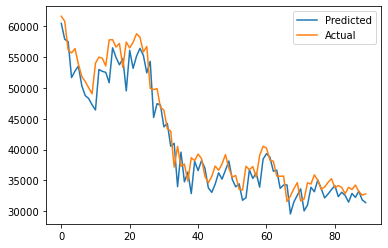

(14, 0.3)
rmse:  3232.3875446796606
mape:  0.05999679423970589


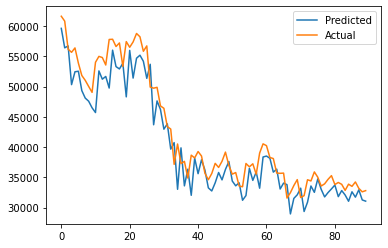

(16, 0.1)
rmse:  2330.807028425427
mape:  0.0421448752713161


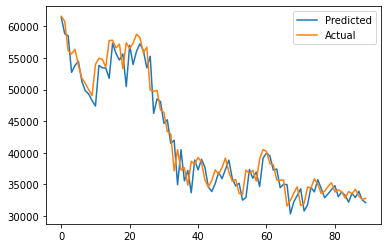

(16, 0.2)
rmse:  3438.049133890996
mape:  0.06577847503980887


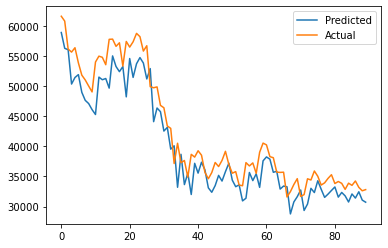

(16, 0.3)
rmse:  3341.7724942768114
mape:  0.063349270896655


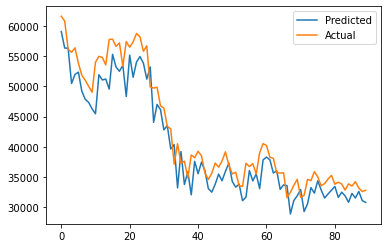

(32, 0.1)
rmse:  7569.80059886684
mape:  0.14756276729651208


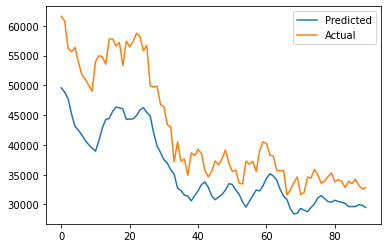

(32, 0.2)
rmse:  5866.159655502146
mape:  0.11579886839642213


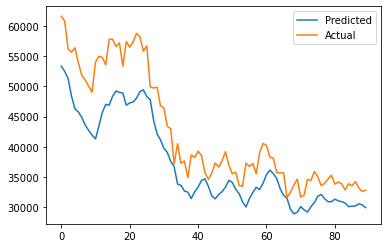

(32, 0.3)
rmse:  4014.6660161199156
mape:  0.06471079178885719


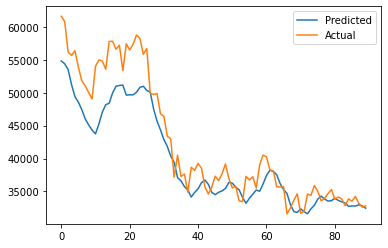

In [220]:
best_mape2 = ''
best_mape = 1
for x in cluster_combo_list2:
    df_training_scaled_train = df_for_training_scaled_btc[0:-100]
    df_training_scaled_test = df_for_training_scaled_btc[len(df_for_training_scaled_btc) - 100:,]


    #Empty lists to be populated using formatted training data
    trainX2 = []
    trainY2 = []
    n_past = 10


    n_future = 1   # Number of days we want to look into the future based on the past days.
   
    for i in range(n_past, len(df_training_scaled_train) - n_future +1):
        trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_btc.shape[1]])
        trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

    trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


    model2 = Sequential()
    model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
    model2.add(Dense(trainY2.shape[1]))


    list2 = [model2]

    for model in list2:

        model.compile(optimizer='adam', loss='mse')

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

        history = model.fit(trainX2, trainY2, epochs=200, batch_size=x[0], validation_split=x[1], callbacks=[es], verbose=0)

        y_pred = []
        y_true = []
        for i in range(len(df_training_scaled_test)-10):

            test_day2 = []
            test_day2.append(df_training_scaled_test[i:i+10, ])
            actual = []
            actual.append(df_training_scaled_test[i+10])


              #let us predict past 15 days

            test2 = np.array(test_day2)
            actual2 = np.array(actual)

            #Make prediction
            prediction6 = model.predict(test2) #shape = (n, 1) where n is the n_days_for_prediction

            #Perform inverse transformation to rescale back to original range
            #Since we used 5 variables for transform, the inverse expects same dimensions
            #Therefore, let us copy our values 5 times and discard them after inverse transform
            prediction_copies6 = np.repeat(prediction6, df_for_training2_btc.shape[1], axis=-1)
            y_pred_future6 = scaler5.inverse_transform(prediction_copies6)[:,0]

            actual3 = scaler5.inverse_transform(actual2)

            y_pred.append(y_pred_future6[0])
            y_true.append(actual3[0][0])
            
        
        print(x)


        mse = mean_squared_error(y_true, y_pred)
        rmse = math. sqrt(mse)
        print('rmse: ', rmse)
        
        mape = mean_absolute_percentage_error(y_true, y_pred)
        print('mape: ', mape)
        
        if mape < best_mape:
            best_mape = mape
            best_mape2 = str(mape) + '_' + str(x)

        

        plt.plot(y_pred, label='Predicted')
        plt.plot(y_true, label='Actual')
        plt.legend()
        plt.show()



In [221]:
best_mape2

'0.04092531410215846_(14, 0.1)'

## LSTM - logarithms

In [490]:
all_btc_data3 = all_btc_data.drop('new_close',axis=1)

In [491]:
all_btc_data3 = all_btc_data[['PriceUSD']]

In [492]:
log_all_btc_data = np.log(all_btc_data3)

In [493]:
df_for_training_all_btc_data = log_all_btc_data[['PriceUSD']].astype(float)

In [494]:
df_for_training2_all_btc_data = df_for_training_all_btc_data[0:-100]

In [495]:
scaler5 = scaler5.fit(df_for_training2_all_btc_data)
df_for_training_scaled_all_btc_data = scaler5.transform(df_for_training2_all_btc_data)

(12, 0.1)
rmse:  4114.53461096925
mape:  0.06921103273921812


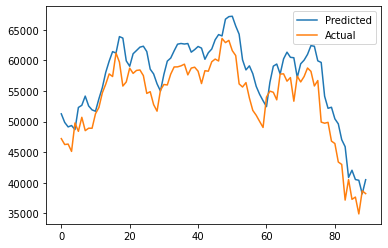

(12, 0.2)
rmse:  2901.78700573867
mape:  0.04659501088122571


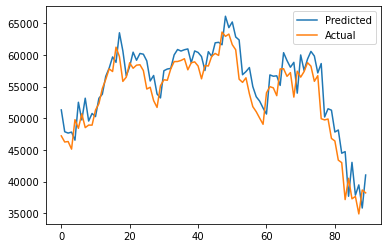

(12, 0.3)
rmse:  3737.32612721894
mape:  0.0602072966922349


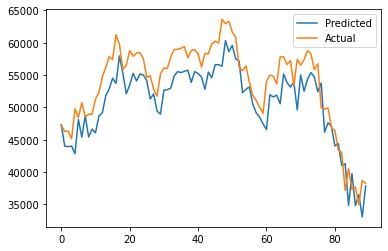

(14, 0.1)
rmse:  8901.458328820938
mape:  0.14773883974001953


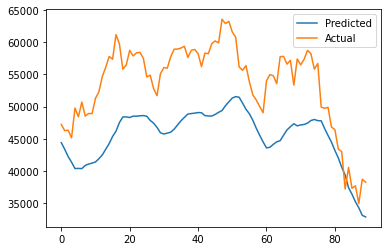

(14, 0.2)
rmse:  2997.3343669452174
mape:  0.04884623313324272


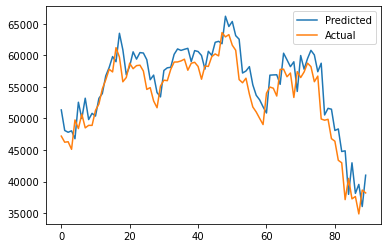

(14, 0.3)
rmse:  2344.9622473221184
mape:  0.03484835949984769


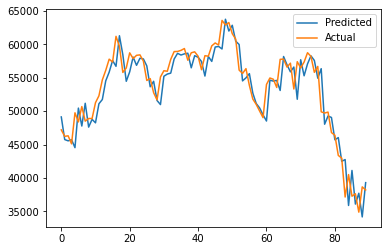

(16, 0.1)
rmse:  2237.634850496934
mape:  0.03270434010377589


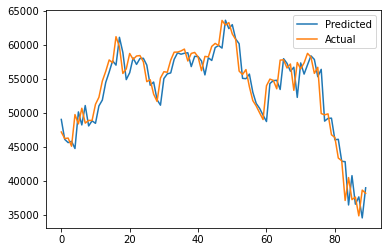

(16, 0.2)
rmse:  2269.631080083575
mape:  0.033336361820970835


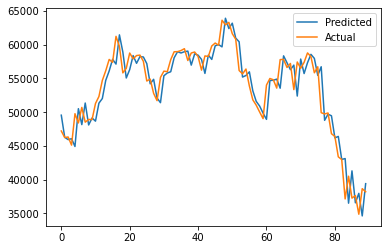

(16, 0.3)
rmse:  2805.1376962796867
mape:  0.045030623444009106


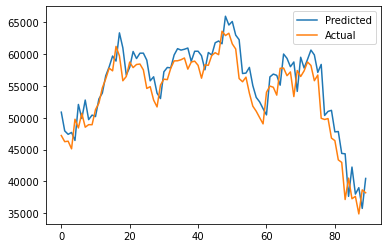

(32, 0.1)
rmse:  5517.410095725073
mape:  0.0887524615766742


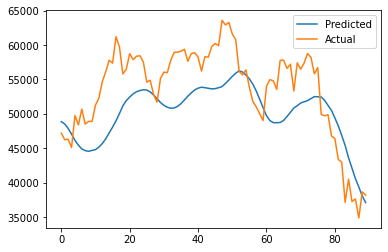

(32, 0.2)
rmse:  2407.818597137688
mape:  0.0365560411448317


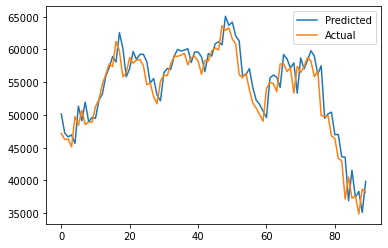

(32, 0.3)
rmse:  2122.0213949039944
mape:  0.031846848738110646


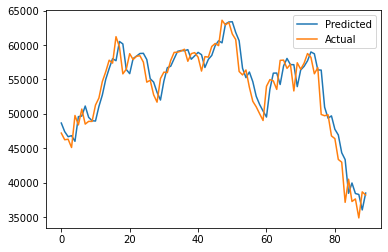

In [496]:
best_mape2 = ''
best_mape = 1
for x in cluster_combo_list2:
    df_training_scaled_train = df_for_training_scaled_all_btc_data[0:-100]
    df_training_scaled_test = df_for_training_scaled_all_btc_data[len(df_for_training_scaled_all_btc_data) - 100:,]


    #Empty lists to be populated using formatted training data
    trainX2 = []
    trainY2 = []
    n_past = 10


    n_future = 1   
    
    for i in range(n_past, len(df_training_scaled_train) - n_future +1):
        trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_all_btc_data.shape[1]])
        trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

    trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


    model2 = Sequential()
    model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
    model2.add(Dense(trainY2.shape[1]))


    list2 = [model2]

    for model in list2:

        model.compile(optimizer='adam', loss='mse')

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

        history = model.fit(trainX2, trainY2, epochs=200, batch_size=x[0], validation_split=x[1], callbacks=[es], verbose=0)

        y_pred = []
        y_true = []
        for i in range(len(df_training_scaled_test)-10):

            test_day2 = []
            test_day2.append(df_training_scaled_test[i:i+10, ])
            actual = []
            actual.append(df_training_scaled_test[i+10])


          

            test2 = np.array(test_day2)
            actual2 = np.array(actual)

            #Make prediction
            prediction6 = model.predict(test2) 
            prediction_copies6 = np.repeat(prediction6, df_for_training2_all_btc_data.shape[1], axis=-1)
            y_pred_future6 = scaler5.inverse_transform(prediction_copies6)[:,0]

            actual3 = scaler5.inverse_transform(actual2)

            y_pred.append(y_pred_future6[0])
            y_true.append(actual3[0][0])
            
        y_pred2 = [i for i in np.exp(y_pred)]
        y_true2 = [i for i in np.exp(y_true)]
            
        
        print(x)


        mse = mean_squared_error(y_true2, y_pred2)
        rmse = math. sqrt(mse)
        print('rmse: ', rmse)
        
        mape = mean_absolute_percentage_error(y_true2, y_pred2)
        print('mape: ', mape)
        
        if mape < best_mape:
            best_mape = mape
            best_mape2 = str(mape) + '_' + str(x)

        

        plt.plot(y_pred2, label='Predicted')
        plt.plot(y_true2, label='Actual')
        plt.legend()
        plt.show()



In [372]:
best_mape2

'0.04758086146153458_(12, 0.3)'

## LSTM - multivariate

In [120]:
scaler6=MinMaxScaler(feature_range=(0,1))

In [121]:
lstm_btc_multi = all_btc_data.drop('new_close',axis=1)

In [122]:
lstm_btc_multi = all_btc_data[selected_feat_btc]

In [123]:
lstm_btc_multi['priceUSD'] = lstm_btc_multi['PriceUSD']

In [124]:
cols = list(lstm_btc_multi.columns)

In [125]:
len(cols)

6

In [126]:
cols = [cols[-1]] + cols[:-1]
lstm_btc_multi = lstm_btc_multi[cols]

In [127]:
df_for_training_multi_lstm = lstm_btc_multi[cols].astype(float)

In [128]:
df_for_training2_multi_lstm = df_for_training_multi_lstm[0:-50]

In [129]:
scaler6 = scaler6.fit(df_for_training2_multi_lstm)
df_for_training_scaled_btc_multi = scaler6.transform(df_for_training2_multi_lstm)

(12, 0.1)
rmse:  8314.170529885421
mape:  0.1885655101646466


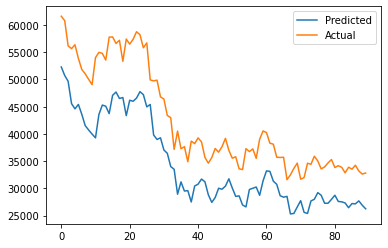

(12, 0.2)
rmse:  6022.350765442973
mape:  0.1283222746656869


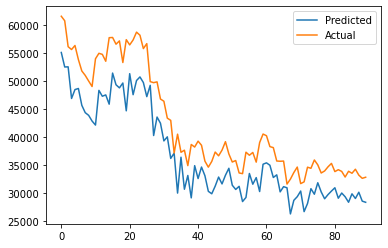

(12, 0.3)
rmse:  6027.763279087091
mape:  0.12688716843087858


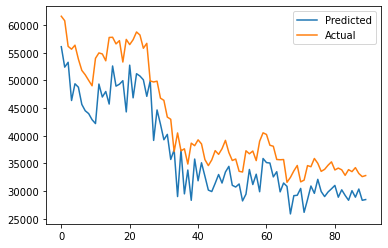

(14, 0.1)
rmse:  6507.733990438899
mape:  0.13868799975677548


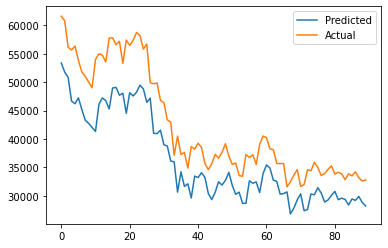

(14, 0.2)
rmse:  7900.872907550262
mape:  0.1747181521283739


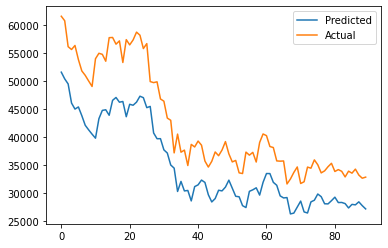

(14, 0.3)
rmse:  8647.86494385578
mape:  0.1905333988435515


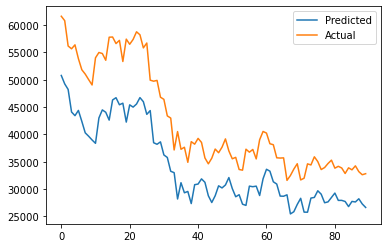

(16, 0.1)
rmse:  8616.432976518141
mape:  0.1890429289259343


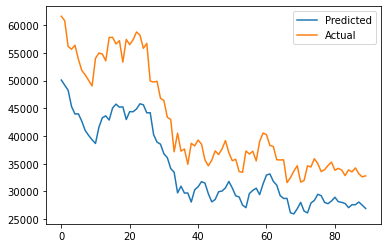

(16, 0.2)
rmse:  7302.001948375706
mape:  0.1604840986924168


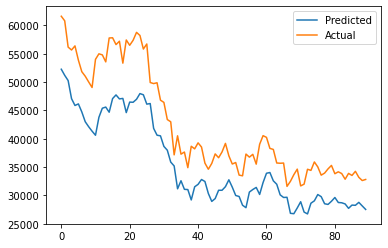

(16, 0.3)
rmse:  9080.961605629825
mape:  0.2033109260092088


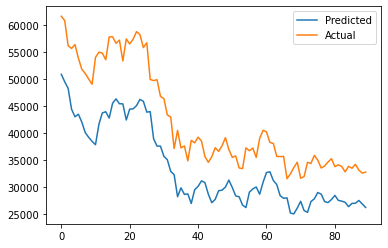

(32, 0.1)
rmse:  13877.874369835492
mape:  0.31663216415140266


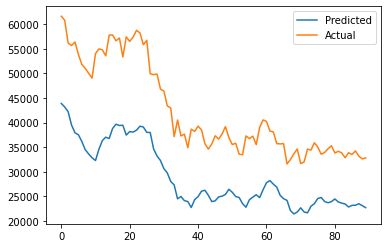

(32, 0.2)
rmse:  10424.32125897376
mape:  0.2363822371954359


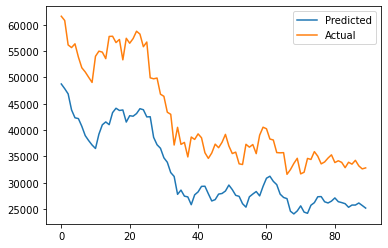

(32, 0.3)
rmse:  15520.06687443798
mape:  0.3647280881112997


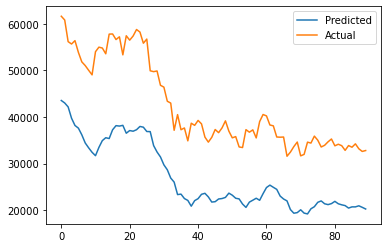

In [130]:
for x in cluster_combo_list2:
    df_training_scaled_train = df_for_training_scaled_btc_multi[0:-100]
    df_training_scaled_test = df_for_training_scaled_btc_multi[len(df_for_training_scaled_btc_multi) - 100:,]


    #Empty lists to be populated using formatted training data
    trainX2 = []
    trainY2 = []
    n_past = 10


    n_future = 1  
    for i in range(n_past, len(df_training_scaled_train) - n_future +1):
        trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_multi_lstm.shape[1]])
        trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

    trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


    model2 = Sequential()
    model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
    model2.add(Dense(trainY2.shape[1]))


    list2 = [model2]

    for model in list2:

        model.compile(optimizer='adam', loss='mse')

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

        history = model.fit(trainX2, trainY2, epochs=200, batch_size=x[0], validation_split=x[1], callbacks=[es], verbose=0)

        y_pred = []
        y_true = []
        for i in range(len(df_training_scaled_test)-10):

            test_day2 = []
            test_day2.append(df_training_scaled_test[i:i+10, ])
            actual = []
            actual.append(df_training_scaled_test[i+10])


              #let us predict past 15 days

            test2 = np.array(test_day2)
            actual2 = np.array(actual)

            #Make prediction
            prediction6 = model.predict(test2) 
            prediction_copies6 = np.repeat(prediction6, df_for_training2_multi_lstm.shape[1], axis=-1)
            y_pred_future6 = scaler6.inverse_transform(prediction_copies6)[:,0]

            actual3 = scaler6.inverse_transform(actual2)

            y_pred.append(y_pred_future6[0])
            y_true.append(actual3[0][0])
            
        
        print(x)


        mse = mean_squared_error(y_true, y_pred)
        rmse = math. sqrt(mse)
        print('rmse: ', rmse)
        
        mape = mean_absolute_percentage_error(y_true, y_pred)
        print('mape: ', mape)


        plt.plot(y_pred, label='Predicted')
        plt.plot(y_true, label='Actual')
        plt.legend()
        plt.show()



In [21]:
list(all_btc_data.columns)

['/v1/metrics/addresses/count',
 '/v1/metrics/addresses/sending_count',
 '/v1/metrics/addresses/receiving_count',
 '/v1/metrics/addresses/active_count',
 '/v1/metrics/addresses/new_non_zero_count',
 '/v1/metrics/addresses/min_point_zero_1_count',
 '/v1/metrics/addresses/min_point_1_count',
 '/v1/metrics/addresses/min_1_count',
 '/v1/metrics/addresses/min_10_count',
 '/v1/metrics/addresses/min_100_count',
 '/v1/metrics/addresses/min_1k_count',
 '/v1/metrics/addresses/min_10k_count',
 '/v1/metrics/transactions/transfers_volume_median',
 '/v1/metrics/transactions/transfers_volume_adjusted_sum',
 '/v1/metrics/transactions/transfers_volume_adjusted_mean',
 '/v1/metrics/transactions/transfers_volume_adjusted_median',
 '/v1/metrics/transactions/transfers_volume_between_exchanges_sum',
 '/v1/metrics/transactions/transfers_volume_from_exchanges_mean',
 '/v1/metrics/transactions/transfers_volume_exchanges_net',
 '/v1/metrics/transactions/transfers_to_exchanges_count',
 '/v1/metrics/transactions/

## LSTM - multivariate, hand picked features

In [420]:
selected_feat_btc2 = ['/v1/metrics/indicators/stock_to_flow_deflection']

In [421]:
scaler7=MinMaxScaler(feature_range=(0,1))

In [422]:
lstm_btc_multi_2 = all_btc_data.drop('new_close',axis=1)

In [423]:
lstm_btc_multi_2 = all_btc_data[selected_feat_btc2]

In [424]:
lstm_btc_multi_2['priceUSD'] = all_btc_data['PriceUSD']

In [425]:
cols = list(lstm_btc_multi_2.columns)

In [426]:
len(cols)

2

In [427]:
cols = [cols[-1]] + cols[:-1]
lstm_btc_multi_2 = lstm_btc_multi_2[cols]

In [428]:
df_for_training_multi_lstm_2 = lstm_btc_multi_2[cols].astype(float)

In [429]:
df_for_training2_multi_lstm_2 = df_for_training_multi_lstm_2.copy()

In [430]:
scaler7 = scaler7.fit(df_for_training2_multi_lstm_2)
df_for_training_scaled_btc_multi = scaler7.transform(df_for_training2_multi_lstm_2)

(12, 0.1)
rmse:  2287.5849226020246
mape:  0.0410954465604791


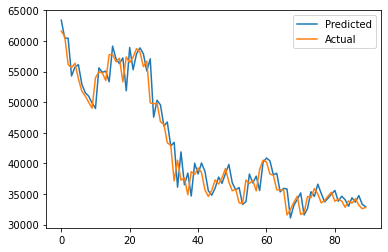

(12, 0.2)
rmse:  2628.151615361827
mape:  0.04748601614657588


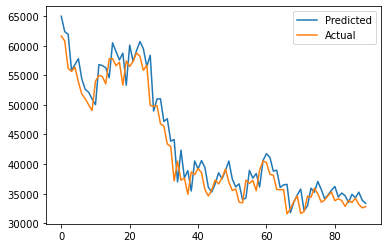

(12, 0.3)
rmse:  3748.738694917953
mape:  0.0753857002423893


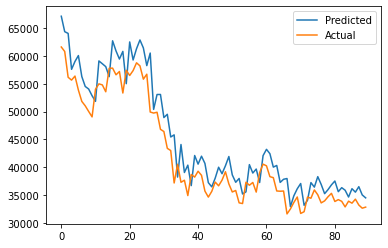

(14, 0.1)
rmse:  2175.112919822152
mape:  0.03952158786646833


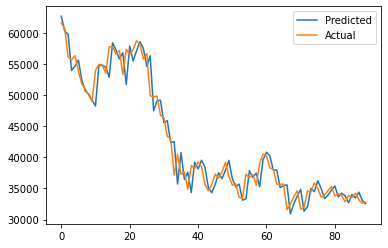

(14, 0.2)
rmse:  2225.7925586095266
mape:  0.039709551757262804


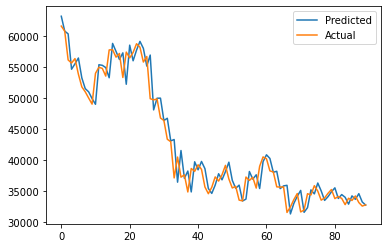

(14, 0.3)
rmse:  2277.5354913360475
mape:  0.04062543644321271


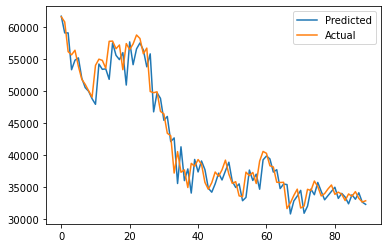

(16, 0.1)
rmse:  2238.1441371934534
mape:  0.04053307537473779


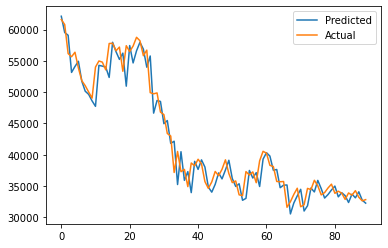

(16, 0.2)
rmse:  2346.028286734371
mape:  0.041959019208922976


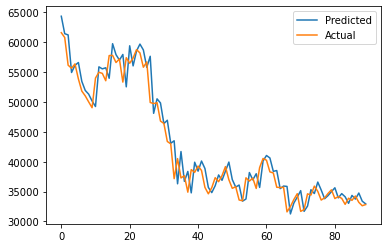

(16, 0.3)
rmse:  2531.6859588101506
mape:  0.04633329509811188


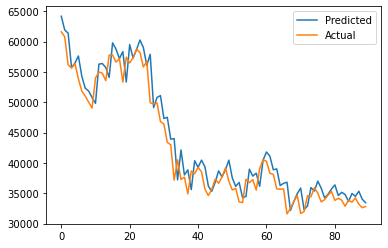

(32, 0.1)
rmse:  3961.681061732571
mape:  0.06540590111562411


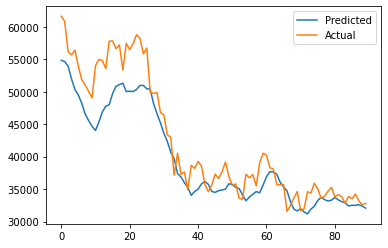

(32, 0.2)
rmse:  2162.6763160344103
mape:  0.0388974998677688


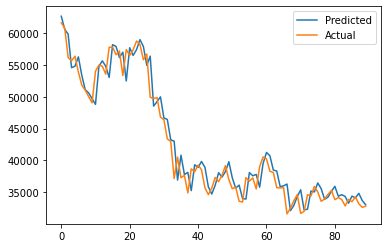

(32, 0.3)
rmse:  2283.349014894045
mape:  0.040851256877275394


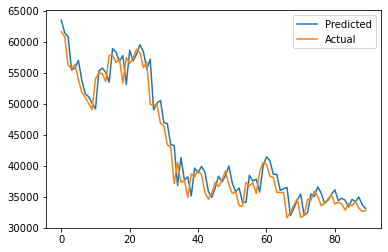

In [119]:
for x in cluster_combo_list2:
    df_training_scaled_train = df_for_training_scaled_btc_multi[0:-100]
    df_training_scaled_test = df_for_training_scaled_btc_multi[len(df_for_training_scaled_btc_multi) - 100:,]


    #Empty lists to be populated using formatted training data
    trainX2 = []
    trainY2 = []
    n_past = 10


    n_future = 1   
    for i in range(n_past, len(df_training_scaled_train) - n_future +1):
        trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_multi_lstm_2.shape[1]])
        trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

    trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


    model2 = Sequential()
    model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
    model2.add(Dense(trainY2.shape[1]))


    list2 = [model2]

    for model in list2:

        model.compile(optimizer='adam', loss='mse')

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

        history = model.fit(trainX2, trainY2, epochs=200, batch_size=x[0], validation_split=x[1], callbacks=[es], verbose=0)

        y_pred = []
        y_true = []
        for i in range(len(df_training_scaled_test)-10):

            test_day2 = []
            test_day2.append(df_training_scaled_test[i:i+10, ])
            actual = []
            actual.append(df_training_scaled_test[i+10])



            test2 = np.array(test_day2)
            actual2 = np.array(actual)

            #Make prediction
            prediction6 = model.predict(test2) 
            prediction_copies6 = np.repeat(prediction6, df_for_training2_multi_lstm_2.shape[1], axis=-1)
            y_pred_future6 = scaler7.inverse_transform(prediction_copies6)[:,0]

            actual3 = scaler7.inverse_transform(actual2)

            y_pred.append(y_pred_future6[0])
            y_true.append(actual3[0][0])
            
        
        print(x)


        mse = mean_squared_error(y_true, y_pred)
        rmse = math. sqrt(mse)
        print('rmse: ', rmse)
        
        mape = mean_absolute_percentage_error(y_true, y_pred)
        print('mape: ', mape)


        plt.plot(y_pred, label='Predicted')
        plt.plot(y_true, label='Actual')
        plt.legend()
        plt.show()

# best parameter = 32, 0.2, rmse:  2162.6763160344103, mape: 0.0388974998677688

## LSTM - multivariate, hand picked features- different look back times

5
rmse:  2146.6218395515675
mape:  0.03718179243738063


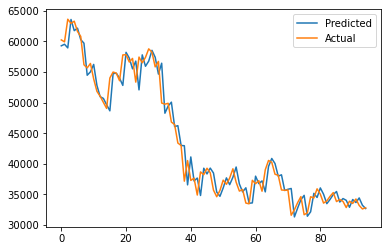

10
rmse:  2167.3165531910927
mape:  0.03875474428628025


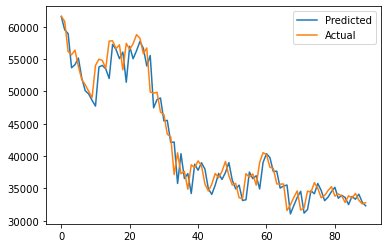

20
rmse:  2317.367231896638
mape:  0.0421410083453517


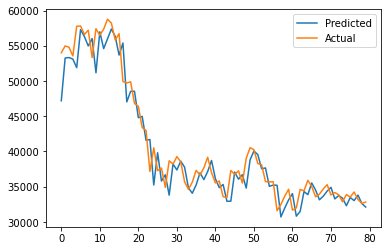

50
rmse:  1773.6745676639605
mape:  0.039611031908845476


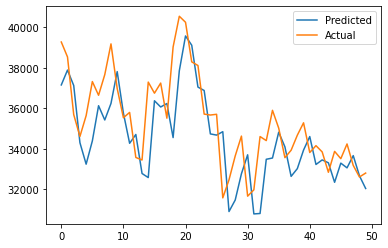

In [261]:
best_mape2 = ''
best_mape = 1
look_back = [5,10,20,50]
for x in look_back:
    df_training_scaled_train = df_for_training_scaled_btc_multi[0:-100]
    df_training_scaled_test = df_for_training_scaled_btc_multi[len(df_for_training_scaled_btc_multi) - 100:,]


    #Empty lists to be populated using formatted training data
    trainX2 = []
    trainY2 = []
    n_past = x


    n_future = 1  
    for i in range(n_past, len(df_training_scaled_train) - n_future +1):
        trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_multi_lstm_2.shape[1]])
        trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

    trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


    model2 = Sequential()
    model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
    model2.add(Dense(trainY2.shape[1]))


    list2 = [model2]

    for model in list2:

        model.compile(optimizer='adam', loss='mse')

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

        history = model.fit(trainX2, trainY2, epochs=200, batch_size=32, validation_split=0.2, callbacks=[es], verbose=0)

        y_pred = []
        y_true = []
        for i in range(len(df_training_scaled_test)-x):

            test_day2 = []
            test_day2.append(df_training_scaled_test[i:i+x, ])
            actual = []
            actual.append(df_training_scaled_test[i+x])


              #let us predict past 15 days

            test2 = np.array(test_day2)
            actual2 = np.array(actual)

            #Make prediction
            prediction6 = model.predict(test2) 
            prediction_copies6 = np.repeat(prediction6, df_for_training2_multi_lstm_2.shape[1], axis=-1)
            y_pred_future6 = scaler7.inverse_transform(prediction_copies6)[:,0]

            actual3 = scaler7.inverse_transform(actual2)

            y_pred.append(y_pred_future6[0])
            y_true.append(actual3[0][0])
            
        
        print(x)


        mse = mean_squared_error(y_true, y_pred)
        rmse = math. sqrt(mse)
        print('rmse: ', rmse)
        
        mape = mean_absolute_percentage_error(y_true, y_pred)
        print('mape: ', mape)
        
        if mape < best_mape:
            best_mape = mape
            best_mape2 = str(mape) + '_' + str(x)


        plt.plot(y_pred, label='Predicted')
        plt.plot(y_true, label='Actual')
        plt.legend()
        plt.show()

# best parameter = 32, 0.2, rmse:  2162.6763160344103, mape: 0.0388974998677688

## SVM - multivariate

In [7]:
c = [0.1, 0.01, 0.2]
kernel = ['poly', 'rbf']
gamma = ['scale', 'auto']  # note: svm was previously grid searched, but often kernel fails so a few examples have been left

In [8]:
svc_params = [c, kernel, gamma]

In [9]:
cluster_combo_list3 = list(itertools.product(*svc_params))
cluster_combo_list3

[(0.1, 'poly', 'scale'),
 (0.1, 'poly', 'auto'),
 (0.1, 'rbf', 'scale'),
 (0.1, 'rbf', 'auto'),
 (0.01, 'poly', 'scale'),
 (0.01, 'poly', 'auto'),
 (0.01, 'rbf', 'scale'),
 (0.01, 'rbf', 'auto'),
 (0.2, 'poly', 'scale'),
 (0.2, 'poly', 'auto'),
 (0.2, 'rbf', 'scale'),
 (0.2, 'rbf', 'auto')]

In [17]:
btc_classifier_svm = all_btc_data.iloc[1:]

In [18]:
list1 = []
for i in range(len(btc_classifier_svm)):
    if btc_classifier_svm['new_close'].iloc[i] > btc_classifier_svm['PriceUSD'].iloc[i]:
        list1.append(1)
    else:
        list1.append(0)

In [19]:
btc_classifier_svm['new_close2'] = list1

In [20]:
y_btc_svm = btc_classifier_svm[['new_close2']]

In [21]:
btc_classifier_svm.drop(['new_close', 'new_close2'], axis=1, inplace=True)

In [22]:
x_train,x_test,y_train,y_test=sklearn.model_selection.train_test_split(btc_classifier_svm,y_btc_svm.values.ravel(),test_size=0.3)

In [23]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100, random_state=3))
sel.fit(x_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(random_state=3))

In [24]:
selected_feat= x_train.columns[(sel.get_support())]
len(selected_feat)

49

In [25]:
print(selected_feat)

Index(['/v1/metrics/transactions/transfers_volume_from_exchanges_mean',
       '/v1/metrics/transactions/transfers_volume_exchanges_net',
       '/v1/metrics/transactions/transfers_volume_to_exchanges_sum',
       '/v1/metrics/transactions/transfers_volume_from_exchanges_sum',
       '/v1/metrics/fees/volume_mean', '/v1/metrics/indicators/nvts',
       '/v1/metrics/indicators/sopr_adjusted',
       '/v1/metrics/indicators/cdd90_age_adjusted',
       '/v1/metrics/indicators/cdd', '/v1/metrics/indicators/asol',
       '/v1/metrics/indicators/realized_profit_loss_ratio',
       '/v1/metrics/indicators/realized_profit',
       '/v1/metrics/indicators/realized_loss',
       '/v1/metrics/indicators/sol_1d_1w', '/v1/metrics/indicators/sol_1w_1m',
       '/v1/metrics/indicators/sol_3m_6m', '/v1/metrics/indicators/sol_6m_12m',
       '/v1/metrics/indicators/sol_1y_2y', '/v1/metrics/indicators/sol_2y_3y',
       '/v1/metrics/indicators/svl_1h_24h', '/v1/metrics/indicators/svl_1d_1w',
       '/v1

In [26]:
fresh_train_btc_svm = btc_classifier_svm[selected_feat][0:-100]
fresh_train_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][0:-100]
y_train_btc_svm = y_btc_svm[0:-100]
fresh_test_btc_svm = btc_classifier_svm[selected_feat][-100:-50]
fresh_test_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][-100:-50]
y_test_btc_svm = y_btc_svm[-100:-50]

In [41]:
scaler = MinMaxScaler()

In [42]:
btc_classifier_svm2 = scaler.fit_transform(btc_classifier_svm[['PriceUSD']])

In [43]:
fresh_train_btc_svm = btc_classifier_svm[selected_feat][0:-100]
fresh_train_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][0:-100]
y_train_btc_svm = y_btc_svm[0:-100]
fresh_test_btc_svm = btc_classifier_svm[selected_feat][-100:-50]
fresh_test_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][-100:-50]
y_test_btc_svm = y_btc_svm[-100:-50]

In [46]:
model = svm.SVC(kernel='rbf', C=10000, gamma='scale')
model.fit(fresh_train_btc_svm, np.array(y_train_btc_svm))

#     y_pred = []
#     y_true = []
#     for i in range(len(fresh_test_btc_svm2)):
#         test = fresh_test_btc_svm2[i-1]
#         actual = y_test_btc_svm2.iloc[i]
#         test = np.array(test).reshape((1,-1))
#         pred_value = model.predict(test)
#         y_pred.append(pred_value)
#         y_true.append(actual)


predictions = model.predict(fresh_test_btc_svm)

actual = list(y_test_btc_svm.new_close2)

# plot_decision_regions((fresh_train_btc_svm2), (y_new.flatten()), clf=model, legend=2)


fpr, tpr, thresholds = metrics.roc_curve(predictions, actual, pos_label=1)
print(metrics.auc(fpr, tpr))

print('confusion_matrix: \n', confusion_matrix(predictions, actual), '\n')

0.2553191489361702
confusion_matrix: 
 [[ 0  3]
 [23 24]] 



## SVC - univariate

In [41]:
scaler = MinMaxScaler()

In [42]:
btc_classifier_svm2 = scaler.fit_transform(btc_classifier_svm[['PriceUSD']])

In [43]:
fresh_train_btc_svm = btc_classifier_svm[selected_feat][0:-100]
fresh_train_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][0:-100]
y_train_btc_svm = y_btc_svm[0:-100]
fresh_test_btc_svm = btc_classifier_svm[selected_feat][-100:-50]
fresh_test_btc_svm['PriceUSD'] = btc_classifier_svm['PriceUSD'][-100:-50]
y_test_btc_svm = y_btc_svm[-100:-50]

In [46]:
model = svm.SVC(kernel='rbf', C=10000, gamma='scale')
model.fit(fresh_train_btc_svm, np.array(y_train_btc_svm))

#     y_pred = []
#     y_true = []
#     for i in range(len(fresh_test_btc_svm2)):
#         test = fresh_test_btc_svm2[i-1]
#         actual = y_test_btc_svm2.iloc[i]
#         test = np.array(test).reshape((1,-1))
#         pred_value = model.predict(test)
#         y_pred.append(pred_value)
#         y_true.append(actual)


predictions = model.predict(fresh_test_btc_svm)

actual = list(y_test_btc_svm.new_close2)

# plot_decision_regions((fresh_train_btc_svm2), (y_new.flatten()), clf=model, legend=2)


fpr, tpr, thresholds = metrics.roc_curve(predictions, actual, pos_label=1)
print(metrics.auc(fpr, tpr))

print('confusion_matrix: \n', confusion_matrix(predictions, actual), '\n')

0.2553191489361702
confusion_matrix: 
 [[ 0  3]
 [23 24]] 



## Final ensemble model

In [ ]:
final_train_btc_xgb_class = btc_classifier_xgb[0:-100]
y_train_btc_xgb_class = y_btc_xgb[0:-100]

In [484]:
model = XGBClassifier(gamma=5, max_depth=12, subsample=1, eval_metric='rmse')
model.fit(final_train_btc_xgb_class, y_train_btc_xgb_class)

y_pred = []
y_true = []
for i in range(len(final_test_btc_xgb)):
    test = final_test_btc_xgb.iloc[i]
    actual = y_final_test_xgb.iloc[i].values
    test = np.array(test).reshape((1,-1))
    pred_value = model.predict(test)
    y_pred.append(pred_value)
    y_true.append(actual)

    

In [456]:
model = XGBRegressor(gamma=0, max_depth=3, subsample=1, eval_metric='rmse')
model.fit(final_reg_train2, final_reg_y_train2)

y_pred2 = []
y_true2 = []
for i in range(len(final_reg_test2)):
    test = final_reg_test2.iloc[i]
    actual = final_reg_y.iloc[i].values
    test = np.array(test).reshape((1,-1))
    pred_value = model.predict(test)
    y_pred2.append(pred_value)
    y_true2.append(actual)


In [ ]:
df_training_scaled_train = df_for_training_scaled_btc_multi[0:-110]
df_training_scaled_test = df_for_training_scaled_btc_multi[len(df_for_training_scaled_btc_multi) - 110:,]


#Empty lists to be populated using formatted training data
trainX2 = []
trainY2 = []
n_past = 10


n_future = 1   
for i in range(n_past, len(df_training_scaled_train) - n_future +1):
    trainX2.append(df_training_scaled_train[i - n_past:i, 0:df_for_training2_multi_lstm_2.shape[1]])
    trainY2.append(df_training_scaled_train[i + n_future - 1:i + n_future, 0])

trainX2, trainY2 = np.array(trainX2), np.array(trainY2)


model2 = Sequential()
model2.add(Bidirectional(LSTM(64, return_sequences=False), input_shape=(trainX2.shape[1], trainX2.shape[2])))
model2.add(Dense(trainY2.shape[1]))


list2 = [model2]

for model in list2:

    model.compile(optimizer='adam', loss='mse')

    es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)

    history = model.fit(trainX2, trainY2, epochs=200, batch_size=32, validation_split=0.2, callbacks=[es], verbose=0)

    y_pred3 = []
    y_true3 = []
    for i in range(len(df_training_scaled_test)-10):

        test_day2 = []
        test_day2.append(df_training_scaled_test[i:i+10, ])
        actual = []
        actual.append(df_training_scaled_test[i+10])


          #let us predict past 15 days

        test2 = np.array(test_day2)
        actual2 = np.array(actual)

        #Make prediction
        prediction6 = model.predict(test2) 
        prediction_copies6 = np.repeat(prediction6, df_for_training2_multi_lstm_2.shape[1], axis=-1)
        y_pred_future6 = scaler7.inverse_transform(prediction_copies6)[:,0]

        actual3 = scaler7.inverse_transform(actual2)

        y_pred3.append(y_pred_future6[0])
        y_true3.append(actual3[0][0])


In [488]:
d = 0  # start with 1000, set of conndtions upon which to conduct trades on, daily for 100 days
c = 0
b = 0
a = 1000
for i in range(100):
    c = b
    if (int(y_pred[i]) == 1) & (b == 0) & (y_pred2[i][0] >= final_test_btc_xgb[['PriceUSD']].iloc[i][0]) & (y_pred3[i] >= final_test_btc_xgb[['PriceUSD']].iloc[i][0]):
        b = a / final_test_btc_xgb[['PriceUSD']].iloc[i][0]
        d = final_test_btc_xgb[['PriceUSD']].iloc[i][0]
    elif (int(y_pred[i]) == 0) & (b != 0) & (d <= final_test_btc_xgb[['PriceUSD']].iloc[i][0]) & (y_pred2[i][0] < final_test_btc_xgb[['PriceUSD']].iloc[i][0]) & (y_pred3[i] < final_test_btc_xgb[['PriceUSD']].iloc[i][0]) :
        b = 0
        a = c * final_test_btc_xgb[['PriceUSD']].iloc[i][0]
# based on all three models

In [398]:
d = 0
c = 0
b = 0
a = 1000
for i in range(100):
    c = b
    if (int(y_pred[i]) == 1) & (b == 0):
        b = a / final_test_btc_xgb[['PriceUSD']].iloc[i][0]
        d = final_test_btc_xgb[['PriceUSD']].iloc[i][0]
    elif (int(y_pred[i]) == 0) & (b != 0) & (d <= final_test_btc_xgb[['PriceUSD']].iloc[i][0]):
        b = 0
        a = c * final_test_btc_xgb[['PriceUSD']].iloc[i][0]
 # based only on xgb classification model

In [489]:
a # trade

1286.632208306642

In [385]:
(1000 / final_test_btc_xgb[['PriceUSD']].iloc[0][0]) * final_test_btc_xgb[['PriceUSD']].iloc[99][0] #buy and hold

1256.5936757670543